# Graphs to display nutritional values of seaweed from CIQUAL database

## imports

In [417]:
import pandas as pd
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from lxml import etree # for importing other dataset that has 'alim_nom_fr' + 'ALIM_INDEX_FR' columns

import unicodedata # for cleaning CEVA df before merging

from dotenv import load_dotenv
import os

load_dotenv(override=True) 


True

In [418]:
pd.set_option('display.max_colwidth', None)

In [419]:
df_ciqual = pd.read_excel('data/TableCiqual2020_ENG_2020_07_07.xlsx')

df_ciqual.head()

/opt/anaconda3/lib/python3.11/site-packages/openpyxl/worksheet/header_footer.py:48: UserWarning:

Cannot parse header or footer so it will be ignored



,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g)
0,0,0,0,NaN,NaN,NaN,24999,Desert (average),NaN,NaN,NaN,NaN,NaN,"45,4","4,63","4,61","36,6","12,9","23,7","1,81",NaN,"2,18","1,89","1,07","15,7","9,53","1,54",NaN,"0,92","0,081","0,083","5,18","4,74","1,68","0,14","0,19","0,083","0,14","0,35","0,55","2,47","0,99","4,62","1,32","0,37","0,012","0,0041","0,0051","56,7","0,38",75,178,"0,15","1,45",11,"23,8","0,23",107,181,"7,04",153,"0,5","56,3","34,6","0,27","1,97",NaN,NaN,"1,37","0,084","0,15","0,61","0,4","0,056","30,8","0,21"
1,1,101,0,starters and dishes,mixed salads,-,25601,"Prepared mixed tuna and vegetable salad, canned",NaN,-,-,-,-,"76,5","9,15","9,15","7,74","4,7","3,08","0,82",-,"0,78",-,"< 0,3","0,97","4,1","2,7",-,"1,79",0,-,"0,56","1,83","1,76","< 0,05","< 0,05","< 0,05","< 0,05","< 0,05","0,008","0,38","0,12",-,"1,15","0,056",-,"0,008","0,039","19,2","1,11","20,7",731,"0,1","1,1",2,"25,1","0,1","88,4",232,-,445,"0,6",< 2,-,"< 0,5","1,6",-,-,"2,75","< 0,04","0,053","4,45","< 0,16","0,29",31,"1,45"
2,1,101,0,starters and dishes,mixed salads,-,25602,"Prepared mixed meat/fish canned, salad",NaN,-,-,-,-,"76,7","8,06","8,06","6,4","5,3","1,9","0,7",-,"0,6","< 0,2","< 0,2","0,6","3,3",2,-,"1,5",0,-,"0,16","3,27","1,54","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","0,12","0,04","2,24","1,08","0,28","0,016","0,016","0,15","15,2","0,95",22,584,"0,07","0,7",< 20,20,"0,1",92,220,30,381,"0,38",< 21,781,"0,44","2,04","9,75",-,-,"0,032","0,022","4,13","0,2","0,12","11,1","1,23"
3,1,101,0,starters and dishes,mixed salads,-,25605,"Greek-style marinated mushrooms, prepacked",NaN,-,-,-,-,"85,2","2,08","2,08","3,95","3,55","2,38","0,7",-,1,"< 0,3","< 0,3","0,3","0,99","2,35",-,"1,65",0,-,"0,23","0,2","1,67",-,-,-,-,-,-,-,-,-,-,"0,026",-,-,-,"0,11","1,26",27,-,"0,17","1,06","2,46","13,5","0,13","64,1",277,"1,79",500,"0,4",0,747,0,"1,08",-,-,"6,67","0,056","0,21","1,84","0,88","0,088","19,6","0,018"
4,1,101,0,starters and dishes,mixed salads,-,25606,"Prepared potatoes salad, home-made",NaN,-,-,-,-,76,"2,68","2,68","9,9","8,2",-,-,-,-,-,-,-,-,"1,3",-,"1,95",0,-,"1,43","2,48","3,74",-,-,-,0,"0,011","0,013","1,03","0,37",-,-,-,-,-,-,68,"1,32",19,-,"0,12","0,65",-,15,"0,1",52,254,-,529,"0,31",29,36,0,-,-,-,10,"0,077","0,06","0,89","0,53","0,14",7,0


In [420]:
df_ciqual.columns

Index(['alim_grp_code', 'alim_ssgrp_code', 'alim_ssssgrp_code',
       'alim_grp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_ssssgrp_nom_eng',
       'alim_code', 'alim_nom_eng', 'alim_nom_sci',
       'Energy, Regulation EU No 1169/2011 (kJ/100g)',
       'Energy, Regulation EU No 1169/2011 (kcal/100g)',
       'Energy, N x Jones' factor, with fibres (kJ/100g)',
       'Energy, N x Jones' factor, with fibres (kcal/100g)', 'Water (g/100g)',
       'Protein (g/100g)', 'Protein, crude, N x 6.25 (g/100g)',
       'Carbohydrate (g/100g)', 'Fat (g/100g)', 'Sugars (g/100g)',
       'fructose (g/100g)', 'galactose (g/100g)', 'glucose (g/100g)',
       'lactose (g/100g)', 'maltose (g/100g)', 'sucrose (g/100g)',
       'Starch (g/100g)', 'Fibres (g/100g)', 'Polyols (g/100g)',
       'Ash (g/100g)', 'Alcohol (g/100g)', 'Organic acids (g/100g)',
       'FA saturated (g/100g)', 'FA mono (g/100g)', 'FA poly (g/100g)',
       'FA 4:0 (g/100g)', 'FA 6:0 (g/100g)', 'FA 8:0 (g/100g)',
       'FA 10:0 (g/100g

In [421]:
def load_xml_to_df(file_path):
    parser = etree.XMLParser(recover=True, encoding="windows-1252")
    tree = etree.parse(file_path, parser)
    root = tree.getroot()

    rows = []
    for alim in root:  # direct children: <ALIM>
        row = {child.tag: child.text for child in alim}
        rows.append(row)

    return pd.DataFrame(rows)

PATH_ALIM = os.getenv("PATH_ALIM")
PATH_COMPO = os.getenv("PATH_COMPO")
PATH_CONST = os.getenv("PATH_CONST")
PATH_ALIM_GRP = os.getenv("PATH_ALIM_GRP")



df_alim = load_xml_to_df(PATH_ALIM)

df_alim.head()


,alim_code,alim_nom_fr,ALIM_NOM_INDEX_FR,alim_nom_eng,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code
0,1000,Pastis,Pastis,Pastis (anise-flavoured spirit),06,0603,060303
1,1001,Eau de vie,Eau de vie,Clear fruit brandy or eau-de-vie,06,0603,060303
2,1002,Gin,Gin,Gin,06,0603,060303
3,1003,Liqueur,Liqueur,Liqueur,06,0603,060303
4,1004,Rhum,Rhum,Rum,06,0603,060303


### import ceva_df

In [422]:
ceva_df = pd.read_csv('data/ceva_df')


In [423]:
import unicodedata

# Utility: clean column names (strip spaces, normalize unicode)
def clean_columns(df):
    df = df.copy()
    df.columns = [
        unicodedata.normalize("NFC", col.strip()) for col in df.columns
    ]
    return df

# Clean both
df_ciqual = clean_columns(df_ciqual)
ceva_df   = clean_columns(ceva_df)

# Merge on alim_nom_eng, full outer join
merged_df = pd.merge(df_ciqual, ceva_df, on="alim_nom_eng", how="outer", suffixes=("_ciqual", "_ceva"))

# For each column that exists in both, prefer CEVA values over CIQUAL
for col in ceva_df.columns:
    if col == "alim_nom_eng":
        continue
    ciqual_col = f"{col}_ciqual"
    ceva_col   = f"{col}_ceva"
    if ciqual_col in merged_df.columns and ceva_col in merged_df.columns:
        # CEVA preferred, fallback to CIQUAL if CEVA is NaN
        merged_df[col] = merged_df[ceva_col].combine_first(merged_df[ciqual_col])
        merged_df.drop(columns=[ciqual_col, ceva_col], inplace=True)
    elif ceva_col in merged_df.columns:
        # Column only in CEVA → keep as-is but rename
        merged_df.rename(columns={ceva_col: col}, inplace=True)
    elif ciqual_col in merged_df.columns:
        # Column only in CIQUAL → keep as-is but rename
        merged_df.rename(columns={ciqual_col: col}, inplace=True)

# At this point merged_df has:
# - all seaweeds (including CEVA-only one)
# - all nutrients
# - CEVA values preferred where overlaps exist

# Example: if you later want to drop the 6 CEVA-specific columns, do:
extra_cols = [
    "Minéraux  (g/100g)",
    "Polyphénols  (eq phloroglucinol)",
    "Chrome (μg/100g)",
    "Molybdène (μg/100g)",
    "VitamineA (eqrétinol) (mg/100g)",
    "VitamineB8ouHouBiotine (μg/100g)"
]
# merged_df = merged_df.drop(columns=extra_cols, errors="ignore")


In [424]:
merged_df.columns

Index(['alim_grp_code', 'alim_ssgrp_code', 'alim_ssssgrp_code',
       'alim_grp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_ssssgrp_nom_eng',
       'alim_code', 'alim_nom_eng', 'alim_nom_sci',
       'Energy, N x Jones' factor, with fibres (kJ/100g)',
       'Energy, N x Jones' factor, with fibres (kcal/100g)',
       'Protein (g/100g)', 'fructose (g/100g)', 'galactose (g/100g)',
       'glucose (g/100g)', 'lactose (g/100g)', 'maltose (g/100g)',
       'sucrose (g/100g)', 'Starch (g/100g)', 'Polyols (g/100g)',
       'Ash (g/100g)', 'Alcohol (g/100g)', 'Organic acids (g/100g)',
       'FA 4:0 (g/100g)', 'FA 6:0 (g/100g)', 'FA 8:0 (g/100g)',
       'FA 10:0 (g/100g)', 'FA 12:0 (g/100g)', 'FA 14:0 (g/100g)',
       'FA 16:0 (g/100g)', 'FA 18:0 (g/100g)', 'FA 18:1 n-9 cis (g/100g)',
       'FA 18:2 9c,12c (n-6) (g/100g)', 'FA 18:3 c9,c12,c15 (n-3) (g/100g)',
       'FA 20:4 5c,8c,11c,14c (n-6) (g/100g)',
       'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
       'FA 22:6 4c,7c,10c,13c,16c,

In [425]:
import unicodedata

# Utility: clean column names (strip spaces, normalize unicode)
def clean_columns(df):
    df = df.copy()
    df.columns = [
        unicodedata.normalize("NFC", col.strip()) for col in df.columns
    ]
    return df

# Clean both
df_ciqual = clean_columns(df_ciqual)
ceva_df   = clean_columns(ceva_df)

# Merge on alim_nom_eng, full outer join
df_merge = pd.merge(df_ciqual, ceva_df, on="alim_nom_eng", how="outer", suffixes=("_ciqual", "_ceva"))

nutrient_cols = [
    col.replace("_ciqual", "") for col in df_merge.columns
    if col.endswith("_ciqual") and col.replace("_ciqual", "_ceva") in df_merge.columns
]

# Handle nutrient columns
for col in nutrient_cols:
    ceva_col = f"{col}_ceva"
    ciqual_col = f"{col}_ciqual"
    
    df_merge[col] = df_merge[ceva_col].combine_first(df_merge[ciqual_col])
    df_merge.drop(columns=[ceva_col, ciqual_col], inplace=True)

# Handle metadata columns
# Detect all metadata columns in ciqual_df except 'alim_nom_eng'
metadata_cols = [col for col in df_ciqual.columns if col not in ["alim_nom_eng"]]

for col in metadata_cols:
    if f"{col}_ciqual" in df_merge.columns:
        # Just keep the CIQUAL version
        df_merge[col] = df_merge[f"{col}_ciqual"]
        df_merge.drop(columns=[f"{col}_ciqual"], inplace=True)
    
    # If CEVA had same-named metadata column, drop it
    if f"{col}_ceva" in df_merge.columns:
        df_merge.drop(columns=[f"{col}_ceva"], inplace=True)

# Cleaned, final result
df_merge = df_merge.sort_values("alim_nom_eng").reset_index(drop=True)


In [426]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3188 entries, 0 to 3187
Data columns (total 83 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       3186 non-null   float64
 1   alim_ssgrp_code                                     3186 non-null   float64
 2   alim_ssssgrp_code                                   3186 non-null   float64
 3   alim_grp_nom_eng                                    3141 non-null   object 
 4   alim_ssgrp_nom_eng                                  3141 non-null   object 
 5   alim_ssssgrp_nom_eng                                3141 non-null   object 
 6   alim_code                                           3186 non-null   float64
 7   alim_nom_eng                                        3188 non-null   object 
 8   alim_nom_sci                                        270 non-null    object 
 9

In [427]:
df_merge.loc[df_merge['alim_nom_eng'].str.contains('fucus', case=False, na=False)]

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Protein (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Potassium (mg/100g),Retinol (µg/100g),Vitamin K2 (µg/100g),Chrome (μg/100g),Minéraux (g/100g),Molybdène (μg/100g),Polyphénols (eq phloroglucinol),Potassium (mg/100g),VitamineA (eqrétinol) (mg/100g),VitamineB8ouHouBiotine (μg/100g),"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)",Water (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),Fibres (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g)
268,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Bladder wrack (Fucus vesiculosus), dehydrated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,319.8,20.7,43.1,5.9,3107.0,nd,44.7,825.0,197.0,9.2,6.4,14.9,2.1,nd,46.7,0.19,0.15,0.28,1256.0,nd,0.5,13.1,40500.0,872.0,11.7,100.0,49.4,3477.0,6.9,0,nd,13,nd,42,nd,nd,nd,nd,nd,nd,nd
2892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Toothed wrack (Fucus serratus), dehydrated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,152.9,20.7,58.5,3.1,2654.0,nd,53.4,927.0,222.0,10.1,11.5,25.8,1.2,nd,30.8,nd,nd,nd,1187.0,nd,0.3,14.5,40500.0,661.0,14.3,88.0,10.8,3238.0,12.0,nd,nd,15,nd,nd,nd,nd,1.7,nd,nd,nd,nd
2893,10.0,1007.0,0.0,miscellaneous,seaweed,-,20994.0,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated",NaN,799,194,"7,41",-,-,-,-,-,-,-,0,"19,4",0,traces,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,"10,1",3270,-,-,NaN,NaN,NaN,NaN,NaN,NaN,NaN,799,194,"11,6","7,41","15,7","1,33",-,"44,6","0,35","0,2","0,3",1170,-,"0,4","14,7",40000,885,"8,34",-,"88,4",4020,"8,19",12400,-,"12,2",-,-,-,-,"1,67",-,-,-,-


## Convert 'alim_code' column to int type in both dfs in order to merge properly

In [428]:
df_merge.loc[df_merge['alim_code'].isna()]

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Protein (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Potassium (mg/100g),Retinol (µg/100g),Vitamin K2 (µg/100g),Chrome (μg/100g),Minéraux (g/100g),Molybdène (μg/100g),Polyphénols (eq phloroglucinol),Potassium (mg/100g),VitamineA (eqrétinol) (mg/100g),VitamineB8ouHouBiotine (μg/100g),"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)",Water (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),Fibres (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g)
268,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Bladder wrack (Fucus vesiculosus), dehydrated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,319.8,20.7,43.1,5.9,3107.0,nd,44.7,825.0,197.0,9.2,6.4,14.9,2.1,nd,46.7,0.19,0.15,0.28,1256.0,nd,0.5,13.1,40500.0,872.0,11.7,100.0,49.4,3477.0,6.9,0,nd,13,nd,42,nd,nd,nd,nd,nd,nd,nd
2892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Toothed wrack (Fucus serratus), dehydrated",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,152.9,20.7,58.5,3.1,2654.0,nd,53.4,927.0,222.0,10.1,11.5,25.8,1.2,nd,30.8,nd,nd,nd,1187.0,nd,0.3,14.5,40500.0,661.0,14.3,88.0,10.8,3238.0,12.0,nd,nd,15,nd,nd,nd,nd,1.7,nd,nd,nd,nd


In [429]:
df_alim['alim_code'] = df_alim['alim_code'].astype('Int64')
df_ciqual['alim_code'] = df_ciqual['alim_code'].astype('Int64')
df_merge['alim_code'] = df_merge['alim_code'].astype('Int64')

print(df_alim['alim_code'].dtype)
print(df_ciqual['alim_code'].dtype)
print(df_merge['alim_code'].dtype)

Int64
Int64
Int64


In [430]:
df_ciqual_eng_fr = pd.merge(
    df_ciqual,
    df_alim,
    on='alim_code',
)

print(df_ciqual_eng_fr.info(show_counts=True))
df_ciqual_eng_fr.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 82 columns):
 #   Column                                              Non-Null Count  Dtype 
---  ------                                              --------------  ----- 
 0   alim_grp_code_x                                     3186 non-null   int64 
 1   alim_ssgrp_code_x                                   3186 non-null   int64 
 2   alim_ssssgrp_code_x                                 3186 non-null   int64 
 3   alim_grp_nom_eng                                    3141 non-null   object
 4   alim_ssgrp_nom_eng                                  3141 non-null   object
 5   alim_ssssgrp_nom_eng                                3141 non-null   object
 6   alim_code                                           3186 non-null   Int64 
 7   alim_nom_eng_x                                      3186 non-null   object
 8   alim_nom_sci                                        270 non-null    object
 9   Energy, 

,alim_grp_code_x,alim_ssgrp_code_x,alim_ssssgrp_code_x,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng_x,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),alim_nom_fr,ALIM_NOM_INDEX_FR,alim_nom_eng_y,alim_grp_code_y,alim_ssgrp_code_y,alim_ssssgrp_code_y
0,0,0,0,NaN,NaN,NaN,24999,Desert (average),NaN,NaN,NaN,NaN,NaN,"45,4","4,63","4,61","36,6","12,9","23,7","1,81",NaN,"2,18","1,89","1,07","15,7","9,53","1,54",NaN,"0,92","0,081","0,083","5,18","4,74","1,68","0,14","0,19","0,083","0,14","0,35","0,55","2,47","0,99","4,62","1,32","0,37","0,012","0,0041","0,0051","56,7","0,38",75,178,"0,15","1,45",11,"23,8","0,23",107,181,"7,04",153,"0,5","56,3","34,6","0,27","1,97",NaN,NaN,"1,37","0,084","0,15","0,61","0,4","0,056","30,8","0,21",Dessert (aliment moyen),Dessert,Desert (average),00,0000,000000
1,1,101,0,starters and dishes,mixed salads,-,25601,"Prepared mixed tuna and vegetable salad, canned",NaN,-,-,-,-,"76,5","9,15","9,15","7,74","4,7","3,08","0,82",-,"0,78",-,"< 0,3","0,97","4,1","2,7",-,"1,79",0,-,"0,56","1,83","1,76","< 0,05","< 0,05","< 0,05","< 0,05","< 0,05","0,008","0,38","0,12",-,"1,15","0,056",-,"0,008","0,039","19,2","1,11","20,7",731,"0,1","1,1",2,"25,1","0,1","88,4",232,-,445,"0,6",< 2,-,"< 0,5","1,6",-,-,"2,75","< 0,04","0,053","4,45","< 0,16","0,29",31,"1,45","Salade de thon et légumes, appertisée",Salade de thon et légumes conserve,"Prepared mixed tuna and vegetable salad, canned",01,0101,000000
2,1,101,0,starters and dishes,mixed salads,-,25602,"Prepared mixed meat/fish canned, salad",NaN,-,-,-,-,"76,7","8,06","8,06","6,4","5,3","1,9","0,7",-,"0,6","< 0,2","< 0,2","0,6","3,3",2,-,"1,5",0,-,"0,16","3,27","1,54","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","0,12","0,04","2,24","1,08","0,28","0,016","0,016","0,15","15,2","0,95",22,584,"0,07","0,7",< 20,20,"0,1",92,220,30,381,"0,38",< 21,781,"0,44","2,04","9,75",-,-,"0,032","0,022","4,13","0,2","0,12","11,1","1,23","Salade composée avec viande ou poisson, appertisée",Salade composée avec viande ou poisson conserve,"Prepared mixed meat/fish canned, salad",01,0101,000000
3,1,101,0,starters and dishes,mixed salads,-,25605,"Greek-style marinated mushrooms, prepacked",NaN,-,-,-,-,"85,2","2,08","2,08","3,95","3,55","2,38","0,7",-,1,"< 0,3","< 0,3","0,3","0,99","2,35",-,"1,65",0,-,"0,23","0,2","1,67",-,-,-,-,-,-,-,-,-,-,"0,026",-,-,-,"0,11","1,26",27,-,"0,17","1,06","2,46","13,5","0,13","64,1",277,"1,79",500,"0,4",0,747,0,"1,08",-,-,"6,67","0,056"

In [431]:
df_ciqual_eng_fr.columns

Index(['alim_grp_code_x', 'alim_ssgrp_code_x', 'alim_ssssgrp_code_x',
       'alim_grp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_ssssgrp_nom_eng',
       'alim_code', 'alim_nom_eng_x', 'alim_nom_sci',
       'Energy, Regulation EU No 1169/2011 (kJ/100g)',
       'Energy, Regulation EU No 1169/2011 (kcal/100g)',
       'Energy, N x Jones' factor, with fibres (kJ/100g)',
       'Energy, N x Jones' factor, with fibres (kcal/100g)', 'Water (g/100g)',
       'Protein (g/100g)', 'Protein, crude, N x 6.25 (g/100g)',
       'Carbohydrate (g/100g)', 'Fat (g/100g)', 'Sugars (g/100g)',
       'fructose (g/100g)', 'galactose (g/100g)', 'glucose (g/100g)',
       'lactose (g/100g)', 'maltose (g/100g)', 'sucrose (g/100g)',
       'Starch (g/100g)', 'Fibres (g/100g)', 'Polyols (g/100g)',
       'Ash (g/100g)', 'Alcohol (g/100g)', 'Organic acids (g/100g)',
       'FA saturated (g/100g)', 'FA mono (g/100g)', 'FA poly (g/100g)',
       'FA 4:0 (g/100g)', 'FA 6:0 (g/100g)', 'FA 8:0 (g/100g)',
       'FA 10:0

## Clean up merged df to remove duplicate columns 

In [432]:
# drop duplicate columns

df_ciqual_eng_fr = df_ciqual_eng_fr.drop(columns=['alim_nom_eng_y', 'alim_grp_code_y', 'alim_ssgrp_code_y', 'alim_ssssgrp_code_y']).copy()

In [433]:
# rename columns and reorder columns for clarity
df_ciqual_eng_fr.rename(columns = {
    'alim_grp_code_x': 'alim_grp_code', 
    'alim_ssgrp_code_x': 'alim_ssgrp_code', 
    'alim_ssssgrp_code_x': 'alim_ssssgrp_code',
    'alim_nom_eng_x':  'alim_nom_eng'   
}, inplace=True)

df_ciqual_eng_fr_ordered = df_ciqual_eng_fr[[
    'alim_grp_code', 'alim_ssgrp_code', 'alim_ssssgrp_code',
       'alim_grp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_ssssgrp_nom_eng',
       'alim_code', 'alim_nom_eng', 'alim_nom_fr', 'alim_nom_sci', 'ALIM_NOM_INDEX_FR',
        'Energy, Regulation EU No 1169/2011 (kJ/100g)',
       'Energy, Regulation EU No 1169/2011 (kcal/100g)',
       "Energy, N x Jones' factor, with fibres (kJ/100g)",
       "Energy, N x Jones' factor, with fibres (kcal/100g)", 
       'Water (g/100g)',
       'Protein (g/100g)', 'Protein, crude, N x 6.25 (g/100g)',
       'Carbohydrate (g/100g)', 'Fat (g/100g)', 'Sugars (g/100g)',
       'fructose (g/100g)', 'galactose (g/100g)', 'glucose (g/100g)',
       'lactose (g/100g)', 'maltose (g/100g)', 'sucrose (g/100g)',
       'Starch (g/100g)', 'Fibres (g/100g)', 'Polyols (g/100g)',
       'Ash (g/100g)', 'Alcohol (g/100g)', 'Organic acids (g/100g)',
       'FA saturated (g/100g)', 'FA mono (g/100g)', 'FA poly (g/100g)',
       'FA 4:0 (g/100g)', 'FA 6:0 (g/100g)', 'FA 8:0 (g/100g)',
       'FA 10:0 (g/100g)', 'FA 12:0 (g/100g)', 'FA 14:0 (g/100g)',
       'FA 16:0 (g/100g)', 'FA 18:0 (g/100g)', 'FA 18:1 n-9 cis (g/100g)',
       'FA 18:2 9c,12c (n-6) (g/100g)', 'FA 18:3 c9,c12,c15 (n-3) (g/100g)',
       'FA 20:4 5c,8c,11c,14c (n-6) (g/100g)',
       'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
       'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)',
       'Cholesterol (mg/100g)', 'Salt (g/100g)', 'Calcium (mg/100g)',
       'Chloride (mg/100g)', 'Copper (mg/100g)', 'Iron (mg/100g)',
       'Iodine (µg/100g)', 'Magnesium (mg/100g)', 'Manganese (mg/100g)',
       'Phosphorus (mg/100g)', 'Potassium (mg/100g)', 'Selenium (µg/100g)',
       'Sodium (mg/100g)', 'Zinc (mg/100g)', 'Retinol (µg/100g)',
       'Beta-carotene (µg/100g)', 'Vitamin D (µg/100g)', 'Vitamin E (mg/100g)',
       'Vitamin K1 (µg/100g)', 'Vitamin K2 (µg/100g)', 'Vitamin C (mg/100g)',
       'Vitamin B1 or Thiamin (mg/100g)', 'Vitamin B2 or Riboflavin (mg/100g)',
       'Vitamin B3 or Niacin (mg/100g)',
       'Vitamin B5 or Pantothenic acid (mg/100g)', 'Vitamin B6 (mg/100g)',
       'Vitamin B9 or Folate (µg/100g)', 'Vitamin B12 (µg/100g)']]

df_ciqual_eng_fr_ordered.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 78 columns):
 #   Column                                              Non-Null Count  Dtype 
---  ------                                              --------------  ----- 
 0   alim_grp_code                                       3186 non-null   int64 
 1   alim_ssgrp_code                                     3186 non-null   int64 
 2   alim_ssssgrp_code                                   3186 non-null   int64 
 3   alim_grp_nom_eng                                    3141 non-null   object
 4   alim_ssgrp_nom_eng                                  3141 non-null   object
 5   alim_ssssgrp_nom_eng                                3141 non-null   object
 6   alim_code                                           3186 non-null   Int64 
 7   alim_nom_eng                                        3186 non-null   object
 8   alim_nom_fr                                         3186 non-null   object
 9   alim_nom

In [434]:
df_ciqual_eng_fr_ordered.columns

Index(['alim_grp_code', 'alim_ssgrp_code', 'alim_ssssgrp_code',
       'alim_grp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_ssssgrp_nom_eng',
       'alim_code', 'alim_nom_eng', 'alim_nom_fr', 'alim_nom_sci',
       'ALIM_NOM_INDEX_FR', 'Energy, Regulation EU No 1169/2011 (kJ/100g)',
       'Energy, Regulation EU No 1169/2011 (kcal/100g)',
       'Energy, N x Jones' factor, with fibres (kJ/100g)',
       'Energy, N x Jones' factor, with fibres (kcal/100g)', 'Water (g/100g)',
       'Protein (g/100g)', 'Protein, crude, N x 6.25 (g/100g)',
       'Carbohydrate (g/100g)', 'Fat (g/100g)', 'Sugars (g/100g)',
       'fructose (g/100g)', 'galactose (g/100g)', 'glucose (g/100g)',
       'lactose (g/100g)', 'maltose (g/100g)', 'sucrose (g/100g)',
       'Starch (g/100g)', 'Fibres (g/100g)', 'Polyols (g/100g)',
       'Ash (g/100g)', 'Alcohol (g/100g)', 'Organic acids (g/100g)',
       'FA saturated (g/100g)', 'FA mono (g/100g)', 'FA poly (g/100g)',
       'FA 4:0 (g/100g)', 'FA 6:0 (g/100g)', 'FA 8:

In [435]:
df_ciqual_seaweed = df_ciqual_eng_fr_ordered[df_ciqual_eng_fr_ordered['alim_ssgrp_nom_eng'].str.contains('seaweed', case=False, na=False)]

print(f"Number of seaweeds in database: {df_ciqual_seaweed.shape[0]}")
df_ciqual_seaweed

Number of seaweeds in database: 17


,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_fr,alim_nom_sci,ALIM_NOM_INDEX_FR,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g)
3098,10,1007,0,miscellaneous,seaweed,-,11084,"Seaweed, agar, raw","Agar (algue), cru",NaN,Algue Agar cru,-,-,-,-,"91,3","0,54","0,54","6,25","0,03","0,28",-,-,-,-,-,-,-,"0,5",0,"1,36",0,-,"0,006","0,003","0,01",0,0,0,0,0,0,"0,005",0,-,-,-,-,"0,008",0,0,"0,023",54,-,"0,061","1,86",-,67,"0,37",5,226,-,9,"0,58",0,0,0,"0,87","2,3",-,0,"0,005","0,022","0,055","0,3","0,032",85,0
3099,10,1007,0,miscellaneous,seaweed,-,11085,"Seaweed, agar, dried","Agar (algue), séché",NaN,Algue agar déshydratée lyophilisée,-,-,-,-,"14,3","4,36","4,36",-,"0,3","2,97",-,-,-,-,-,-,-,-,0,"3,57",0,-,"0,061","0,027","0,1",0,0,0,0,0,"0,003","0,055","0,003",-,-,-,-,"0,087",0,0,"0,13",658,-,"0,56","15,2",36000,770,"4,3",33,577,0,53,"3,4",0,0,0,5,"24,4",-,0,"0,01","0,22","0,2","3,02","0,3",580,0
3100,10,1007,0,miscellaneous,seaweed,-,11086,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée",NaN,Algue Spiruline,-,-,-,-,"4,68","57,5","57,5","20,3","7,72","3,1",-,-,-,-,-,-,-,"3,6",0,"6,23",0,-,"2,65","0,68","2,08",0,0,0,0,0,"0,075","2,5","0,077",-,-,-,-,0,0,0,"2,62",120,-,"6,1","28,5",-,195,"1,9",118,1360,-,1050,2,0,342,0,5,"25,5",-,"10,1","2,38","3,67","12,8","3,48","0,36",94,0
3101,10,1007,0,miscellaneous,seaweed,-,20984,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",NaN,Algue Wakamé,760,184,760,184,"8,54","14,1","14,1","5,7","2,51",-,-,-,-,-,-,-,-,"41,4",0,"27,8",0,traces,"0,3","0,17","1,03",-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,"12,9",1000,-,"0,23","17,2",19100,1110,"0,72",319,7140,"72,5",5170,"2,03",-,104000,0,"1,13",732,-,28,"0,34","0,78","6,39","0,16","0,18",237,"0,23"
3102,10,1007,0,miscellaneous,seaweed,-,20985,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",NaN,Algue Laitue de mer,856,206,856,206,"10,9","15,9","15,9","13,8","2,03",-,-,-,-,-,-,-,-,"34,4",0,"22,9",0,traces,"0,36","0,2","0,57",-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,"4,93",1200,-,"1,31","78,9",9190,2780,"3,87",181,1950,"14,9",1970,"3,65",-,993,"1,31","1,95",-,-,"54,6","0,13","0,25","8,59","0,15",-,53,"9,55"
3103,10,1007,0,miscellaneous,seaweed,-,20986,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",NaN,Algu

In [436]:
df_ciqual_eng_fr_ordered.loc[df_ciqual_eng_fr_ordered['alim_nom_fr'].str.contains('vesiculosus|digitata')]

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_fr,alim_nom_sci,ALIM_NOM_INDEX_FR,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g)
3107,10,1007,0,miscellaneous,seaweed,-,20991,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",NaN,Algue Kombu,905,217,905,217,"5,31","9,51","9,51","25,6","1,13",-,-,-,-,-,-,-,-,"33,2",0,"25,2",0,traces,"0,15","0,093","0,26",-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,"7,87",847,-,"0,48","9,29",486000,800,"0,46",857,4590,-,3150,"4,89",-,-,"2,27","0,32",-,-,"0,024",-,-,"3,03",-,-,-,-
3110,10,1007,0,miscellaneous,seaweed,-,20994,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated","Fucus vésiculeux (Fucus serratus ou Fucus vesiculosus), séché ou déshydraté",NaN,"Algue Fucus vésiculeux (Fucus serratus ou Fucus vesiculosus), séché ou déshydraté",799,194,799,194,"11,6","7,41","7,41","15,7","1,33",-,-,-,-,-,-,-,-,"44,6",0,"19,4",0,traces,"0,35","0,2","0,3",-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,"10,1",1170,-,"0,4","14,7",40000,885,"8,34",-,3270,"88,4",4020,"8,19",-,12400,-,"12,2",-,-,-,-,-,"1,67",-,-,-,-


### Info seaweed: 
- only 14 of the 17 seaweed references in the Ciqual database are actually authorized for consumption from France

- Need to remove the following:
    - Spirulina, (spirulina sp.), dried --> index: 3100,
    - Seaweed, agar, raw --> index: 3098
    - Seaweed, agar, dried --> index: 3099

In [437]:
df_ciqual_seaweed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17 entries, 3098 to 3114
Data columns (total 78 columns):
 #   Column                                              Non-Null Count  Dtype 
---  ------                                              --------------  ----- 
 0   alim_grp_code                                       17 non-null     int64 
 1   alim_ssgrp_code                                     17 non-null     int64 
 2   alim_ssssgrp_code                                   17 non-null     int64 
 3   alim_grp_nom_eng                                    17 non-null     object
 4   alim_ssgrp_nom_eng                                  17 non-null     object
 5   alim_ssssgrp_nom_eng                                17 non-null     object
 6   alim_code                                           17 non-null     Int64 
 7   alim_nom_eng                                        17 non-null     object
 8   alim_nom_fr                                         17 non-null     object
 9   alim_nom_sci

## Define ID columns & Nutrients list

In [438]:
ID_list = [
    "alim_ssgrp_nom_eng",
    "alim_nom_eng",
    "alim_nom_fr"
]

In [439]:
nutrients_list_intl = [
    "Energy, Regulation EU No 1169/2011 (kcal/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Carbohydrate (g/100g)",
    "Sugars (g/100g)",
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Salt (g/100g)",
    "Iron (mg/100g)",
    "Calcium (mg/100g)",
    "Magnesium (mg/100g)",
    'Phosphorus (mg/100g)',
    "Beta-carotene (µg/100g)",
    "Vitamin B12 (µg/100g)",
    "Vitamin B9 or Folate (µg/100g)",
    "Vitamin D (µg/100g)",
    "Vitamin C (mg/100g)",
    "Vitamin E (mg/100g)",
    'Vitamin K1 (µg/100g)', 
    'Vitamin K2 (µg/100g)', 
    "Zinc (mg/100g)",
    "Iodine (µg/100g)",
    "Cholesterol (mg/100g)",
    "FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)",
    "FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"]

In [440]:
df_ciqual_seaweed_nutr_intl = df_ciqual_seaweed[ID_list+nutrients_list_intl]
df_ciqual_seaweed_nutr_intl.head()

,alim_ssgrp_nom_eng,alim_nom_eng,alim_nom_fr,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fat (g/100g),FA saturated (g/100g),Carbohydrate (g/100g),Sugars (g/100g),Fibres (g/100g),Protein (g/100g),Salt (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Beta-carotene (µg/100g),Vitamin B12 (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin D (µg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Zinc (mg/100g),Iodine (µg/100g),Cholesterol (mg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3098,seaweed,"Seaweed, agar, raw","Agar (algue), cru",-,"0,03","0,006","6,25","0,28","0,5","0,54","0,023","1,86",54,67,5,0,0,85,0,0,"0,87","2,3",-,"0,58",-,0,"0,008",0
3099,seaweed,"Seaweed, agar, dried","Agar (algue), séché",-,"0,3","0,061",-,"2,97",-,"4,36","0,13","15,2",658,770,33,0,0,580,0,0,5,"24,4",-,"3,4",36000,0,"0,087",0
3100,seaweed,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée",-,"7,72","2,65","20,3","3,1","3,6","57,5","2,62","28,5",120,195,118,342,0,94,0,"10,1",5,"25,5",-,2,-,0,0,0
3101,seaweed,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",184,"2,51","0,3","5,7",-,"41,4","14,1","12,9","17,2",1000,1110,319,104000,"0,23",237,0,28,"1,13",732,-,"2,03",19100,-,-,-
3102,seaweed,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",206,"2,03","0,36","13,8",-,"34,4","15,9","4,93","78,9",1200,2780,181,993,"9,55",53,"1,31","54,6","1,95",-,-,"3,65",9190,-,-,-


## Update dataset to add more details about types of seaweed (red, brown, green or microalgae)

In [441]:
pd.set_option('display.max_columns', None)

In [442]:
df_ciqual_seaweed_nutr_intl = df_ciqual_seaweed_nutr_intl.copy()

# function to add a new column with more details about seaweed subgroup
def categorize_seaweed(name):
    name = name.lower()
    if "spirulina" in name:
        return "microalgae"
    elif any(term in name for term in ["agar", "porphyra", "dulse", "gracilaria", "chondrus"]):
        return "algue rouge"
    elif any(term in name for term in ["ulva", "enteromorpha", "sea lettuce"]):
        return "algue verte"
    elif any(term in name for term in [
        "wakame", "undaria", "saccharina", "kelp", "kombu", "laminaria",
        "himanthalia", "fucus", "ascophyllum", "alaria"
    ]):
        return "algue brune"
    else:
        return "unknown"
    

df_ciqual_seaweed_nutr_intl["seaweed_type"] = df_ciqual_seaweed_nutr_intl["alim_nom_eng"].apply(categorize_seaweed)

df_ciqual_seaweed_nutr_intl.head()

,alim_ssgrp_nom_eng,alim_nom_eng,alim_nom_fr,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fat (g/100g),FA saturated (g/100g),Carbohydrate (g/100g),Sugars (g/100g),Fibres (g/100g),Protein (g/100g),Salt (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Beta-carotene (µg/100g),Vitamin B12 (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin D (µg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Zinc (mg/100g),Iodine (µg/100g),Cholesterol (mg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",seaweed_type
3098,seaweed,"Seaweed, agar, raw","Agar (algue), cru",-,"0,03","0,006","6,25","0,28","0,5","0,54","0,023","1,86",54,67,5,0,0,85,0,0,"0,87","2,3",-,"0,58",-,0,"0,008",0,algue rouge
3099,seaweed,"Seaweed, agar, dried","Agar (algue), séché",-,"0,3","0,061",-,"2,97",-,"4,36","0,13","15,2",658,770,33,0,0,580,0,0,5,"24,4",-,"3,4",36000,0,"0,087",0,algue rouge
3100,seaweed,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée",-,"7,72","2,65","20,3","3,1","3,6","57,5","2,62","28,5",120,195,118,342,0,94,0,"10,1",5,"25,5",-,2,-,0,0,0,microalgae
3101,seaweed,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",184,"2,51","0,3","5,7",-,"41,4","14,1","12,9","17,2",1000,1110,319,104000,"0,23",237,0,28,"1,13",732,-,"2,03",19100,-,-,-,algue brune
3102,seaweed,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",206,"2,03","0,36","13,8",-,"34,4","15,9","4,93","78,9",1200,2780,181,993,"9,55",53,"1,31","54,6","1,95",-,-,"3,65",9190,-,-,-,algue verte


## Clean nutrient data (NaN & str values in numerical columns)

### Function to clean and normalize data from ciqual database containing non-numeric values

In [443]:
def clean_nutrient_dataframe(df, nutrient_columns, replacement_map=None, approx_multiplier=0.75, verbose=True):
    """
    Cleans and normalizes nutrient data from a DataFrame.

    Parameters:
    - df (pd.DataFrame): The input DataFrame to clean.
    - nutrient_columns (list): List of column names to clean.
    - replacement_map (dict, optional): Custom replacements for values like 'traces', '-', etc.
    - approx_multiplier (float, optional): Multiplier to apply to values marked as approximations (e.g., "< 0.1").
    - verbose (bool): If True, prints non-numeric warnings and NaN summary.

    Returns:
    - df_cleaned (pd.DataFrame): Cleaned DataFrame with float values and approximation tracking.
    """
    # Default replacements if none provided
    if replacement_map is None:
        replacement_map = {
            "traces": "0.000001",
            "-": np.nan,
            "nan": np.nan,
            "NaN": np.nan,
            "NAN": np.nan,
            "None": np.nan,
            "": np.nan,
            "[nan]": np.nan,
            "n/a": np.nan
        }

    # Deep copy to avoid modifying original
    df_cleaned = df.copy()

    # Initialize approximation mask
    approx_mask = pd.DataFrame(False, index=df_cleaned.index, columns=nutrient_columns)

    for col in nutrient_columns:
        # Convert to string and strip whitespace
        col_str = df_cleaned[col].astype(str).str.strip()

        # Step 1: Detect and mark approximations
        is_approx = col_str.str.startswith("< ")
        approx_mask[col] = is_approx

        # Step 2: Clean approximation values
        col_str.loc[is_approx] = (
            col_str.loc[is_approx]
            .str.replace("< ", "", regex=False)
            .str.replace(",", ".", regex=False)
        )

        # Step 3: Apply replacements
        col_str = col_str.replace(replacement_map, regex=False).astype(str)

        # Step 4: Normalize decimal commas
        col_str = col_str.str.replace(",", ".", regex=False)


        # Step 5: Coerce to numeric and log problematic values
        coerced = col_str[~col_str.isna() & pd.to_numeric(col_str, errors='coerce').isna()]
        if verbose and not coerced.empty:
            print(f"⚠️ Coerced to NaN in '{col}': {coerced.unique()}")

        # Step 6: Convert to float
        df_cleaned[col] = pd.to_numeric(col_str, errors='coerce')

        # Step 7: Apply approximation multiplier
        df_cleaned.loc[is_approx, col] *= approx_multiplier

    # Step 8: Ensure float type
    df_cleaned[nutrient_columns] = df_cleaned[nutrient_columns].astype(float)

    # Step 9: Add count of approximated values per row
    df_cleaned["approx_count"] = approx_mask.sum(axis=1)

    # Step 10: Final NaN check
    if verbose:
        print("\n🧼 NaN count after cleaning:")
        print(df_cleaned[nutrient_columns].isna().sum())

        print("\n📉 Approximation counts per column:")
        print(approx_mask.sum())

    return df_cleaned


In [444]:
df_ciqual_seaweed_nutr_intl.info()


<class 'pandas.core.frame.DataFrame'>
Index: 17 entries, 3098 to 3114
Data columns (total 29 columns):
 #   Column                                            Non-Null Count  Dtype 
---  ------                                            --------------  ----- 
 0   alim_ssgrp_nom_eng                                17 non-null     object
 1   alim_nom_eng                                      17 non-null     object
 2   alim_nom_fr                                       17 non-null     object
 3   Energy, Regulation EU No 1169/2011 (kcal/100g)    17 non-null     object
 4   Fat (g/100g)                                      17 non-null     object
 5   FA saturated (g/100g)                             17 non-null     object
 6   Carbohydrate (g/100g)                             17 non-null     object
 7   Sugars (g/100g)                                   17 non-null     object
 8   Fibres (g/100g)                                   17 non-null     object
 9   Protein (g/100g)                  

In [445]:
df_ciqual_seaweed_cleaned = clean_nutrient_dataframe(df_ciqual_seaweed_nutr_intl, nutrients_list_intl, replacement_map=None, approx_multiplier=0.75, verbose=True)

print(df_ciqual_seaweed_cleaned.info(show_counts=True))

print()

df_ciqual_seaweed_cleaned

⚠️ Coerced to NaN in 'Energy, Regulation EU No 1169/2011 (kcal/100g)': ['nan']
⚠️ Coerced to NaN in 'FA saturated (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Carbohydrate (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Sugars (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Fibres (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Magnesium (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Phosphorus (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Beta-carotene (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin B12 (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin B9 or Folate (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin D (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin C (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin E (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin K1 (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin K2 (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Iodine (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Cholesterol (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)': ['nan

/var/folders/kl/2y01c7y51cj42bdww37cvc5c0000gn/T/ipykernel_76244/3345651682.py:51: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



,alim_ssgrp_nom_eng,alim_nom_eng,alim_nom_fr,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fat (g/100g),FA saturated (g/100g),Carbohydrate (g/100g),Sugars (g/100g),Fibres (g/100g),Protein (g/100g),Salt (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Beta-carotene (µg/100g),Vitamin B12 (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin D (µg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Zinc (mg/100g),Iodine (µg/100g),Cholesterol (mg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",seaweed_type,approx_count
3098,seaweed,"Seaweed, agar, raw","Agar (algue), cru",NaN,0.03,0.006,6.25,0.28,0.5,0.54,0.023,1.86,54.0,67.0,5.0,0.0,0.00,85.0,0.00,0.000,0.87,2.3,NaN,0.58,NaN,0.0,0.008,0.0,algue rouge,0
3099,seaweed,"Seaweed, agar, dried","Agar (algue), séché",NaN,0.30,0.061,NaN,2.97,NaN,4.36,0.130,15.20,658.0,770.0,33.0,0.0,0.00,580.0,0.00,0.000,5.00,24.4,NaN,3.40,36000.0,0.0,0.087,0.0,algue rouge,0
3100,seaweed,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée",NaN,7.72,2.650,20.30,3.10,3.6,57.50,2.620,28.50,120.0,195.0,118.0,342.0,0.00,94.0,0.00,10.100,5.00,25.5,NaN,2.00,NaN,0.0,0.000,0.0,microalgae,0
3101,seaweed,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",184.0,2.51,0.300,5.70,NaN,41.4,14.10,12.900,17.20,1000.0,1110.0,319.0,104000.0,0.23,237.0,0.00,28.000,1.13,732.0,NaN,2.03,19100.0,NaN,NaN,NaN,algue brune,0
3102,seaweed,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",206.0,2.03,0.360,13.80,NaN,34.4,15.90,4.930,78.90,1200.0,2780.0,181.0,993.0,9.55,53.0,1.31,54.600,1.95,NaN,NaN,3.65,9190.0,NaN,NaN,NaN,algue verte,0
3103,seaweed,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",204.0,1.07,0.250,23.60,NaN,29.3,10.30,9.080,23.10,801.0,834.0,208.0,NaN,NaN,NaN,1.28,11.400,0.57,NaN,NaN,2.30,341000.0,NaN,NaN,NaN,algue brune,0
3104,seaweed,"Laver (Porphyra sp.), dried or dehydrated","Nori (Porphyra sp.), séchée ou déshydratée",255.0,1.63,NaN,10.50,NaN,36.3,31.50,4.960,37.20,318.0,486.0,518.0,NaN,38.80,21.7,0.56,57.300,2.87,NaN,NaN,4.52,5100.0,NaN,NaN,NaN,algue rouge,0
3105,seaweed,"Dulse (Palmaria palmata), dried or dehydrated","Dulse (Palmaria palmata), séchée ou déshydratée",227.0,1.33,NaN,22.60,NaN,28.0,17.20,4.150,34.80,547.0,241.0,280.0,15700.0,9.81,92.0,0.93,83.600,3.45,420.0,NaN,4.17,32500.0,NaN,NaN,NaN,algue rouge,0
3106,seaweed,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",224.0,2.65,0.740,24.20,NaN,34.8,8.38,6.410,13.30,803.0,1050.0,761.0,393000.0,1.52,127.0,0.00,15.100,NaN,NaN,NaN,1.22,236000.0,NaN,NaN,NaN,algue brune,0
3107,seaweed,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",217.0,1.13,0.150,25.60,NaN,33.2,9.51,7.870,9.29,847.0,800.0,857.0,NaN,NaN,NaN,2.27,0.024,0.32,NaN,NaN,4.89,486000.0,NaN,NaN,NaN,algue brune,0


### Add Omega 3 column (EPA + DHA)

In [446]:
df_ciqual_seaweed_cleaned = df_ciqual_seaweed_cleaned.copy()

In [447]:
df_ciqual_seaweed_cleaned["Omega-3 (EPA + DHA) (g/100g)"] = (
    df_ciqual_seaweed_cleaned["FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)"] +
    df_ciqual_seaweed_cleaned["FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"]
)

df_ciqual_seaweed_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17 entries, 3098 to 3114
Data columns (total 31 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   alim_ssgrp_nom_eng                                17 non-null     object 
 1   alim_nom_eng                                      17 non-null     object 
 2   alim_nom_fr                                       17 non-null     object 
 3   Energy, Regulation EU No 1169/2011 (kcal/100g)    14 non-null     float64
 4   Fat (g/100g)                                      17 non-null     float64
 5   FA saturated (g/100g)                             11 non-null     float64
 6   Carbohydrate (g/100g)                             16 non-null     float64
 7   Sugars (g/100g)                                   3 non-null      float64
 8   Fibres (g/100g)                                   16 non-null     float64
 9   Protein (g/100g)       

## Create 'seaweed name French' & 'seaweed name Eng' columns for later usage

In [448]:
df_ciqual_seaweed_cleaned['seaweed name Eng'] = (
    df_ciqual_seaweed_cleaned['alim_nom_eng']
    .str.replace(", dried or dehydrated", "", regex=False)
)

df_ciqual_seaweed_cleaned['seaweed name French'] = (
    df_ciqual_seaweed_cleaned['alim_nom_fr']
    .str.replace(", séchée ou déshydratée", "", regex=False)
    .str.replace(", séché ou déshydraté", "", regex=False)
)



In [449]:
# Check transformations

df_ciqual_seaweed_cleaned

,alim_ssgrp_nom_eng,alim_nom_eng,alim_nom_fr,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fat (g/100g),FA saturated (g/100g),Carbohydrate (g/100g),Sugars (g/100g),Fibres (g/100g),Protein (g/100g),Salt (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Beta-carotene (µg/100g),Vitamin B12 (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin D (µg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Zinc (mg/100g),Iodine (µg/100g),Cholesterol (mg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",seaweed_type,approx_count,Omega-3 (EPA + DHA) (g/100g),seaweed name Eng,seaweed name French
3098,seaweed,"Seaweed, agar, raw","Agar (algue), cru",NaN,0.03,0.006,6.25,0.28,0.5,0.54,0.023,1.86,54.0,67.0,5.0,0.0,0.00,85.0,0.00,0.000,0.87,2.3,NaN,0.58,NaN,0.0,0.008,0.0,algue rouge,0,0.008,"Seaweed, agar, raw","Agar (algue), cru"
3099,seaweed,"Seaweed, agar, dried","Agar (algue), séché",NaN,0.30,0.061,NaN,2.97,NaN,4.36,0.130,15.20,658.0,770.0,33.0,0.0,0.00,580.0,0.00,0.000,5.00,24.4,NaN,3.40,36000.0,0.0,0.087,0.0,algue rouge,0,0.087,"Seaweed, agar, dried","Agar (algue), séché"
3100,seaweed,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée",NaN,7.72,2.650,20.30,3.10,3.6,57.50,2.620,28.50,120.0,195.0,118.0,342.0,0.00,94.0,0.00,10.100,5.00,25.5,NaN,2.00,NaN,0.0,0.000,0.0,microalgae,0,0.000,"Spirulina, (spirulina sp.), dried",Spiruline (Spirulina sp.)
3101,seaweed,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",184.0,2.51,0.300,5.70,NaN,41.4,14.10,12.900,17.20,1000.0,1110.0,319.0,104000.0,0.23,237.0,0.00,28.000,1.13,732.0,NaN,2.03,19100.0,NaN,NaN,NaN,algue brune,0,NaN,Wakame (Undaria pinnatifida),Wakamé (Undaria pinnatifida)
3102,seaweed,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",206.0,2.03,0.360,13.80,NaN,34.4,15.90,4.930,78.90,1200.0,2780.0,181.0,993.0,9.55,53.0,1.31,54.600,1.95,NaN,NaN,3.65,9190.0,NaN,NaN,NaN,algue verte,0,NaN,Sea lettuce (ulva sp.)),Laitue de mer (Ulva sp.)
3103,seaweed,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",204.0,1.07,0.250,23.60,NaN,29.3,10.30,9.080,23.10,801.0,834.0,208.0,NaN,NaN,NaN,1.28,11.400,0.57,NaN,NaN,2.30,341000.0,NaN,NaN,NaN,algue brune,0,NaN,Sea belt (Saccharina latissima),Kombu royal (Saccharina latissima)
3104,seaweed,"Laver (Porphyra sp.), dried or dehydrated","Nori (Porphyra sp.), séchée ou déshydratée",255.0,1.63,NaN,10.50,NaN,36.3,31.50,4.960,37.20,318.0,486.0,518.0,NaN,38.80,21.7,0.56,57.300,2.87,NaN,NaN,4.52,5100.0,NaN,NaN,NaN,algue rouge,0,NaN,Laver (Porphyra sp.),Nori (Porphyra sp.)
3105,seaweed,"Dulse (Palmaria palmata), dried or dehydrated","Dulse (Palmaria palmata), séchée ou déshydratée",227.0,1.33,NaN,22.60,NaN,28.0,17.20,4.150,34.80,547.0,241.0,280.0,15700.0,9.81,92.0,0.93,83.600,3.45,420.0,NaN,4.17,32500.0,NaN,NaN,NaN,algue rouge,0,NaN,Dulse (Palmaria palmata),Dulse (Palmaria palmata)
3106,seaweed,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",224.0,2.65,0.740,24.20,NaN,34.8,8.38,6.410,13.30,803.0,1050.0,761.0,393000.0,1.52,127.0,0.00,15.100,NaN,NaN,NaN,1.22,236000.0,NaN,NaN,NaN,algue brune,0,NaN,Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais (Laminaria japonica)
3107,seaweed,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",217.0,1.13,0.150,25.60,NaN,33.2,9.51,7.870,9.29,847.0,800.0,857.0,NaN,NaN,NaN,2.27,0.024,0.32,NaN,NaN,4.89,486000.0,NaN,NaN,NaN,algue brune,0,NaN,Tangle (Laminaria digitata),Kombu breton (Laminaria digitata)


# **Reorder columns for clarity

In [450]:
df_ciqual_seaweed_cleaned.columns

Index(['alim_ssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr',
       'Energy, Regulation EU No 1169/2011 (kcal/100g)', 'Fat (g/100g)',
       'FA saturated (g/100g)', 'Carbohydrate (g/100g)', 'Sugars (g/100g)',
       'Fibres (g/100g)', 'Protein (g/100g)', 'Salt (g/100g)',
       'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
       'Phosphorus (mg/100g)', 'Beta-carotene (µg/100g)',
       'Vitamin B12 (µg/100g)', 'Vitamin B9 or Folate (µg/100g)',
       'Vitamin D (µg/100g)', 'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)',
       'Vitamin K1 (µg/100g)', 'Vitamin K2 (µg/100g)', 'Zinc (mg/100g)',
       'Iodine (µg/100g)', 'Cholesterol (mg/100g)',
       'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
       'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)', 'seaweed_type',
       'approx_count', 'Omega-3 (EPA + DHA) (g/100g)', 'seaweed name Eng',
       'seaweed name French'],
      dtype='object')

In [451]:
df_seaweed = df_ciqual_seaweed_cleaned[[
    'seaweed_type', 'alim_nom_eng', 'alim_nom_fr',
    'seaweed name Eng', 'seaweed name French',
    'Energy, Regulation EU No 1169/2011 (kcal/100g)', 
    'Fibres (g/100g)', 
    'Protein (g/100g)',
    'Carbohydrate (g/100g)',
    'Salt (g/100g)',
    'Sugars (g/100g)', 
    'Fat (g/100g)', 
    'FA saturated (g/100g)', 
    'Omega-3 (EPA + DHA) (g/100g)',

    'Iron (mg/100g)', 
    'Calcium (mg/100g)', 
    'Magnesium (mg/100g)',
    'Phosphorus (mg/100g)', 
    'Zinc (mg/100g)', 
    'Vitamin C (mg/100g)',
    'Vitamin E (mg/100g)',
    'Cholesterol (mg/100g)', 

    'Iodine (µg/100g)',
    'Beta-carotene (µg/100g)',
    'Vitamin B9 or Folate (µg/100g)', 
    'Vitamin B12 (µg/100g)',
    'Vitamin D (µg/100g)',
    'Vitamin K1 (µg/100g)', 
    'Vitamin K2 (µg/100g)',
    'Iodine (µg/100g)',
    'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
    'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)',
    ]].copy()


df_seaweed

,seaweed_type,alim_nom_eng,alim_nom_fr,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3098,algue rouge,"Seaweed, agar, raw","Agar (algue), cru","Seaweed, agar, raw","Agar (algue), cru",NaN,0.5,0.54,6.25,0.023,0.28,0.03,0.006,0.008,1.86,54.0,67.0,5.0,0.58,0.000,0.87,0.0,NaN,0.0,85.0,0.00,0.00,2.3,NaN,NaN,0.008,0.0
3099,algue rouge,"Seaweed, agar, dried","Agar (algue), séché","Seaweed, agar, dried","Agar (algue), séché",NaN,NaN,4.36,NaN,0.130,2.97,0.30,0.061,0.087,15.20,658.0,770.0,33.0,3.40,0.000,5.00,0.0,36000.0,0.0,580.0,0.00,0.00,24.4,NaN,36000.0,0.087,0.0
3100,microalgae,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée","Spirulina, (spirulina sp.), dried",Spiruline (Spirulina sp.),NaN,3.6,57.50,20.30,2.620,3.10,7.72,2.650,0.000,28.50,120.0,195.0,118.0,2.00,10.100,5.00,0.0,NaN,342.0,94.0,0.00,0.00,25.5,NaN,NaN,0.000,0.0
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",Wakame (Undaria pinnatifida),Wakamé (Undaria pinnatifida),184.0,41.4,14.10,5.70,12.900,NaN,2.51,0.300,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN
3102,algue verte,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",Sea lettuce (ulva sp.)),Laitue de mer (Ulva sp.),206.0,34.4,15.90,13.80,4.930,NaN,2.03,0.360,NaN,78.90,1200.0,2780.0,181.0,3.65,54.600,1.95,NaN,9190.0,993.0,53.0,9.55,1.31,NaN,NaN,9190.0,NaN,NaN
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",Sea belt (Saccharina latissima),Kombu royal (Saccharina latissima),204.0,29.3,10.30,23.60,9.080,NaN,1.07,0.250,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN
3104,algue rouge,"Laver (Porphyra sp.), dried or dehydrated","Nori (Porphyra sp.), séchée ou déshydratée",Laver (Porphyra sp.),Nori (Porphyra sp.),255.0,36.3,31.50,10.50,4.960,NaN,1.63,NaN,NaN,37.20,318.0,486.0,518.0,4.52,57.300,2.87,NaN,5100.0,NaN,21.7,38.80,0.56,NaN,NaN,5100.0,NaN,NaN
3105,algue rouge,"Dulse (Palmaria palmata), dried or dehydrated","Dulse (Palmaria palmata), séchée ou déshydratée",Dulse (Palmaria palmata),Dulse (Palmaria palmata),227.0,28.0,17.20,22.60,4.150,NaN,1.33,NaN,NaN,34.80,547.0,241.0,280.0,4.17,83.600,3.45,NaN,32500.0,15700.0,92.0,9.81,0.93,420.0,NaN,32500.0,NaN,NaN
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais (Laminaria japonica),224.0,34.8,8.38,24.20,6.410,NaN,2.65,0.740,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",Tangle (Laminaria digitata),Kombu breton (Laminaria digitata),217.0,33.2,9.51,25.60,7.870,NaN,1.13,0.150,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN


### Custom order seaweeds by seaweed type

In [452]:
# Filter and copy
df_seaweed_filtered = df_seaweed[df_seaweed["seaweed_type"] != "microalgae"].copy()

# Custom order
seaweed_order = ["algue brune", "algue rouge", "algue verte"]

# Convert to categorical with order
df_seaweed_filtered["seaweed_type"] = pd.Categorical(
    df_seaweed_filtered["seaweed_type"],
    categories=seaweed_order,
    ordered=True
)

# Sort using custom order
df_seaweed_ordered = df_seaweed_filtered.sort_values(by="seaweed_type")

df_seaweed_ordered


,seaweed_type,alim_nom_eng,alim_nom_fr,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",Wakame (Undaria pinnatifida),Wakamé (Undaria pinnatifida),184.0,41.4,14.10,5.70,12.900,NaN,2.51,0.300,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",Sea belt (Saccharina latissima),Kombu royal (Saccharina latissima),204.0,29.3,10.30,23.60,9.080,NaN,1.07,0.250,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais (Laminaria japonica),224.0,34.8,8.38,24.20,6.410,NaN,2.65,0.740,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",Tangle (Laminaria digitata),Kombu breton (Laminaria digitata),217.0,33.2,9.51,25.60,7.870,NaN,1.13,0.150,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN
3108,algue brune,"Sea thong (Himanthalia elongata), dried or dehydrated","Haricot de mer (Himanthalia elongata), séchée ou déshydratée",Sea thong (Himanthalia elongata),Haricot de mer (Himanthalia elongata),239.0,31.0,10.10,28.30,9.220,NaN,2.63,NaN,NaN,2.53,712.0,1620.0,104.0,4.55,62.800,5.50,NaN,14400.0,6620.0,60.7,NaN,0.28,NaN,NaN,14400.0,NaN,NaN
3110,algue brune,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated","Fucus vésiculeux (Fucus serratus ou Fucus vesiculosus), séché ou déshydraté",Toothed wrack or bladder wrack (Fucus serratus et vesiculosus),Fucus vésiculeux (Fucus serratus ou Fucus vesiculosus),194.0,44.6,7.41,15.70,10.100,NaN,1.33,0.350,NaN,14.70,1170.0,885.0,NaN,8.19,NaN,12.20,NaN,40000.0,12400.0,NaN,NaN,NaN,NaN,NaN,40000.0,NaN,NaN
3113,algue brune,"North Atlantic rockweed (Ascophyllum nodosum), dried or dehydrated","Ascophylle noueux ou goémon noir (Ascophyllum nodosum), séché ou déshydraté",North Atlantic rockweed (Ascophyllum nodosum),Ascophylle noueux ou goémon noir (Ascophyllum nodosum),211.0,41.8,7.22,18.50,7.150,NaN,2.78,NaN,NaN,21.80,1650.0,836.0,162.0,6.45,94.800,14.00,NaN,68200.0,3730.0,22.7,2.11,0.89,1020.0,NaN,68200.0,NaN,NaN
3114,algue brune,"Atlantic wakame (Alaria esculenta), dried or dehydrated","Wakamé atlantique (Alaria esculenta), séchée ou déshydratée",Atlantic wakame (Alaria esculenta),Wakamé atlantique (Alaria esculenta),187.0,49.5,12.30,6.28,4.810,NaN,1.53,NaN,NaN,61.50,233.0,NaN,220.0,2.09,NaN,NaN,NaN,34600.0,NaN,NaN,NaN,NaN,NaN,NaN,34600.0,NaN,NaN
3098,algue rouge,"Seaweed, agar, raw","Agar (algue), cru","Seaweed, agar, raw","Agar (algue), cru",NaN,0.5,0.54,6.25,0.023,0.28,0.03,0.006,0.008,1.86,54.0,67.0,5.0,0.58,0.000,0.87,0.0,NaN,0.0,85.0,0.00,0.00,2.3,NaN,NaN,0.008,0.0
3099,algue rouge,"Seaweed, agar, dried","Agar (algue), séché","Seaweed, agar, dried","Agar (algue), séché",NaN,NaN,4.36,NaN,0.

In [453]:
df_seaweed_ordered["seaweed_type"].dtype

CategoricalDtype(categories=['algue brune', 'algue rouge', 'algue verte'], ordered=True, categories_dtype=object)

## Final transformations before creating graphs

### Rename seaweeds for clarity & remove "Agar" seaweeds

In [454]:
# Rename seaweeds for clarity
df_seaweed_ordered.loc[3108, 'seaweed name French'] = 'Spaghetti de mer (Himanthalia elongata)'
df_seaweed_ordered.loc[3109, 'seaweed name French'] = 'Ogonori (Gracilaria verrucosa)'
df_seaweed_ordered.loc[3112, 'seaweed name French'] = 'Pioca ou Lichen ou Goémon rouge (Chondrus crispus)'
df_seaweed_ordered.loc[3113, 'seaweed name French'] = 'Ascophylle noueux ou Goémon noir (Ascophyllum nodosum)'

# Remove "agar" seaweeds
df_seaweed_graphs = df_seaweed_ordered.drop(index=[3098,3099])

# Use Regex to split the name of seaweeds onto 2 lines
df_seaweed_graphs['seaweed name French'] = df_seaweed_graphs['seaweed name French'].str.replace(
    r"\s*(\()", r"\n\1", regex=True)

In [455]:
df_seaweed_graphs

,seaweed_type,alim_nom_eng,alim_nom_fr,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",Wakame (Undaria pinnatifida),Wakamé\n(Undaria pinnatifida),184.0,41.4,14.10,5.70,12.90,NaN,2.51,0.30,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",Sea belt (Saccharina latissima),Kombu royal\n(Saccharina latissima),204.0,29.3,10.30,23.60,9.08,NaN,1.07,0.25,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais\n(Laminaria japonica),224.0,34.8,8.38,24.20,6.41,NaN,2.65,0.74,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",Tangle (Laminaria digitata),Kombu breton\n(Laminaria digitata),217.0,33.2,9.51,25.60,7.87,NaN,1.13,0.15,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN
3108,algue brune,"Sea thong (Himanthalia elongata), dried or dehydrated","Haricot de mer (Himanthalia elongata), séchée ou déshydratée",Sea thong (Himanthalia elongata),Spaghetti de mer\n(Himanthalia elongata),239.0,31.0,10.10,28.30,9.22,NaN,2.63,NaN,NaN,2.53,712.0,1620.0,104.0,4.55,62.800,5.50,NaN,14400.0,6620.0,60.7,NaN,0.28,NaN,NaN,14400.0,NaN,NaN
3110,algue brune,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated","Fucus vésiculeux (Fucus serratus ou Fucus vesiculosus), séché ou déshydraté",Toothed wrack or bladder wrack (Fucus serratus et vesiculosus),Fucus vésiculeux\n(Fucus serratus ou Fucus vesiculosus),194.0,44.6,7.41,15.70,10.10,NaN,1.33,0.35,NaN,14.70,1170.0,885.0,NaN,8.19,NaN,12.20,NaN,40000.0,12400.0,NaN,NaN,NaN,NaN,NaN,40000.0,NaN,NaN
3113,algue brune,"North Atlantic rockweed (Ascophyllum nodosum), dried or dehydrated","Ascophylle noueux ou goémon noir (Ascophyllum nodosum), séché ou déshydraté",North Atlantic rockweed (Ascophyllum nodosum),Ascophylle noueux ou Goémon noir\n(Ascophyllum nodosum),211.0,41.8,7.22,18.50,7.15,NaN,2.78,NaN,NaN,21.80,1650.0,836.0,162.0,6.45,94.800,14.00,NaN,68200.0,3730.0,22.7,2.11,0.89,1020.0,NaN,68200.0,NaN,NaN
3114,algue brune,"Atlantic wakame (Alaria esculenta), dried or dehydrated","Wakamé atlantique (Alaria esculenta), séchée ou déshydratée",Atlantic wakame (Alaria esculenta),Wakamé atlantique\n(Alaria esculenta),187.0,49.5,12.30,6.28,4.81,NaN,1.53,NaN,NaN,61.50,233.0,NaN,220.0,2.09,NaN,NaN,NaN,34600.0,NaN,NaN,NaN,NaN,NaN,NaN,34600.0,NaN,NaN
3104,algue rouge,"Laver (Porphyra sp.), dried or dehydrated","Nori (Porphyra sp.), séchée ou déshydratée",Laver (Porphyra sp.),Nori\n(Porphyra sp.),255.0,36.3,31.50,10.50,4.96,NaN,1.63,NaN,NaN,37.20,318.0,486.0,518.0,4.52,57.300,2.87,NaN,5100.0,NaN,21.7,38.80,0.56,NaN,NaN,5100.0,NaN,NaN
3105,algue rouge,"Dulse (Palmaria palmata), dried or dehydrated","Duls

In [456]:
df_seaweed_graphs.info()


<class 'pandas.core.frame.DataFrame'>
Index: 14 entries, 3101 to 3111
Data columns (total 32 columns):
 #   Column                                            Non-Null Count  Dtype   
---  ------                                            --------------  -----   
 0   seaweed_type                                      14 non-null     category
 1   alim_nom_eng                                      14 non-null     object  
 2   alim_nom_fr                                       14 non-null     object  
 3   seaweed name Eng                                  14 non-null     object  
 4   seaweed name French                               14 non-null     object  
 5   Energy, Regulation EU No 1169/2011 (kcal/100g)    14 non-null     float64 
 6   Fibres (g/100g)                                   14 non-null     float64 
 7   Protein (g/100g)                                  14 non-null     float64 
 8   Carbohydrate (g/100g)                             14 non-null     float64 
 9   Salt (g/100g

# Visuals: Nutritional profiles for 14 seaweeds

### Normalize nutrient values to micrograms for comparative purposes

In [457]:
unit_map = {
       'Energy, Regulation EU No 1169/2011 (kcal/100g)': 'kcal', 
       'Fat (g/100g)': 'g',
       'FA saturated (g/100g)': 'g', 
       'Carbohydrate (g/100g)': 'g', 
       'Sugars (g/100g)': 'g',
       'Fibres (g/100g)': 'g', 
       'Protein (g/100g)': 'g', 
       'Salt (g/100g)': 'g',
       'Iron (mg/100g)': 'mg', 
       'Calcium (mg/100g)': 'mg',
       'Magnesium (mg/100g)': 'mg',
       'Phosphorus (mg/100g)': 'mg', 
       'Beta-carotene (µg/100g)': 'mg',
       'Vitamin C (mg/100g)': 'mg', 
       'Vitamin B12 (µg/100g)': 'µg',
       'Vitamin B9 or Folate (µg/100g)': 'µg', 
       'Vitamin D (µg/100g)': 'µg',
       'Vitamin E (mg/100g)': 'mg',
       'Vitamin K1 (µg/100g)': 'µg', 
       'Vitamin K2 (µg/100g)': 'µg',
       'Zinc (mg/10g)': 'mg', 
       'Iodine (µg/100g)': 'µg',
       'Cholesterol (mg/100g)': 'mg', 
       'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)': 'g',
       'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)': 'g',
       'Omega-3 (EPA + DHA) (g/100g)': 'g'}

## Visual 1: Heatmap of Nutrient values for seaweeds

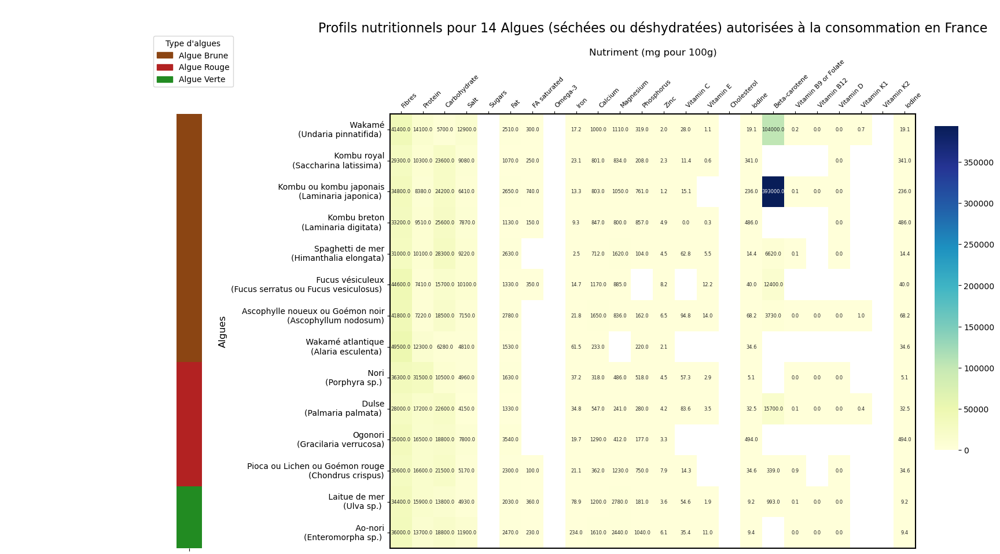

In [458]:
# Define color map for seaweed types
type_colors = {
    'algue brune': '#8B4513',
    'algue rouge': '#B22222',
    'algue verte': '#228B22'
}

# Set index to 'seaweed name French' only, exclude non-numerical columns & 
# Remove "Agar" seaweeds, as they are not on the list of seaweeds authorized for consumption 
heatmap_data_nutrient_profile = (
    df_seaweed_graphs
    .set_index('seaweed name French')
    .select_dtypes(include='number')
)

df_normalized = heatmap_data_nutrient_profile.copy()



for col, unit in unit_map.items():
    if unit == 'g':
        df_normalized[col] *= 1000  # Convert to mg
    elif unit == 'µg':
        df_normalized[col] /= 1000  # Convert to mg
    # mg stays the same

# drop unwanted columns (they are represented by "Omega-3" column and there is no data in ciqual database for these nutrients anyway)
df_normalized = df_normalized.drop(columns=[
    'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
    'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)', 
    'Energy, Regulation EU No 1169/2011 (kcal/100g)',
])

# Remove units of measurements from columns accurate info (since columns have all been converted to mg)
df_normalized.columns = df_normalized.columns.str.replace(r'\s*\([^)]*\)', '', regex=True)


# Create row_colors using seaweed name index, and drop the name to avoid label
row_colors = (df_seaweed_graphs.set_index('seaweed name French')['seaweed_type'].map(type_colors))
row_colors.name = None  # Prevent seaborn from labeling the color bar

g = sns.clustermap(
    df_normalized,
    row_colors=row_colors,
    cmap='YlGnBu',
    annot=True,
    fmt='.1f',
    annot_kws={"size":6},
    figsize=(18, len(df_normalized) * 0.8),
    col_cluster=False,
    row_cluster=False,
    cbar_pos=(0.9, 0.3, 0.03*0.75, 0.5)  # x, y, width, height
)


# Access heatmap axis
ax = g.ax_heatmap

# Shift heatmap to the right to make room for y-axis labels
pos = ax.get_position()
ax.set_position([pos.x0 + 0.18, pos.y0, pos.width * 0.8, pos.height])

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)

# Move y-axis labels to the left
ax.yaxis.tick_left()
ax.yaxis.set_label_position('left')

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
ax.set_xlabel('Nutriment (mg pour 100g)', fontsize=12)
ax.set_ylabel('Algues', fontsize=12)
ax.set_title('Profils nutritionnels pour 14 Algues (séchées ou déshydratées) autorisées à la consommation en France', fontsize=16, pad=20)

# Add legend outside the figure
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
g.fig.legend(
    handles=legend_patches,
    title="Type d'algues",
    loc='center left',
    bbox_to_anchor=(0.15, 0.9),
    borderaxespad=0.
)

plt.show()


## Visual 2: Heatmap of Nutrient values for seaweeds - Nutrients grouped by unit of measurement

### Create dictionary to group nutrients according to unit measurement (g, mg or µg)

In [459]:
# Updated grouped columns by unit
grouped_columns = {
    'Macronutriments (g)': [
        'Fibres (g/100g)', 'Protein (g/100g)', 'Carbohydrate (g/100g)',
        'Salt (g/100g)', 'Sugars (g/100g)', 
        'Fat (g/100g)', 'FA saturated (g/100g)', 
        'Omega-3 (EPA + DHA) (g/100g)', 
    ],
    'Micronutriments (mg)': [
        'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
        'Phosphorus (mg/100g)', 'Zinc (mg/100g)', 'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)'
    ],
    'Micronutriments (µg)': [
        'Iodine (µg/100g)', 'Beta-carotene (µg/100g)', 
        'Vitamin B9 or Folate (µg/100g)', 'Vitamin B12 (µg/100g)', 
        'Vitamin D (µg/100g)', 'Vitamin K1 (µg/100g)', 'Vitamin K2 (µg/100g)', 
        ]  
}

# Updated grouped columns by unit
grouped_columns_naked = {
    'Macronutriments (g)': [
        'Fibres', 'Protein', 'Carbohydrate',
        'Salt', 'Sugars', 
        'Fat', 'FA saturated', 
        'Omega-3 (EPA + DHA)', 
    ],
    'Micronutriments (mg)': [
        'Iron', 'Calcium', 'Magnesium',
        'Phosphorus', 'Zinc', 'Vitamin C', 'Vitamin E'
    ],
    'Micronutriments (µg)': [
        'Iodine', 'Beta-carotene', 
        'Vitamin B9 or Folate', 'Vitamin B12', 
        'Vitamin D', 'Vitamin K1', 'Vitamin K2', 
        ]  
}

### Normalize nutrient values for visual comparison of seaweeds

In [460]:
# # Define groups
# grouped_columns = {
#     'Energy & Macronutrients': [
#         'Energy, Regulation EU No 1169/2011 (kcal/100g)',
#         'Fat (g/100g)', 'FA saturated (g/100g)', 'Carbohydrate (g/100g)',
#         'Sugars (g/100g)', 'Fibres (g/100g)', 'Protein (g/100g)', 'Salt (g/100g)',
#         'Cholesterol (mg/100g)'
#     ],
    
#     'Fatty Acids': [
#          'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
#          'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)',
#          'Omega-3 (EPA + DHA) (g/100g)'
#          ],

#     'Minerals': [
#         'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
#         'Zinc (mg/100g)', 'Iodine (µg/100g)'
#     ],
#     'Vitamins': [
#         'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)',
#         'Vitamin B12 (µg/100g)', 'Vitamin B9 or Folate (µg/100g)',
#         'Vitamin D (µg/100g)'
#     ]
# }

# # Normalize each group
# def normalize_group(df, columns):
#     return df[columns].apply(lambda x: (x - x.min()) / (x.max() - x.min()), axis=0)


### Visual 2

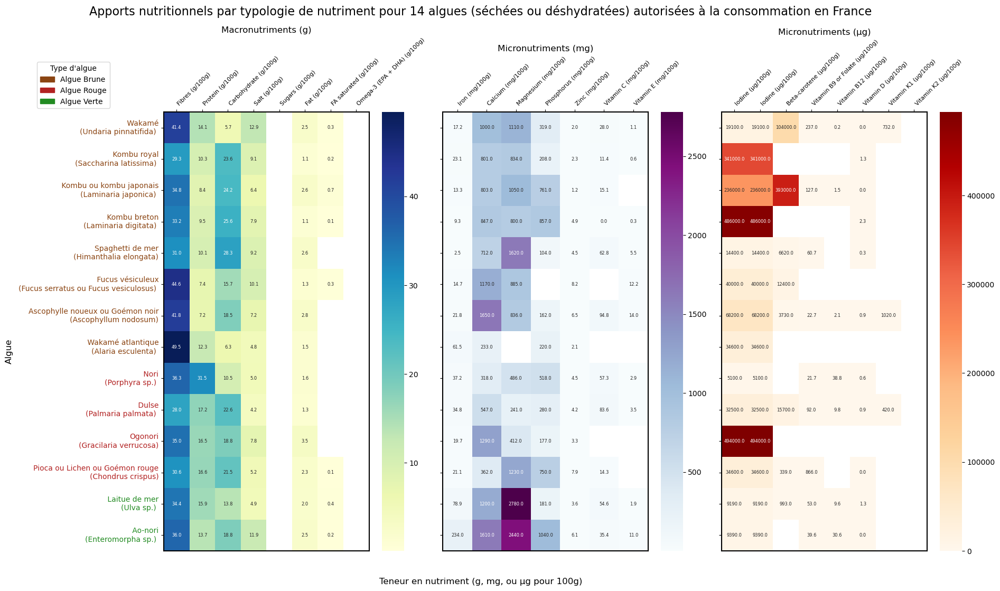

In [461]:
# Define seaweed type colors
type_colors = {
    'algue brune': '#8B4513',
    'algue rouge': '#B22222',
    'algue verte': '#228B22'
}

# Prepare data
heatmap_data = (
    df_seaweed_graphs
    .set_index('seaweed name French')
    .select_dtypes(include='number')
    .drop(columns=[
        'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
        'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)'
    ])
)

# Create row_colors
row_colors = df_seaweed_graphs.set_index('seaweed name French')['seaweed_type'].map(type_colors)
row_colors.name = None

# Create subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=len(grouped_columns),
    figsize=(20, len(heatmap_data) * 0.9),
    sharey=True
)

# Updated colormaps
colormaps = ['YlGnBu', 'BuPu', 'OrRd']

# Plot each group
for ax, (group_name, cols), cmap in zip(axes, grouped_columns.items(), colormaps):
    data = heatmap_data[cols]

    sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        annot=True,
        fmt='.1f',
        annot_kws={"size": 6},
        yticklabels=True,
        cbar=True
    )

    # Apply row_colors to y-axis tick labels
    for tick_label, color in zip(ax.get_yticklabels(), row_colors):
        tick_label.set_color(color)

    # Axis formatting
    ax.set_ylabel("")
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position('left')

    # Title and border
    ax.set_title(group_name, fontsize=12)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

# Add seaweed type legend
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
fig.legend(
    handles=legend_patches,
    title="Type d'algue",
    loc='center left',
    bbox_to_anchor=(0.08, 0.9),
    borderaxespad=0.
)

# Layout and labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.2, left=0.2)  # Add space for bottom text
fig.suptitle('Apports nutritionnels par typologie de nutriment pour 14 algues (séchées ou déshydratées) autorisées à la consommation en France', fontsize=16, y=1.02)
fig.text(0.5, 0.15, 'Teneur en nutriment (g, mg, ou µg pour 100g)', ha='center', fontsize=12)
fig.text(0.05, 0.5, 'Algue', va='center', rotation='vertical', fontsize=12)

plt.show()


# OLD STUFF

## Visual : Heatmap Grouped by columns

# **New charts with FULL vitamin set

In [462]:
df_seaweed.loc[df_seaweed.isna().any(axis=1)]

,seaweed_type,alim_nom_eng,alim_nom_fr,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3098,algue rouge,"Seaweed, agar, raw","Agar (algue), cru","Seaweed, agar, raw","Agar (algue), cru",NaN,0.5,0.54,6.25,0.023,0.28,0.03,0.006,0.008,1.86,54.0,67.0,5.0,0.58,0.000,0.87,0.0,NaN,0.0,85.0,0.00,0.00,2.3,NaN,NaN,0.008,0.0
3099,algue rouge,"Seaweed, agar, dried","Agar (algue), séché","Seaweed, agar, dried","Agar (algue), séché",NaN,NaN,4.36,NaN,0.130,2.97,0.30,0.061,0.087,15.20,658.0,770.0,33.0,3.40,0.000,5.00,0.0,36000.0,0.0,580.0,0.00,0.00,24.4,NaN,36000.0,0.087,0.0
3100,microalgae,"Spirulina, (spirulina sp.), dried","Spiruline (Spirulina sp.), séchée ou déshydratée","Spirulina, (spirulina sp.), dried",Spiruline (Spirulina sp.),NaN,3.6,57.50,20.30,2.620,3.10,7.72,2.650,0.000,28.50,120.0,195.0,118.0,2.00,10.100,5.00,0.0,NaN,342.0,94.0,0.00,0.00,25.5,NaN,NaN,0.000,0.0
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",Wakame (Undaria pinnatifida),Wakamé (Undaria pinnatifida),184.0,41.4,14.10,5.70,12.900,NaN,2.51,0.300,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN
3102,algue verte,"Sea lettuce (ulva sp.), dried or dehydrated)","Laitue de mer (Ulva sp.), séchée ou déshydratée",Sea lettuce (ulva sp.)),Laitue de mer (Ulva sp.),206.0,34.4,15.90,13.80,4.930,NaN,2.03,0.360,NaN,78.90,1200.0,2780.0,181.0,3.65,54.600,1.95,NaN,9190.0,993.0,53.0,9.55,1.31,NaN,NaN,9190.0,NaN,NaN
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",Sea belt (Saccharina latissima),Kombu royal (Saccharina latissima),204.0,29.3,10.30,23.60,9.080,NaN,1.07,0.250,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN
3104,algue rouge,"Laver (Porphyra sp.), dried or dehydrated","Nori (Porphyra sp.), séchée ou déshydratée",Laver (Porphyra sp.),Nori (Porphyra sp.),255.0,36.3,31.50,10.50,4.960,NaN,1.63,NaN,NaN,37.20,318.0,486.0,518.0,4.52,57.300,2.87,NaN,5100.0,NaN,21.7,38.80,0.56,NaN,NaN,5100.0,NaN,NaN
3105,algue rouge,"Dulse (Palmaria palmata), dried or dehydrated","Dulse (Palmaria palmata), séchée ou déshydratée",Dulse (Palmaria palmata),Dulse (Palmaria palmata),227.0,28.0,17.20,22.60,4.150,NaN,1.33,NaN,NaN,34.80,547.0,241.0,280.0,4.17,83.600,3.45,NaN,32500.0,15700.0,92.0,9.81,0.93,420.0,NaN,32500.0,NaN,NaN
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais (Laminaria japonica),224.0,34.8,8.38,24.20,6.410,NaN,2.65,0.740,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",Tangle (Laminaria digitata),Kombu breton (Laminaria digitata),217.0,33.2,9.51,25.60,7.870,NaN,1.13,0.150,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN


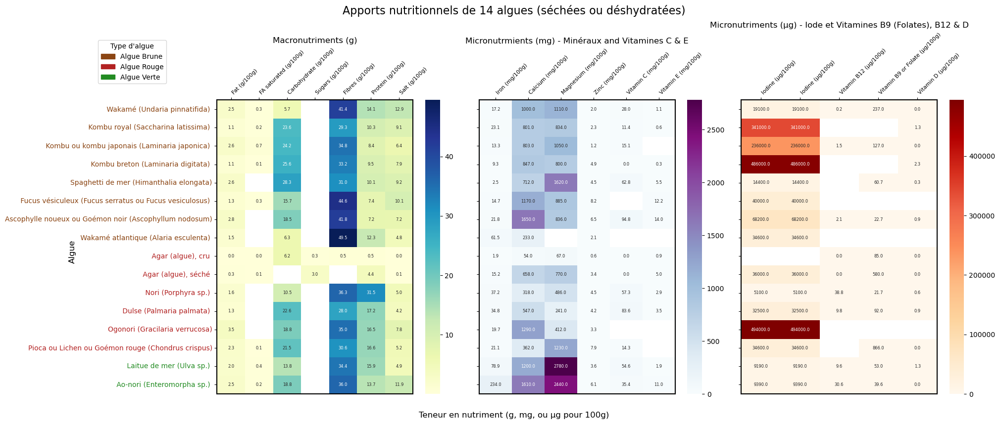

In [463]:
# Define seaweed type colors
type_colors = {
    'algue brune': '#8B4513',
    'algue rouge': '#B22222',
    'algue verte': '#228B22'
}

# Define grouped columns
grouped_columns = {
    'Macronutriments (g)': [
        'Fat (g/100g)', 'FA saturated (g/100g)', 'Carbohydrate (g/100g)',
        'Sugars (g/100g)', 'Fibres (g/100g)', 'Protein (g/100g)', 'Salt (g/100g)',
    ],
    'Micronutrmients (mg) - Minéraux and Vitamines C & E': [
        'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
        'Zinc (mg/100g)', 'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)'
    ],
    'Micronutriments (µg) - Iode et Vitamines B9 (Folates), B12 & D': [
        'Iodine (µg/100g)', 'Vitamin B12 (µg/100g)',
        'Vitamin B9 or Folate (µg/100g)', 'Vitamin D (µg/100g)'
    ]
}

# Prepare data
heatmap_data = (
    df_seaweed_ordered
    .set_index('seaweed name French')
    .select_dtypes(include='number')
    .drop(columns=[
        'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
        'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)'
    ])
)

# Create row_colors
row_colors = df_seaweed_ordered.set_index('seaweed name French')['seaweed_type'].map(type_colors)
row_colors.name = None

# Create subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=len(grouped_columns),
    figsize=(20, len(heatmap_data) * 0.6),
    sharey=True
)

# Updated colormaps
colormaps = ['YlGnBu', 'BuPu', 'OrRd']

# Plot each group
for ax, (group_name, cols), cmap in zip(axes, grouped_columns.items(), colormaps):
    data = heatmap_data[cols]

    sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        annot=True,
        fmt='.1f',
        annot_kws={"size": 6},
        yticklabels=True,
        cbar=True
    )

    # Apply row_colors to y-axis tick labels
    for tick_label, color in zip(ax.get_yticklabels(), row_colors):
        tick_label.set_color(color)

    # Axis formatting
    ax.set_ylabel("")
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position('left')

    # Title and border
    ax.set_title(group_name, fontsize=12)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

# Add seaweed type legend
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
fig.legend(
    handles=legend_patches,
    title="Type d'algue",
    loc='center left',
    bbox_to_anchor=(0.08, 0.9),
    borderaxespad=0.
)

# Layout and labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.2, left=0.2)  # Add space for bottom text
fig.suptitle('Apports nutritionnels de 14 algues (séchées ou déshydratées)', fontsize=16, y=1.02)
fig.text(0.5, 0.15, 'Teneur en nutriment (g, mg, ou µg pour 100g)', ha='center', fontsize=12)
fig.text(0.05, 0.5, 'Algue', va='center', rotation='vertical', fontsize=12)

plt.show()


### New grouped columns

In [464]:
grouped_columns = {
    'Macronutrients': [
        'Fat (g/100g)',
        'FA saturated (g/100g)',
        'Carbohydrate (g/100g)',
        'Sugars (g/100g)',
        'Fibres (g/100g)',
        'Protein (g/100g)',
        'Salt (g/100g)',
        'Cholesterol (mg/100g)'
    ],
    
    'Fatty Acids': [
        'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
        'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)',
        'Omega-3 (EPA + DHA) (g/100g)'
    ],
    
    'Minerals': [
        'Iron (mg/100g)',
        'Calcium (mg/100g)',
        'Magnesium (mg/100g)',
        'Phosphorus (mg/100g)',
        'Zinc (mg/100g)'
    ],
    
    'Vitamins (mg)': [
        'Vitamin C (mg/100g)',
        'Vitamin E (mg/100g)'
    ],
    
    'Microgram Nutrients (µg)': [
        'Vitamin B12 (µg/100g)',
        'Vitamin B9 or Folate (µg/100g)',
        'Vitamin D (µg/100g)',
        'Beta-carotene (µg/100g)',
        'Vitamin K1 (µg/100g)',
        'Vitamin K2 (µg/100g)',
        'Iodine (µg/100g)'
    ]
}


In [465]:
df_seaweed_ordered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16 entries, 3101 to 3111
Data columns (total 32 columns):
 #   Column                                            Non-Null Count  Dtype   
---  ------                                            --------------  -----   
 0   seaweed_type                                      16 non-null     category
 1   alim_nom_eng                                      16 non-null     object  
 2   alim_nom_fr                                       16 non-null     object  
 3   seaweed name Eng                                  16 non-null     object  
 4   seaweed name French                               16 non-null     object  
 5   Energy, Regulation EU No 1169/2011 (kcal/100g)    14 non-null     float64 
 6   Fibres (g/100g)                                   15 non-null     float64 
 7   Protein (g/100g)                                  16 non-null     float64 
 8   Carbohydrate (g/100g)                             15 non-null     float64 
 9   Salt (g/100g

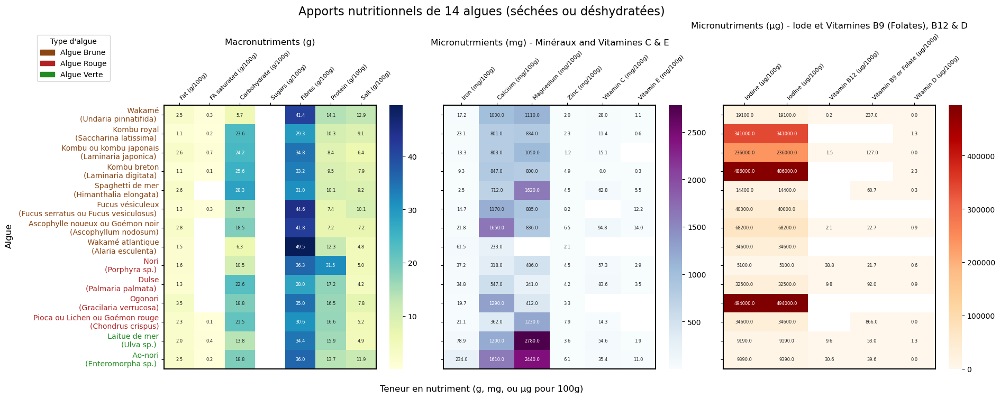

In [466]:
df_seaweed_ordered.loc[3108, 'seaweed name French'] = 'Spaghetti de mer (Himanthalia elongata)'
df_seaweed_ordered.loc[3109, 'seaweed name French'] = 'Ogonori (Gracilaria verrucosa)'
df_seaweed_ordered.loc[3112, 'seaweed name French'] = 'Pioca ou Lichen ou Goémon rouge (Chondrus crispus)'
df_seaweed_ordered.loc[3113, 'seaweed name French'] = 'Ascophylle noueux ou Goémon noir (Ascophyllum nodosum)'

# Drop rows for agar seaweed, which is currently not authorized for consumption in France
# with indices 3098 and 3099
# index = 3098 for 	alim_nom_eng = Seaweed, agar, raw	AND    alim_nom_fr = Agar (algue), cru
# index = 3099 for 	alim_nom_eng = Seaweed, agar, dried	 AND  alim_nom_fr = Agar (algue), séché
	


df_seaweed_ordered = df_seaweed_ordered.drop(index=[3098, 3099])

# Use Regex to split the name of seaweeds onto 2 lines
df_seaweed_ordered['seaweed name French'] = df_seaweed_ordered['seaweed name French'].str.replace(
    r"\s*(\()", r"\n\1", regex=True
)

# Define seaweed type colors
type_colors = {
    'algue brune': '#8B4513',
    'algue rouge': '#B22222',
    'algue verte': '#228B22'
}

# Define grouped columns
grouped_columns = {
    'Macronutriments (g)': [
        'Fat (g/100g)', 'FA saturated (g/100g)', 'Carbohydrate (g/100g)',
        'Sugars (g/100g)', 'Fibres (g/100g)', 'Protein (g/100g)', 'Salt (g/100g)',
    ],
    'Micronutrmients (mg) - Minéraux and Vitamines C & E': [
        'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
        'Zinc (mg/100g)', 'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)'
    ],
    'Micronutriments (µg) - Iode et Vitamines B9 (Folates), B12 & D': [
        'Iodine (µg/100g)', 'Vitamin B12 (µg/100g)',
        'Vitamin B9 or Folate (µg/100g)', 'Vitamin D (µg/100g)'
    ]
}

# Prepare data
heatmap_data = (
    df_seaweed_ordered
    .set_index('seaweed name French')
    .select_dtypes(include='number')
    .drop(columns=[
        'FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)',
        'FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)'
    ])
)

# Create row_colors
row_colors = df_seaweed_ordered.set_index('seaweed name French')['seaweed_type'].map(type_colors)
row_colors.name = None

# Create subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=len(grouped_columns),
    figsize=(20, len(heatmap_data) * 0.6),
    sharey=True
)

# Updated colormaps
colormaps = ['YlGnBu', 'BuPu', 'OrRd']

# Plot each group
for ax, (group_name, cols), cmap in zip(axes, grouped_columns.items(), colormaps):
    data = heatmap_data[cols]

    sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        annot=True,
        fmt='.1f',
        annot_kws={"size": 6},
        yticklabels=True,
        cbar=True
    )

    # Apply row_colors to y-axis tick labels
    for tick_label, color in zip(ax.get_yticklabels(), row_colors):
        tick_label.set_color(color)

    # Axis formatting
    ax.set_ylabel("")
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position('left')

    # Title and border
    ax.set_title(group_name, fontsize=12)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

# Add seaweed type legend
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
fig.legend(
    handles=legend_patches,
    title="Type d'algue",
    loc='center left',
    bbox_to_anchor=(0.08, 0.9),
    borderaxespad=0.
)

# Layout and labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.2, left=0.2)  # Add space for bottom text
fig.suptitle('Apports nutritionnels de 14 algues (séchées ou déshydratées)', fontsize=16, y=1.02)
fig.text(0.5, 0.15, 'Teneur en nutriment (g, mg, ou µg pour 100g)', ha='center', fontsize=12)
fig.text(0.05, 0.5, 'Algue', va='center', rotation='vertical', fontsize=12)

plt.show()


# *** FINAL 3 heatmaps for nutrients across the board - seaweed CIQUAL Data

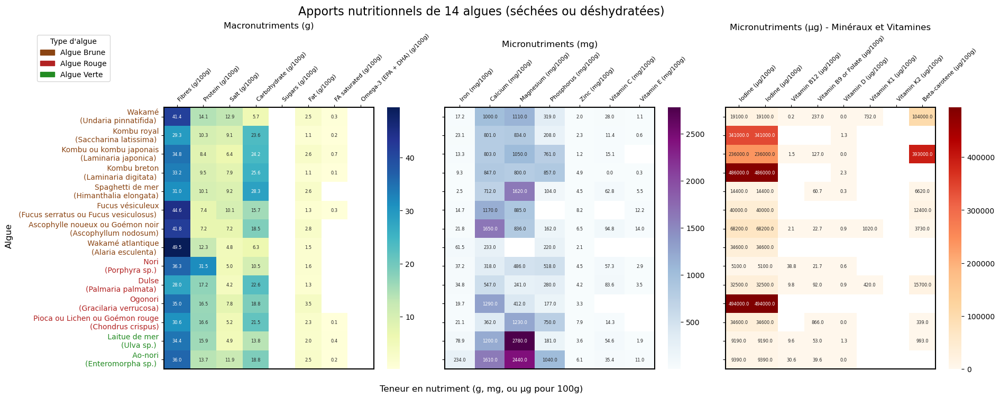

In [467]:
# Update seaweed names
df_seaweed_ordered.loc[3108, 'seaweed name French'] = 'Spaghetti de mer\n(Himanthalia elongata)'
df_seaweed_ordered.loc[3109, 'seaweed name French'] = 'Ogonori\n(Gracilaria verrucosa)'
df_seaweed_ordered.loc[3112, 'seaweed name French'] = 'Pioca ou Lichen ou Goémon rouge\n(Chondrus crispus)'
df_seaweed_ordered.loc[3113, 'seaweed name French'] = 'Ascophylle noueux ou Goémon noir\n(Ascophyllum nodosum)'

# Drop rows for agar seaweed (not authorized in France)
#df_seaweed_ordered = df_seaweed_ordered.drop(index=[3098, 3099])

# Split seaweed names onto two lines for readability
df_seaweed_ordered['seaweed name French'] = df_seaweed_ordered['seaweed name French'].str.replace(
    r"\s*(\()", r"\n\1", regex=True
)

# Define seaweed type colors
type_colors = {
    'algue brune': '#8B4513',
    'algue rouge': '#B22222',
    'algue verte': '#228B22'
}

# Updated grouped columns by unit
new_grouped_columns = {
    'Macronutriments (g)': [
        'Fibres (g/100g)', 'Protein (g/100g)', 'Salt (g/100g)',
        'Carbohydrate (g/100g)','Sugars (g/100g)', 
        'Fat (g/100g)', 'FA saturated (g/100g)', 'Omega-3 (EPA + DHA) (g/100g)', 
    ],
    'Micronutriments (mg)': [
        'Iron (mg/100g)', 'Calcium (mg/100g)', 'Magnesium (mg/100g)',
        'Phosphorus (mg/100g)', 'Zinc (mg/100g)', 'Vitamin C (mg/100g)', 'Vitamin E (mg/100g)'
    ],
    'Micronutriments (µg) - Minéraux et Vitamines': [
        'Iodine (µg/100g)', 'Vitamin B12 (µg/100g)', 
        'Vitamin B9 or Folate (µg/100g)', 'Vitamin D (µg/100g)', 
        'Vitamin K1 (µg/100g)', 'Vitamin K2 (µg/100g)', 
        'Beta-carotene (µg/100g)', 
        ]  
}

# Prepare data for heatmap
heatmap_data = (
    df_seaweed_ordered
    .set_index('seaweed name French')
    .select_dtypes(include='number')
)

# Create row colors
row_colors = df_seaweed_ordered.set_index('seaweed name French')['seaweed_type'].map(type_colors)
row_colors.name = None

# Create subplots
fig, axes = plt.subplots(
    nrows=1,
    ncols=len(new_grouped_columns),
    figsize=(20, len(heatmap_data) * 0.6),
    sharey=True
)

# Colormaps for each group
colormaps = ['YlGnBu', 'BuPu', 'OrRd', ]

# Plot each group
for ax, (group_name, cols), cmap in zip(axes, new_grouped_columns.items(), colormaps):
    data = heatmap_data[cols]

    sns.heatmap(
        data,
        ax=ax,
        cmap=cmap,
        annot=True,
        fmt='.1f',
        annot_kws={"size": 6},
        yticklabels=True,
        cbar=True
    )

    # Apply row_colors to y-axis tick labels
    for tick_label, color in zip(ax.get_yticklabels(), row_colors):
        tick_label.set_color(color)

    # Axis formatting
    ax.set_ylabel("")
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)
    ax.yaxis.tick_left()
    ax.yaxis.set_label_position('left')

    # Title and border
    ax.set_title(group_name, fontsize=12)
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

# Add seaweed type legend
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
fig.legend(
    handles=legend_patches,
    title="Type d'algue",
    loc='center left',
    bbox_to_anchor=(0.08, 0.9),
    borderaxespad=0.
)

# Layout and labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.2, left=0.2)
fig.suptitle('Apports nutritionnels de 14 algues (séchées ou déshydratées)', fontsize=16, y=1.02)
fig.text(0.5, 0.15, 'Teneur en nutriment (g, mg, ou µg pour 100g)', ha='center', fontsize=12)
fig.text(0.05, 0.5, 'Algue', va='center', rotation='vertical', fontsize=12)

plt.show()


In [468]:
df_seaweed_ordered.head()

,seaweed_type,alim_nom_eng,alim_nom_fr,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated","Wakamé (Undaria pinnatifida), séchée ou déshydratée",Wakame (Undaria pinnatifida),Wakamé\n(Undaria pinnatifida),184.0,41.4,14.10,5.7,12.90,NaN,2.51,0.30,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated","Kombu royal (Saccharina latissima), séchée ou déshydratée",Sea belt (Saccharina latissima),Kombu royal\n(Saccharina latissima),204.0,29.3,10.30,23.6,9.08,NaN,1.07,0.25,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated","Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais\n(Laminaria japonica),224.0,34.8,8.38,24.2,6.41,NaN,2.65,0.74,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated","Kombu breton (Laminaria digitata), séchée ou déshydratée",Tangle (Laminaria digitata),Kombu breton\n(Laminaria digitata),217.0,33.2,9.51,25.6,7.87,NaN,1.13,0.15,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN
3108,algue brune,"Sea thong (Himanthalia elongata), dried or dehydrated","Haricot de mer (Himanthalia elongata), séchée ou déshydratée",Sea thong (Himanthalia elongata),Spaghetti de mer\n(Himanthalia elongata),239.0,31.0,10.10,28.3,9.22,NaN,2.63,NaN,NaN,2.53,712.0,1620.0,104.0,4.55,62.800,5.50,NaN,14400.0,6620.0,60.7,NaN,0.28,NaN,NaN,14400.0,NaN,NaN


## Visual: Nutritional Values in Seaweed

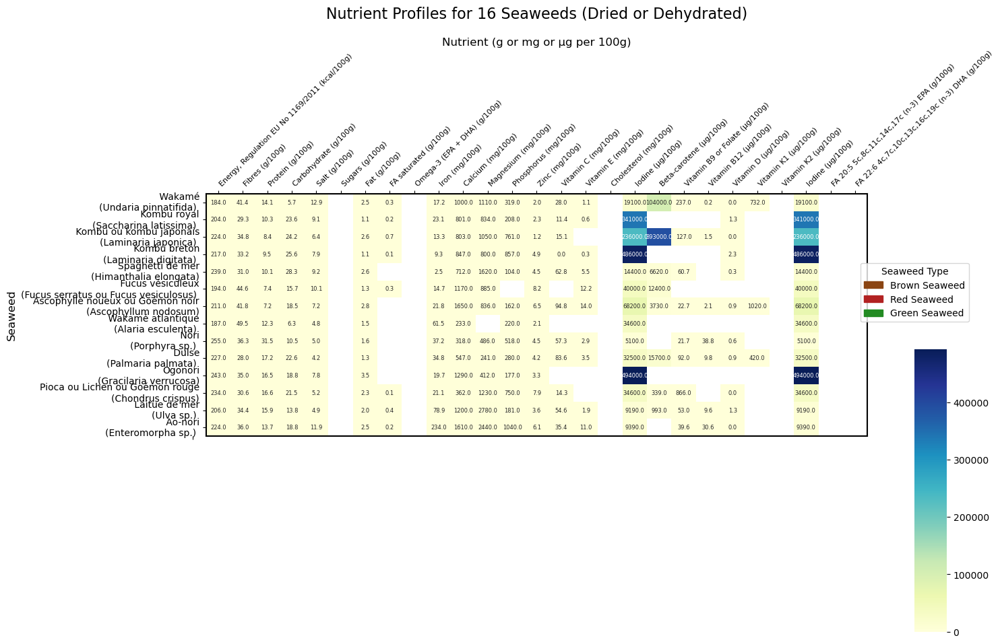

In [469]:

# Define color map for seaweed types
type_colors = {
    'brown seaweed': '#8B4513',
    'red seaweed': '#B22222',
    'green seaweed': '#228B22'
}

# Set index to seaweed name only, exlclude non-numerical columns
heatmap_data_nutrient_profile = (
    df_seaweed_ordered
    .set_index('seaweed name French')
    .select_dtypes(include='number')
)

# Create row_colors using seaweed name index, and drop the name to avoid label
row_colors = df_seaweed_ordered.set_index('seaweed name French')['seaweed_type'].map(type_colors)
row_colors.name = None  # Prevent seaborn from labeling the color bar

g = sns.clustermap(
    heatmap_data_nutrient_profile,
    row_colors=row_colors,
    cmap='YlGnBu',
    annot=True,
    fmt='.1f',
    annot_kws={"size":6},
    figsize=(16, len(heatmap_data_nutrient_profile) * 0.6),
    col_cluster=False,
    row_cluster=False,
    cbar_pos=(0.85, 0.1, 0.03, 0.5)  # x, y, width, height
)


# Access heatmap axis
ax = g.ax_heatmap

# Shift heatmap to the right to make room for y-axis labels
pos = ax.get_position()
# ax.set_position([pos.x0, pos.y0, pos.width, pos.height])

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=8)

# Move y-axis labels to the left
ax.yaxis.tick_left()
ax.yaxis.set_label_position('left')

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
ax.set_xlabel('Nutrient (g or mg or μg per 100g)', fontsize=12)
ax.set_ylabel('Seaweed', fontsize=12)
ax.set_title('Nutrient Profiles for 16 Seaweeds (Dried or Dehydrated)', fontsize=16, pad=20)

# Add legend outside the figure
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
g.fig.legend(
    handles=legend_patches,
    title='Seaweed Type',
    loc='center left',
    bbox_to_anchor=(0.8, 0.7),
    borderaxespad=0.
)

plt.show()


## Visual: Macronutrients content in seaweed

In [470]:
df_seaweed_ordered[['alim_nom_eng', 'Protein (g/100g)', 'Carbohydrate (g/100g)', 'Fat (g/100g)', 'FA saturated (g/100g)', 'Fibres (g/100g)']]

,alim_nom_eng,Protein (g/100g),Carbohydrate (g/100g),Fat (g/100g),FA saturated (g/100g),Fibres (g/100g)
3101,"Wakame (Undaria pinnatifida), dried or dehydrated",14.10,5.70,2.51,0.30,41.4
3103,"Sea belt (Saccharina latissima), dried or dehydrated",10.30,23.60,1.07,0.25,29.3
3106,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated",8.38,24.20,2.65,0.74,34.8
3107,"Tangle (Laminaria digitata), dried or dehydrated",9.51,25.60,1.13,0.15,33.2
3108,"Sea thong (Himanthalia elongata), dried or dehydrated",10.10,28.30,2.63,NaN,31.0
3110,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated",7.41,15.70,1.33,0.35,44.6
3113,"North Atlantic rockweed (Ascophyllum nodosum), dried or dehydrated",7.22,18.50,2.78,NaN,41.8
3114,"Atlantic wakame (Alaria esculenta), dried or dehydrated",12.30,6.28,1.53,NaN,49.5
3104,"Laver (Porphyra sp.), dried or dehydrated",31.50,10.50,1.63,NaN,36.3
3105,"Dulse (Palmaria palmata), dried or dehydrated",17.20,22.60,1.33,NaN,28.0


In [471]:
df_seaweed_ordered['seaweed name'] = df_seaweed_ordered['alim_nom_eng'].str.replace(", dried or dehydrated", "", regex=False)


In [472]:
df_seaweed_ordered['seaweed name'] = df_seaweed_ordered['seaweed name'].replace({
    'Seaweed, agar, raw': 'Agar - raw',
    'Seaweed, agar, dried': 'Agar - dried*'
})

df_seaweed_ordered['seaweed name'] = df_seaweed_ordered['seaweed name'].str.replace(r"\s*\(.*?\)", "", regex=True)

# Remove '(g/100g)' from column names
df_seaweed_graph = df_seaweed_ordered.rename(columns=lambda x: x.replace(' (g/100g)', ''))


In [473]:
df_seaweed_ordered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14 entries, 3101 to 3111
Data columns (total 33 columns):
 #   Column                                            Non-Null Count  Dtype   
---  ------                                            --------------  -----   
 0   seaweed_type                                      14 non-null     category
 1   alim_nom_eng                                      14 non-null     object  
 2   alim_nom_fr                                       14 non-null     object  
 3   seaweed name Eng                                  14 non-null     object  
 4   seaweed name French                               14 non-null     object  
 5   Energy, Regulation EU No 1169/2011 (kcal/100g)    14 non-null     float64 
 6   Fibres (g/100g)                                   14 non-null     float64 
 7   Protein (g/100g)                                  14 non-null     float64 
 8   Carbohydrate (g/100g)                             14 non-null     float64 
 9   Salt (g/100g

### Correct "Sea lettuce" entry

In [474]:
df_seaweed_graph.loc[3102, 'seaweed name'] = 'Sea lettuce (ulva sp.)'
df_seaweed_graph.loc[3111, 'seaweed name'] = 'Sea lettuce (Enteromorpha sp.)'


In [475]:
# Create a combined label with grouping
df_seaweed_graph['grouped_label'] = (
    df_seaweed_graph['seaweed_type'].astype(str)
    + ' | ' +
    df_seaweed_graph['seaweed name'].astype(str)
)

# Set index to the new label
heatmap_data_macronutrients = df_seaweed_graph.set_index('grouped_label')[['Protein', 'Carbohydrate', 'Fat', 'Fibres']]


/var/folders/kl/2y01c7y51cj42bdww37cvc5c0000gn/T/ipykernel_76244/3428458996.py:67: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



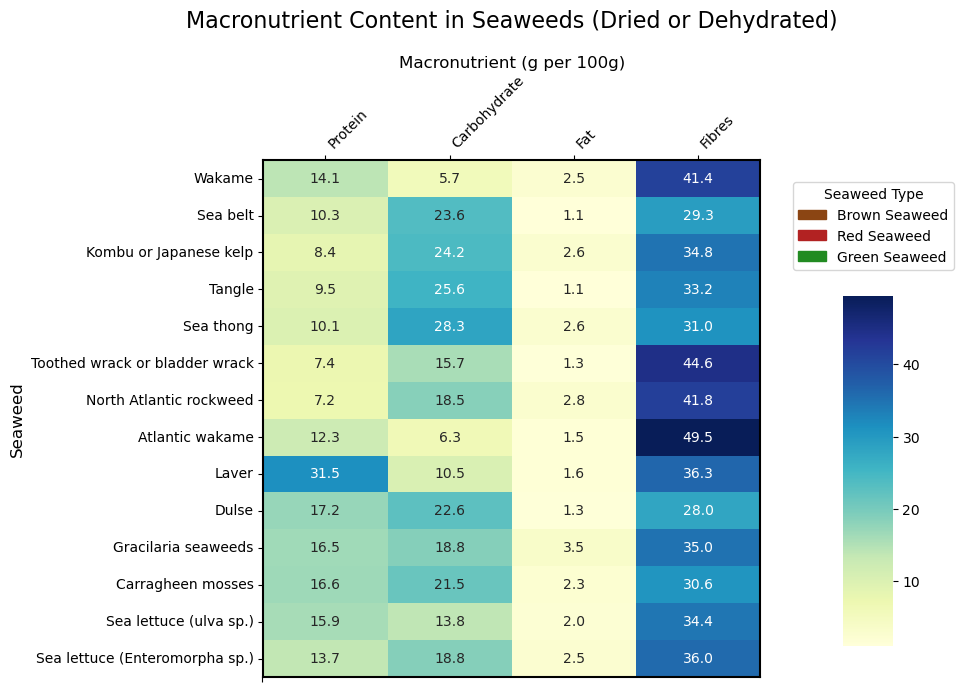

In [476]:
# this code works!!!!!!
# Define color map for seaweed types
type_colors = {
    'brown seaweed': '#8B4513',
    'red seaweed': '#B22222',
    'green seaweed': '#228B22'
}

# Set index to seaweed name only
heatmap_data_macronutrients = df_seaweed_graph.set_index('seaweed name')[['Protein', 'Carbohydrate', 'Fat', 'Fibres']]

# Create row_colors using seaweed name index, and drop the name to avoid label
row_colors = df_seaweed_graph.set_index('seaweed name')['seaweed_type'].map(type_colors)
row_colors.name = None  # Prevent seaborn from labeling the color bar

# Create clustermap with extra width for legend
g = sns.clustermap(
    heatmap_data_macronutrients,
    row_colors=row_colors,
    cmap='YlGnBu',
    annot=True,
    fmt='.1f',
    figsize=(10, len(heatmap_data_macronutrients) * 0.5),  # Wider figure
    col_cluster=False,
    row_cluster=False,
    cbar_pos=(0.75, 0.1, 0.05, 0.5)  # Bottom right corner

)

# Access heatmap axis
ax = g.ax_heatmap

# Shift heatmap to the right to make room for y-axis labels
pos = ax.get_position()
ax.set_position([pos.x0 - 0.01, pos.y0, pos.width * 0.9, pos.height])

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Move y-axis labels to the left
ax.yaxis.tick_left()
ax.yaxis.set_label_position('left')

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
ax.set_xlabel('Macronutrient (g per 100g)', fontsize=12)
ax.set_ylabel('Seaweed', fontsize=12)
ax.set_title('Macronutrient Content in Seaweeds (Dried or Dehydrated)', fontsize=16, pad=20)

# Add legend outside the figure
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
g.fig.legend(
    handles=legend_patches,
    title='Seaweed Type',
    loc='center left',
    bbox_to_anchor=(0.7, 0.7),
    borderaxespad=0.
)

plt.tight_layout(rect=[0, 0, 0.6, 1])  # Leave space on the right for legend
plt.show()


### Final Version of Visual - Macronutrient Content (g per 100g) in Seaweeds (Dried or Dehydrated)

### Import df_alim, in order to display seaweed names in French

In [477]:
import pandas as pd

from lxml import etree


def load_xml_to_df(file_path, record_tag):
    parser = etree.XMLParser(recover=True, encoding='windows-1252')    
    tree = etree.parse(file_path, parser)
    root = tree.getroot()

    rows = []
    for element in tree.findall(record_tag):
        row = {child.tag: child.text for child in element}
        rows.append(row)
    return pd.DataFrame(rows)

PATH_ALIM = os.getenv("PATH_ALIM")
PATH_COMPO = os.getenv("PATH_COMPO")
PATH_CONST = os.getenv("PATH_CONST")
PATH_ALIM_GRP = os.getenv("PATH_ALIM_GRP")

df_alim = load_xml_to_df(PATH_ALIM, 'ALIM')

df_ciqual_seaweed_eng_fr = pd.merge(
    df_alim,
    df_seaweed_ordered,
    on='alim_nom_fr',
    how='inner'
)

df_ciqual_seaweed_eng_fr

,alim_code,alim_nom_fr,ALIM_NOM_INDEX_FR,alim_nom_eng_x,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,seaweed_type,alim_nom_eng_y,seaweed name Eng,seaweed name French,"Energy, Regulation EU No 1169/2011 (kcal/100g)",Fibres (g/100g),Protein (g/100g),Carbohydrate (g/100g),Salt (g/100g),Sugars (g/100g),Fat (g/100g),FA saturated (g/100g),Omega-3 (EPA + DHA) (g/100g),Iron (mg/100g),Calcium (mg/100g),Magnesium (mg/100g),Phosphorus (mg/100g),Zinc (mg/100g),Vitamin C (mg/100g),Vitamin E (mg/100g),Cholesterol (mg/100g),Iodine (µg/100g),Beta-carotene (µg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),Vitamin D (µg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Iodine (µg/100g),"FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",seaweed name
0,20984,"Wakamé (Undaria pinnatifida), séchée ou déshydratée",Algue Wakamé,"Wakame (Undaria pinnatifida), dried or dehydrated",10,1007,000000,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated",Wakame (Undaria pinnatifida),Wakamé\n(Undaria pinnatifida),184.0,41.4,14.10,5.70,12.90,NaN,2.51,0.30,NaN,17.20,1000.0,1110.0,319.0,2.03,28.000,1.13,NaN,19100.0,104000.0,237.0,0.23,0.00,732.0,NaN,19100.0,NaN,NaN,Wakame
1,20985,"Laitue de mer (Ulva sp.), séchée ou déshydratée",Algue Laitue de mer,"Sea lettuce (ulva sp.), dried or dehydrated)",10,1007,000000,algue verte,"Sea lettuce (ulva sp.), dried or dehydrated)",Sea lettuce (ulva sp.)),Laitue de mer\n(Ulva sp.),206.0,34.4,15.90,13.80,4.93,NaN,2.03,0.36,NaN,78.90,1200.0,2780.0,181.0,3.65,54.600,1.95,NaN,9190.0,993.0,53.0,9.55,1.31,NaN,NaN,9190.0,NaN,NaN,Sea lettuce)
2,20986,"Kombu royal (Saccharina latissima), séchée ou déshydratée",Algue Kombu,"Sea belt (Saccharina latissima), dried or dehydrated",10,1007,000000,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated",Sea belt (Saccharina latissima),Kombu royal\n(Saccharina latissima),204.0,29.3,10.30,23.60,9.08,NaN,1.07,0.25,NaN,23.10,801.0,834.0,208.0,2.30,11.400,0.57,NaN,341000.0,NaN,NaN,NaN,1.28,NaN,NaN,341000.0,NaN,NaN,Sea belt
3,20987,"Nori (Porphyra sp.), séchée ou déshydratée",Algue Nori,"Laver (Porphyra sp.), dried or dehydrated",10,1007,000000,algue rouge,"Laver (Porphyra sp.), dried or dehydrated",Laver (Porphyra sp.),Nori\n(Porphyra sp.),255.0,36.3,31.50,10.50,4.96,NaN,1.63,NaN,NaN,37.20,318.0,486.0,518.0,4.52,57.300,2.87,NaN,5100.0,NaN,21.7,38.80,0.56,NaN,NaN,5100.0,NaN,NaN,Laver
4,20988,"Dulse (Palmaria palmata), séchée ou déshydratée","Algue Dulse (Palmaria palmata), séchée ou déshydratée","Dulse (Palmaria palmata), dried or dehydrated",10,1007,000000,algue rouge,"Dulse (Palmaria palmata), dried or dehydrated",Dulse (Palmaria palmata),Dulse\n(Palmaria palmata),227.0,28.0,17.20,22.60,4.15,NaN,1.33,NaN,NaN,34.80,547.0,241.0,280.0,4.17,83.600,3.45,NaN,32500.0,15700.0,92.0,9.81,0.93,420.0,NaN,32500.0,NaN,NaN,Dulse
5,20990,"Kombu ou kombu japonais (Laminaria japonica), séchée ou déshydratée",Algue Kombu,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated",10,1007,000000,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated",Kombu or Japanese kelp (Laminaria japonica),Kombu ou kombu japonais\n(Laminaria japonica),224.0,34.8,8.38,24.20,6.41,NaN,2.65,0.74,NaN,13.30,803.0,1050.0,761.0,1.22,15.100,NaN,NaN,236000.0,393000.0,127.0,1.52,0.00,NaN,NaN,236000.0,NaN,NaN,Kombu or Japanese kelp
6,20991,"Kombu breton (Laminaria digitata), séchée ou déshydratée",Algue Kombu,"Tangle (Laminaria digitata), dried or dehydrated",10,1007,000000,algue brune,"Tangle (Laminaria digitata), dried or dehydrated",Tangle (Laminaria digitata),Kombu breton\n(Laminaria digitata),217.0,33.2,9.51,25.60,7.87,NaN,1.13,0.15,NaN,9.29,847.0,800.0,857.0,4.89,0.024,0.32,NaN,486000.0,NaN,NaN,NaN,2.27,NaN,NaN,486000.0,NaN,NaN,Tangle
7,20992,"Haricot de mer (Himanthalia elongata), séchée ou déshydratée",Algue Haricot de mer,"Sea thong (Himanthalia elongata), dried or dehydrated",10,1007,000000,algue brune,"Sea thong (Himanth

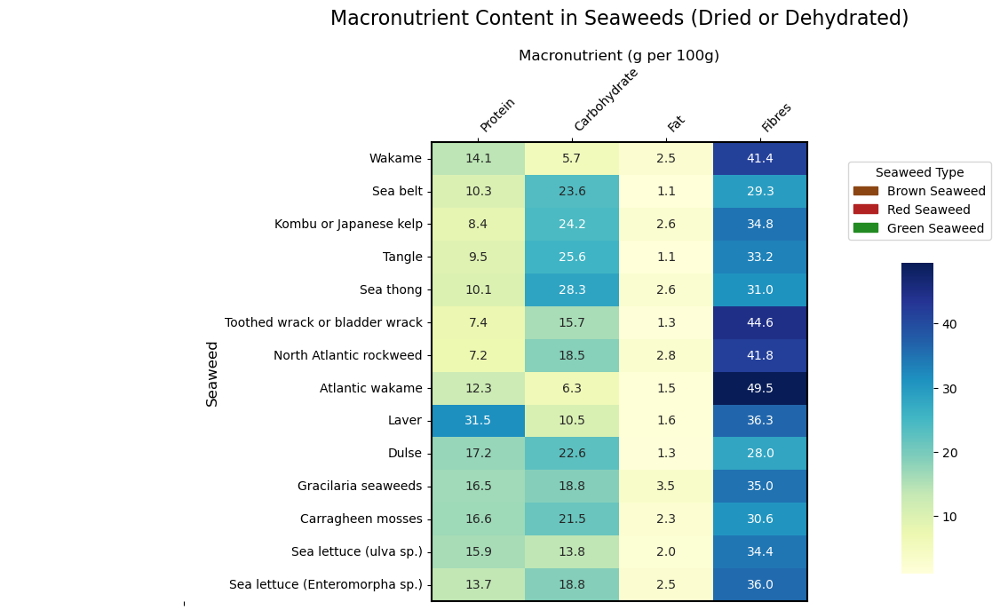

In [478]:

### Final Version of Visual - Macronutrient Content (g per 100g) in Seaweeds (Dried or Dehydrated)
# Define color map for seaweed types
type_colors = {
    'brown seaweed': '#8B4513',
    'red seaweed': '#B22222',
    'green seaweed': '#228B22'
}

# Set index to seaweed name only
heatmap_data_macronutrients = df_seaweed_graph.set_index('seaweed name')[['Protein', 'Carbohydrate', 'Fat', 'Fibres']]

# Create row_colors using seaweed name index, and drop the name to avoid label
row_colors = df_seaweed_graph.set_index('seaweed name')['seaweed_type'].map(type_colors)
row_colors.name = None  # Prevent seaborn from labeling the color bar

g = sns.clustermap(
    heatmap_data_macronutrients,
    row_colors=row_colors,
    cmap='YlGnBu',
    annot=True,
    fmt='.1f',
    figsize=(12, len(heatmap_data_macronutrients) * 0.5),
    col_cluster=False,
    row_cluster=False,
    cbar_pos=(0.85, 0.1, 0.03, 0.5)  # x, y, width, height
)


# Access heatmap axis
ax = g.ax_heatmap

# Shift heatmap to the right to make room for y-axis labels
pos = ax.get_position()
ax.set_position([pos.x0 + 0.22, pos.y0, pos.width * 0.6, pos.height])

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Move y-axis labels to the left
ax.yaxis.tick_left()
ax.yaxis.set_label_position('left')

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
ax.set_xlabel('Macronutrient (g per 100g)', fontsize=12)
ax.set_ylabel('Seaweed', fontsize=12)
ax.set_title('Macronutrient Content in Seaweeds (Dried or Dehydrated)', fontsize=16, pad=20)

# Add legend outside the figure
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
g.fig.legend(
    handles=legend_patches,
    title='Seaweed Type',
    loc='center left',
    bbox_to_anchor=(0.8, 0.7),
    borderaxespad=0.
)

plt.show()


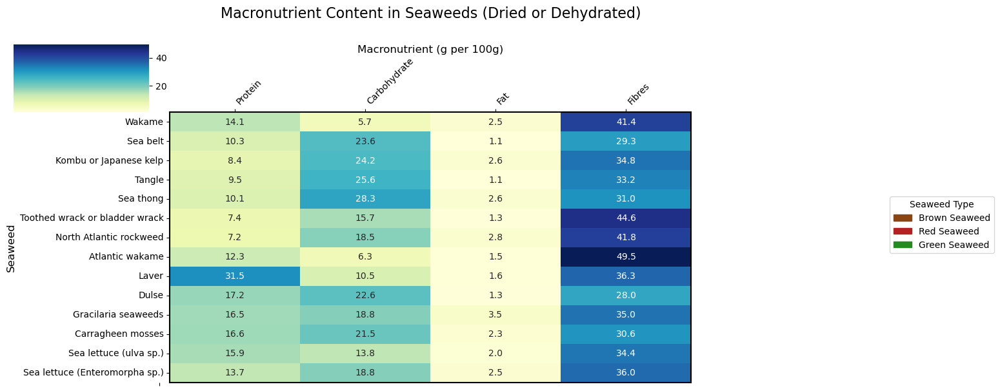

In [479]:
# Define color map for seaweed types
type_colors = {
    'brown seaweed': '#8B4513',
    'red seaweed': '#B22222',
    'green seaweed': '#228B22'
}

# Set index to seaweed name only
heatmap_data_macronutrients = df_seaweed_graph.set_index('seaweed name')[['Protein', 'Carbohydrate', 'Fat', 'Fibres']]

# Create row_colors using seaweed name index
row_colors = df_seaweed_graph.set_index('seaweed name')['seaweed_type'].map(type_colors)
row_colors.name = None  # Prevent seaborn from labeling the color bar

# Create clustermap with adjusted figure size and colorbar position
g = sns.clustermap(
    heatmap_data_macronutrients,
    row_colors=row_colors,
    cmap='YlGnBu',
    annot=True,
    fmt='.1f',
    figsize=(14, len(heatmap_data_macronutrients) * 0.5),
    col_cluster=False,
    row_cluster=False,
    cbar_pos=(0.85, 0.05, 0.1, 0.02)  # Bottom right corner
)

# Access heatmap axis
ax = g.ax_heatmap

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Move y-axis labels to the left
ax.yaxis.tick_left()
ax.yaxis.set_label_position('left')

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
ax.set_xlabel('Macronutrient (g per 100g)', fontsize=12)
ax.set_ylabel('Seaweed', fontsize=12)
ax.set_title('Macronutrient Content in Seaweeds (Dried or Dehydrated)', fontsize=16, pad=30)

# Add legend for seaweed type colors
legend_patches = [mpatches.Patch(color=color, label=label.title()) for label, color in type_colors.items()]
g.fig.legend(
    handles=legend_patches,
    title='Seaweed Type',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    borderaxespad=0.
)

# Adjust layout to prevent overlap
g.fig.subplots_adjust(left=0.05, right=0.8, top=0.9, bottom=0.15)
plt.show()


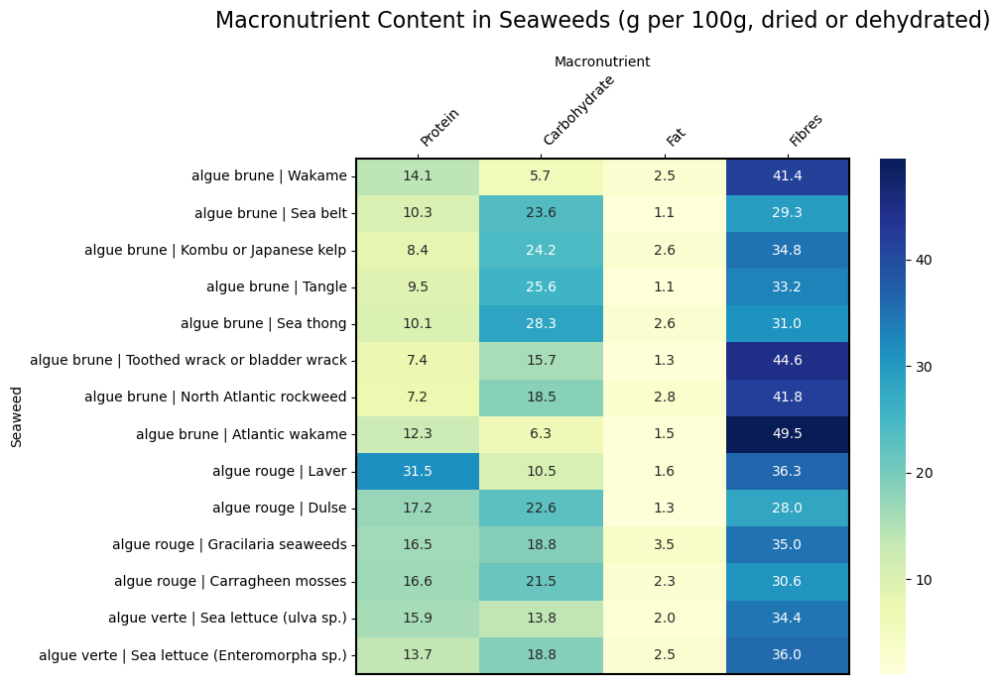

In [480]:
# Create a combined label with grouping
df_seaweed_graph['grouped_label'] = (
    df_seaweed_graph['seaweed_type'].astype(str)
    + ' | ' +
    df_seaweed_graph['seaweed name'].astype(str)
)

# Set index to the new label
heatmap_data_macronutrients = df_seaweed_graph.set_index('grouped_label')[['Protein', 'Carbohydrate', 'Fat', 'Fibres']]


# Plot heatmap
plt.figure(figsize=(10, len(heatmap_data_macronutrients) * 0.5))
ax = sns.heatmap(heatmap_data_macronutrients, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')


# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)


# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Macronutrient Content in Seaweeds (g per 100g, dried or dehydrated)', fontsize=16, pad=20)
ax.set_xlabel('Macronutrient')
ax.set_ylabel('Seaweed')

plt.tight_layout()
plt.show()


In [481]:
#df_seaweed_ordered['seawed name'] = df_seaweed_ordered['alim_nom_eng'].str.replace(", dried or dehydrated", "")

In [482]:
df_seaweed_graph.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14 entries, 3101 to 3111
Data columns (total 34 columns):
 #   Column                                          Non-Null Count  Dtype   
---  ------                                          --------------  -----   
 0   seaweed_type                                    14 non-null     category
 1   alim_nom_eng                                    14 non-null     object  
 2   alim_nom_fr                                     14 non-null     object  
 3   seaweed name Eng                                14 non-null     object  
 4   seaweed name French                             14 non-null     object  
 5   Energy, Regulation EU No 1169/2011 (kcal/100g)  14 non-null     float64 
 6   Fibres                                          14 non-null     float64 
 7   Protein                                         14 non-null     float64 
 8   Carbohydrate                                    14 non-null     float64 
 9   Salt                              

## Visual: Micronutrients content in seaweed

In [483]:
# Remove '(g/100g)' from column names
df_seaweed_graph = df_seaweed_graph.rename(columns=lambda x: x.replace(' (mg/100g)', '')).copy()

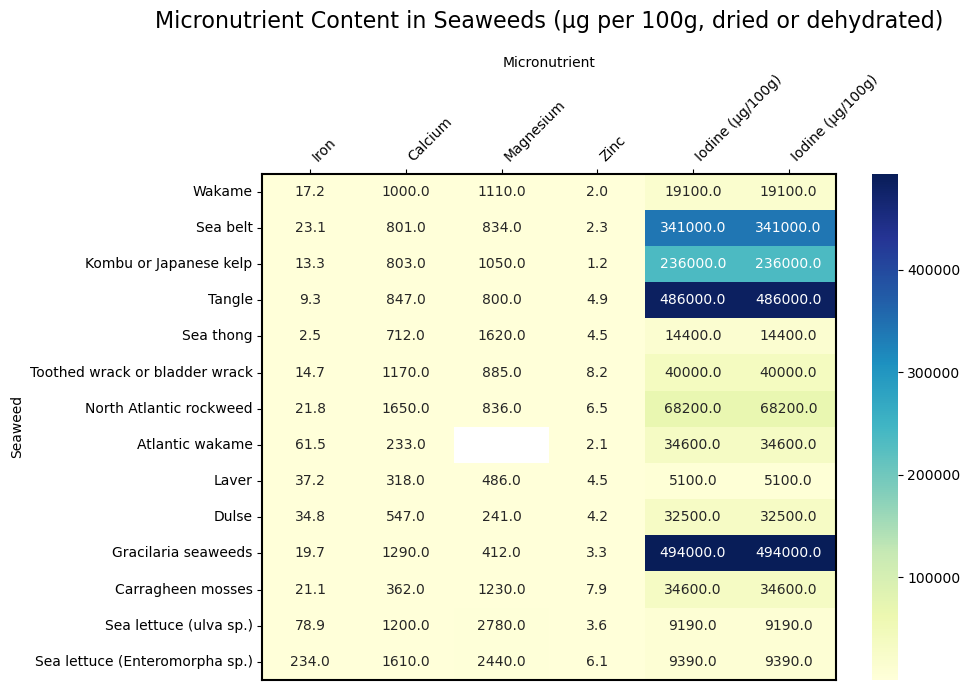

In [484]:
# Select micronutrient columns
micronutrient_cols = ['Iron', 'Calcium', 'Magnesium', 'Zinc', 'Iodine (µg/100g)']

# Set index to seaweed name
heatmap_data_micronutrients = df_seaweed_graph.set_index('seaweed name')[micronutrient_cols]

# Plot heatmap 'YlOrBr'
plt.figure(figsize=(10, len(heatmap_data_micronutrients) * 0.5))
ax = sns.heatmap(heatmap_data_micronutrients, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Micronutrient Content in Seaweeds (μg per 100g, dried or dehydrated)', fontsize=16, pad=20)
ax.set_xlabel('Micronutrient')
ax.set_ylabel('Seaweed')

plt.tight_layout()
plt.show()


## Visual: Vitamins content in seaweed

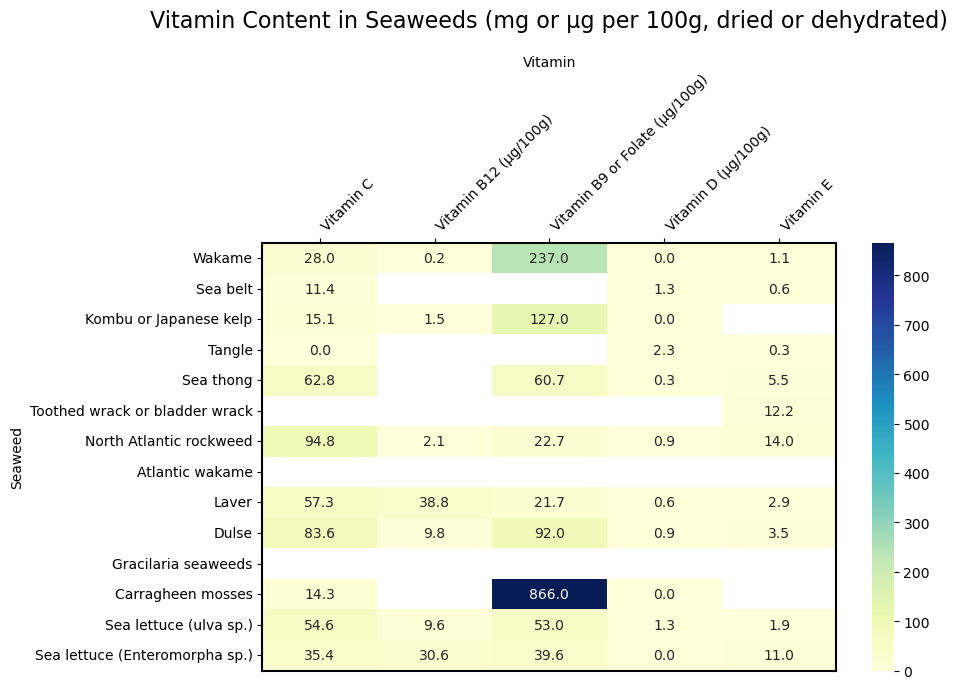

In [485]:
# Select micronutrient columns
vitamin_cols = ['Vitamin C',
    'Vitamin B12 (µg/100g)',
    'Vitamin B9 or Folate (µg/100g)', 
    'Vitamin D (µg/100g)',
    'Vitamin E', ]

# Set index to seaweed name
heatmap_data_vitamins = df_seaweed_graph.set_index('seaweed name')[vitamin_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_data_vitamins) * 0.5))
ax = sns.heatmap(heatmap_data_vitamins, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Vitamin Content in Seaweeds (mg or μg per 100g, dried or dehydrated)', fontsize=16, pad=20)
ax.set_xlabel('Vitamin')
ax.set_ylabel('Seaweed')

plt.tight_layout()
plt.show()


# Go back and clean entire df_ciqual before focusing on protein counts in each seaweed type (color) 

In [486]:
df_ciqual_nutrients_list_intl_cleaned = clean_nutrient_dataframe(df_ciqual_eng_fr, nutrients_list_intl, replacement_map=None, approx_multiplier=0.75, verbose=True)

⚠️ Coerced to NaN in 'Energy, Regulation EU No 1169/2011 (kcal/100g)': ['nan']
⚠️ Coerced to NaN in 'Fat (g/100g)': ['nan']
⚠️ Coerced to NaN in 'FA saturated (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Carbohydrate (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Sugars (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Fibres (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Protein (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Salt (g/100g)': ['nan']
⚠️ Coerced to NaN in 'Iron (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Calcium (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Magnesium (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Phosphorus (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Beta-carotene (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin B12 (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin B9 or Folate (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin D (µg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin C (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin E (mg/100g)': ['nan']
⚠️ Coerced to NaN in 'Vitamin K1 (µg/100g)': [

In [487]:
df_ciqual_nutrients_list_intl_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 79 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       3186 non-null   int64  
 1   alim_ssgrp_code                                     3186 non-null   int64  
 2   alim_ssssgrp_code                                   3186 non-null   int64  
 3   alim_grp_nom_eng                                    3141 non-null   object 
 4   alim_ssgrp_nom_eng                                  3141 non-null   object 
 5   alim_ssssgrp_nom_eng                                3141 non-null   object 
 6   alim_code                                           3186 non-null   Int64  
 7   alim_nom_eng                                        3186 non-null   object 
 8   alim_nom_sci                                        270 non-null    object 
 9

In [488]:
df_ciqual_nutrients_list_intl_cleaned = df_ciqual_nutrients_list_intl_cleaned.copy()

df_ciqual_nutrients_list_intl_cleaned["Omega-3 (EPA + DHA) (g/100g)"] = (
    df_ciqual_nutrients_list_intl_cleaned["FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)"] +
    df_ciqual_nutrients_list_intl_cleaned["FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)"]
)

In [489]:
df_ciqual_nutrients_list_intl_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 80 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       3186 non-null   int64  
 1   alim_ssgrp_code                                     3186 non-null   int64  
 2   alim_ssssgrp_code                                   3186 non-null   int64  
 3   alim_grp_nom_eng                                    3141 non-null   object 
 4   alim_ssgrp_nom_eng                                  3141 non-null   object 
 5   alim_ssssgrp_nom_eng                                3141 non-null   object 
 6   alim_code                                           3186 non-null   Int64  
 7   alim_nom_eng                                        3186 non-null   object 
 8   alim_nom_sci                                        270 non-null    object 
 9

In [490]:
#f_ciqual_seaweed_nutr_intl = df_ciqual_seaweed_nutr_intl.copy()

# function to add a new column with more details about seaweed subgroup
def categorize_seaweed(name):
    name = name.lower()
    if "spirulina" in name:
        return "microalgae"
    elif any(term in name for term in ["agar", "porphyra", "dulse", "gracilaria", "chondrus"]):
        return "red seaweed"
    elif any(term in name for term in ["ulva", "enteromorpha", "sea lettuce"]):
        return "green seaweed"
    elif any(term in name for term in [
        "wakame", "undaria", "saccharina", "kelp", "kombu", "laminaria",
        "himanthalia", "fucus", "ascophyllum", "alaria"
    ]):
        return "brown seaweed"
    else:
        return "unknown"
    

df_ciqual_nutrients_list_intl_cleaned["seaweed_type"] = df_ciqual_nutrients_list_intl_cleaned["alim_nom_eng"].apply(categorize_seaweed)

df_ciqual_nutrients_list_intl_cleaned.head()

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),alim_nom_fr,ALIM_NOM_INDEX_FR,approx_count,Omega-3 (EPA + DHA) (g/100g),seaweed_type
0,0,0,0,NaN,NaN,NaN,24999,Desert (average),NaN,NaN,NaN,NaN,NaN,"45,4",4.63,"4,61",36.60,12.90,23.70,"1,81",NaN,"2,18","1,89","1,07","15,7","9,53",1.54,NaN,"0,92","0,081","0,083",5.18,"4,74","1,68","0,14","0,19","0,083","0,14","0,35","0,55","2,47","0,99","4,62","1,32","0,37","0,012",0.0041,0.0051,56.70,0.38,75.0,178,"0,15",1.45,11.00,23.8,"0,23",107.0,181,"7,04",153,0.50,"56,3",34.6,0.270,1.97,NaN,NaN,1.37,"0,084","0,15","0,61","0,4","0,056",30.8,0.210,Dessert (aliment moyen),Dessert,0,0.0092,unknown
1,1,101,0,starters and dishes,mixed salads,-,25601,"Prepared mixed tuna and vegetable salad, canned",NaN,-,NaN,-,-,"76,5",9.15,"9,15",7.74,4.70,3.08,"0,82",-,"0,78",-,"< 0,3","0,97","4,1",2.70,-,"1,79",0,-,0.56,"1,83","1,76","< 0,05","< 0,05","< 0,05","< 0,05","< 0,05","0,008","0,38","0,12",-,"1,15","0,056",-,0.0080,0.0390,19.20,1.11,20.7,731,"0,1",1.10,2.00,25.1,"0,1",88.4,232,-,445,0.60,< 2,NaN,0.375,1.60,NaN,NaN,2.75,"< 0,04","0,053","4,45","< 0,16","0,29",31.0,1.450,"Salade de thon et légumes, appertisée",Salade de thon et légumes conserve,1,0.0470,unknown
2,1,101,0,starters and dishes,mixed salads,-,25602,"Prepared mixed meat/fish canned, salad",NaN,-,NaN,-,-,"76,7",8.06,"8,06",6.40,5.30,1.90,"0,7",-,"0,6","< 0,2","< 0,2","0,6","3,3",2.00,-,"1,5",0,-,0.16,"3,27","1,54","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","< 0,01","0,12","0,04","2,24","1,08","0,28","0,016",0.0160,0.1500,15.20,0.95,22.0,584,"0,07",0.70,15.00,20.0,"0,1",92.0,220,30,381,0.38,< 21,781.0,0.440,2.04,9.75,NaN,NaN,"0,032","0,022","4,13","0,2","0,12",11.1,1.230,"Salade composée avec viande ou poisson, appertisée",Salade composée avec viande ou poisson conserve,1,0.1660,unknown
3,1,101,0,starters and dishes,mixed salads,-,25605,"Greek-style marinated mushrooms, prepacked",NaN,-,NaN,-,-,"85,2",2.08,"2,08",3.95,3.55,2.38,"0,7",-,1,"< 0,3","< 0,3","0,3","0,99",2.35,-,"1,65",0,-,0.23,"0,2","1,67",-,-,-,-,-,-,-,-,-,-,"0,026",-,NaN,NaN,0.11,1.26,27.0,-,"0,17",1.06,2.46,13.5,"0,13",64.1,277,"1,79",500,0.40,0,747.0,0.000,1.08,NaN,NaN,6.67,"0,056","0,21","1,84","0,88","0,088",19.6,0.018,"Champignons à la grecque, appertisés",Champignon sauce tomate conserve,0,NaN,unknown
4,1,101,0,starters and dishes,mixed salads,-,25606,"

In [491]:
df_ciqual_nutrients_list_intl_cleaned.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 81 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       3186 non-null   int64  
 1   alim_ssgrp_code                                     3186 non-null   int64  
 2   alim_ssssgrp_code                                   3186 non-null   int64  
 3   alim_grp_nom_eng                                    3141 non-null   object 
 4   alim_ssgrp_nom_eng                                  3141 non-null   object 
 5   alim_ssssgrp_nom_eng                                3141 non-null   object 
 6   alim_code                                           3186 non-null   Int64  
 7   alim_nom_eng                                        3186 non-null   object 
 8   alim_nom_sci                                        270 non-null    object 
 9

## Detect protein-rich animal based foods

### Find animal-based food groups

In [492]:
pd.set_option('display.max_row', None)

df_ciqual_nutrients_list_intl_cleaned['alim_ssgrp_nom_eng'].value_counts().sort_index()


alim_ssgrp_nom_eng
-                                             1
Viennese pastries                            23
alcoholic beverages                          49
baby biscuits and cereals                     4
baby deserts                                  5
baby dishes                                  13
baby milk and beverages                      17
breads and similar                           56
breakfast cereals                            48
butters                                      13
cakes and pastry                             85
cereal bars                                   8
cheese and similar                          135
chocolate and chocolate products             31
condiments                                   17
cooked meat                                 133
cooking aids                                 12
cream and similar                             9
dairy products and similar                  137
delicatessen meat and similar               173
dishes               

In [493]:
target_subgroups = ['cooked meat', 'raw meat', 'eggs', 'delicatessen meat and similar', 'meat substitute', 'other meat products ']
df_ciqual_nutrients_list_intl_cleaned_filtered = df_ciqual_nutrients_list_intl_cleaned[df_ciqual_nutrients_list_intl_cleaned['alim_ssgrp_nom_eng'].isin(target_subgroups)]
df_ciqual_nutrients_list_intl_cleaned_filtered.info()

df_ciqual_nutrients_list_intl_cleaned_filtered.head(10)

<class 'pandas.core.frame.DataFrame'>
Index: 498 entries, 1141 to 1928
Data columns (total 81 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       498 non-null    int64  
 1   alim_ssgrp_code                                     498 non-null    int64  
 2   alim_ssssgrp_code                                   498 non-null    int64  
 3   alim_grp_nom_eng                                    498 non-null    object 
 4   alim_ssgrp_nom_eng                                  498 non-null    object 
 5   alim_ssssgrp_nom_eng                                498 non-null    object 
 6   alim_code                                           498 non-null    Int64  
 7   alim_nom_eng                                        498 non-null    object 
 8   alim_nom_sci                                        0 non-null      object 
 9   

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),alim_nom_fr,ALIM_NOM_INDEX_FR,approx_count,Omega-3 (EPA + DHA) (g/100g),seaweed_type
1141,4,401,0,"meat, egg and fish",cooked meat,-,6584,"white meat, cooked (average)",NaN,728,173.0,728,173,"64,2",28.1,"28,1",0.260000,6.55,0.0019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0009,0,"1,3",0,"0,23",2.15,"2,54","1,04","0,0069","0,0069","0,0075","0,0092","0,013","0,073","1,46","0,62","2,21","0,8","0,07","0,041",0.0089,0.00930,91.8,0.17,9.43,NaN,"0,059",0.84,7.23,31.3,"0,014",233.0,376,"15,6","69,7",2.01,"8,81",0.29,0.290,0.20,1.27,NaN,0.81,"0,27","0,14","8,66","1,06","0,35",7.74,0.61,"Viande blanche, cuite (aliment moyen)",Viande blanche,0,0.01820,unknown
1142,4,401,0,"meat, egg and fish",cooked meat,-,6585,"Red meat, cooked (average)",NaN,816,195.0,816,195,"62,6",26.0,26,0.027000,10.10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0000,0,"1,38",0,0,4.16,"3,83","0,6",NaN,NaN,NaN,"0,004","0,013","0,25","2,26","1,36","3,48","0,25","0,036","0,03",NaN,0.00150,76.7,0.22,11.80,NaN,"0,12",2.84,6.17,28.3,"0,038",201.0,338,"7,77","96,4",5.44,"5,05",0.83,0.094,0.25,NaN,NaN,NaN,"0,084","0,24","5,76","0,93","0,4",9.44,2.31,"Viande rouge, cuite (aliment moyen)",Viande rouge,0,NaN,unknown
1143,4,401,0,"meat, egg and fish",cooked meat,-,6999,"Meat, cooked (average)",NaN,765,182.0,765,182,"63,5",27.2,"27,2",0.240000,8.04,0.0110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0083,0,"1,33",0,"0,13",3.00,"3,09","0,86","0,0047","0,0047","0,0052","0,0074","0,013","0,15","1,79","0,92","2,76","0,56","0,055","0,036",0.0067,0.00620,85.8,0.20,10.40,NaN,"0,084",1.69,6.72,30.1,"0,023",222.0,361,"12,3","81,6",3.45,"7,52",0.52,0.220,0.22,1.41,NaN,0.69,"0,21","0,17","7,45","1,01","0,37",8.38,1.31,Viande cuite (aliment moyen),Viande,0,0.01290,unknown
1144,4,401,0,"meat, egg and fish",cooked meat,-,36900,"Poultry, cooked (average)",NaN,698,166.0,698,166,"65,5",27.6,"27,6",0.280000,5.96,0.0022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0013,0,"1,31",0,"0,33",1.77,"2,15","1,12","0,0083","0,0083","0,0084","0,009","0,013","0,035","1,28","0,42","1,83","0,81","0,054",NaN,0.0066,0.01200,99.3,0.24,8.45,127,"0,086",1.05,7.77,33.0,"0,015",239.0,377,"14,8","97,9",1.57,"11,1",0.83,0.240,0.20,1.84,NaN,1.15,"0,095","0,17","9,82","1,37","0,38",8.10,0.58,"Volaille, cuite (aliment moyen)",Volaille,0,0.01860,unknown
1145,4,401,40101,"meat, egg and fish",cooked meat,beef a

### Beef Foods

In [494]:
df_ciqual_nutrients_list_intl_cleaned_filtered.loc[df_ciqual_nutrients_list_intl_cleaned_filtered['alim_nom_eng'].str.contains('egg', case=False, na=False)]

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),alim_nom_fr,ALIM_NOM_INDEX_FR,approx_count,Omega-3 (EPA + DHA) (g/100g),seaweed_type
1551,4,403,40308,"meat, egg and fish",delicatessen meat and similar,other delicatessen,8380,"Egg in aspic, w ham",NaN,-,NaN,-,-,"81,9",11.50,"11,5",NaN,4.70,NaN,-,-,-,-,-,-,-,NaN,0,"1,6",0,0,NaN,-,-,-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,NaN,1.350,26.20,-,-,1.000,NaN,7.10,-,NaN,113,-,541,0.800,-,NaN,NaN,NaN,NaN,NaN,NaN,-,-,-,-,-,NaN,NaN,Oeuf au jambon en gelée,œuf au jambon en gelée,0,NaN,unknown
1899,4,410,41001,"meat, egg and fish",eggs,"eggs, cooked",22008,"Egg white, cooked",NaN,201,47.3,201,"47,3","87,8",10.30,"10,3",1.12,0.17,0.70,"0,07","0,07","0,34","0,07","0,07","0,07",0,0.0,0,"0,6",0,0,0.00,0,0,-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,0.0,0.390,6.67,-,"0,023",0.067,NaN,9.67,"0,011",14.7,147,"6,1",155,0.025,0,0.0,0.00,0.00,NaN,NaN,0.000,"0,006","0,35","0,078","0,18","0,007",7.9,0.056,"Oeuf, blanc (blanc d'oeuf), cuit","Blanc d'œuf, cuit",0,NaN,unknown
1900,4,410,41001,"meat, egg and fish",eggs,"eggs, cooked",22009,"Egg yolk, cooked",NaN,1410,340.0,1410,340,"50,3",16.00,16,1.31,30.10,0.55,"0,07","0,07","0,18","0,07","0,07","0,07",0,0.0,0,"2,24",0,0,8.49,"12,1","4,45",-,-,-,-,-,"0,077","6,23","1,95","11,2","3,51","0,17","0,45",NaN,0.240,612.0,0.035,76.40,"0,2","0,15",0.950,192.0,4.50,"< 0,1",121.0,"58,6","76,4",14,1.400,263,106.0,2.11,5.00,NaN,NaN,0.000,"0,17","0,39","< 0,16","4,54","0,3",166.0,2.430,"Oeuf, jaune (jaune d'oeuf), cuit","Jaune d'œuf, cuit",0,NaN,unknown
1901,4,410,41001,"meat, egg and fish",eggs,"eggs, cooked",22010,"Egg, hard-boiled",NaN,557,134.0,557,134,"76,5",13.50,"13,5",0.52,8.62,0.52,"0,075","0,075","0,14","0,075","0,075","0,075",0,0.0,0,"0,88",0,0,2.55,"3,57","1,03",0,0,"0,0026","0,0026","0,0033","0,029","2,01","0,5","3,57","0,88","0,038","0,076",0.0031,0.035,355.0,0.310,41.00,182,"0,068",1.720,49.7,14.00,"0,031",172.0,120,"7,01",123,1.270,"61,5",11.0,1.12,1.03,0.3,NaN,0.000,"0,066","0,51","0,064","1,4","0,12",44.0,1.110,"Oeuf, dur",œuf cuit,0,0.0381,unknown
1902,4,410,41001,"meat, egg and fish",eggs,"eggs, cooked",22011,"Egg, poached",NaN,575,138.0,575,138,"75,9",12.50,"12,5",0.71,9.47,0.37,0,0,"0,37",0,0,0,0,0.0,0,"1,46",0,0,2.99,"4,04","1,49","0,0039",0,"0,0039",-,0,"0,019","2,18","0,79",-,-,-,-,0.0000,0.058,370.0,0.200,68.20,-,"0,069",1.750,52.0,10.80,"0,03",19

In [495]:
df_ciqual_nutrients_list_intl_cleaned[['alim_nom_eng', 'alim_code']].loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('beef', case=False, na=False)]

# Define specific beef indices to compare with seaweeds
index_list_beef = [
    1145,  # Beef, rib steak, lean, grilled/pan-fried
    1149,  # Beef, sirloin steak, grilled/pan-fried
    1156,  # Beef steak, grilled
    1163,  # Beef, stewing meat, cooked
    1165,  # Minced steak, 5% fat, cooked
    1166,  # Minced steak, 10% fat, cooked
    1167,  # Minced steak, 15% fat, cooked
    1168,  # Minced steak, 20% fat, cooked
    1169,  # Ground beef, cooked (average)
    1170,  # Beef chuck, braised or boiled
    1581   # Viande des Grisons
]

# food_lookup_beef = {
#     1145: "Beef, rib steak, lean, grilled/pan-fried",
#     1149: "Beef, sirloin steak, grilled/pan-fried",
#     1156: "Beef steak, grilled",
#     1163: "Beef, stewing meat, cooked",
#     1165: "Minced steak, 5% fat, cooked",
#     1166: "Minced steak, 10% fat, cooked",
#     1167: "Minced steak, 15% fat, cooked",
#     1168: "Minced steak, 20% fat, cooked",
#     1169: "Ground beef, cooked (average)",
#     1170: "Beef chuck, braised or boiled",
#     1581: "Viande des Grisons"
# }


### Heatmap of protein and fat levels across all "beef" foods in ciqual database

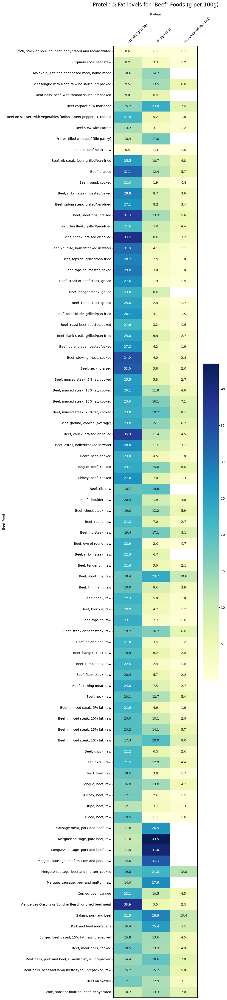

In [496]:
#df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('beef', case=False, na=False)]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_beef_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('beef', case=False, na=False)].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_beef_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_beef_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels for "Beef" Foods (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Protein')
ax.set_ylabel('Beef Food')

plt.tight_layout()
plt.show()

### Chicken Foods

In [497]:
df_ciqual_nutrients_list_intl_cleaned[['alim_nom_eng', 'alim_code']].loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('chicken', case=False, na=False)]

# Define list of indexes for chicken foods
index_list_chicken = [
    1198,  # Chicken, leg, meat and skin, roasted/baked
    1199,  # Chicken, meat and skin, roasted/baked
    1200,  # Chicken leg, meat, roasted/baked
    1201,  # Chicken, breast, without skin, cooked
    1202,  # Chicken leg, meat, boiled/cooked in water
    1203,  # Chicken, leg, meat and skin, boiled/cooked in water
    1204,  # Chicken, breast, meat and skin, roasted/baked
    1205,  # Chicken, wing, meat and skin, roasted/baked
    1206,  # Chicken, breast, without skin, cooked, organic
    1622   # Chicken, marinated wing, roasted/baked
]

# food_lookup_chicken = {
#     1198: "Chicken leg, meat and skin, roasted/baked",
#     1199: "Chicken meat and skin, roasted/baked",
#     1200: "Chicken leg meat, roasted/baked",
#     1201: "Chicken breast without skin, cooked",
#     1202: "Chicken leg meat, boiled",
#     1203: "Chicken leg meat and skin, boiled",
#     1204: "Chicken breast with skin, roasted/baked",
#     1205: "Chicken wing with skin, roasted/baked",
#     1206: "Chicken breast without skin, cooked (organic)",
#     1622: "Chicken marinated wing, roasted/baked"
# }



### Heatmap of protein and fat levels across all "chicken" foods in ciqual database

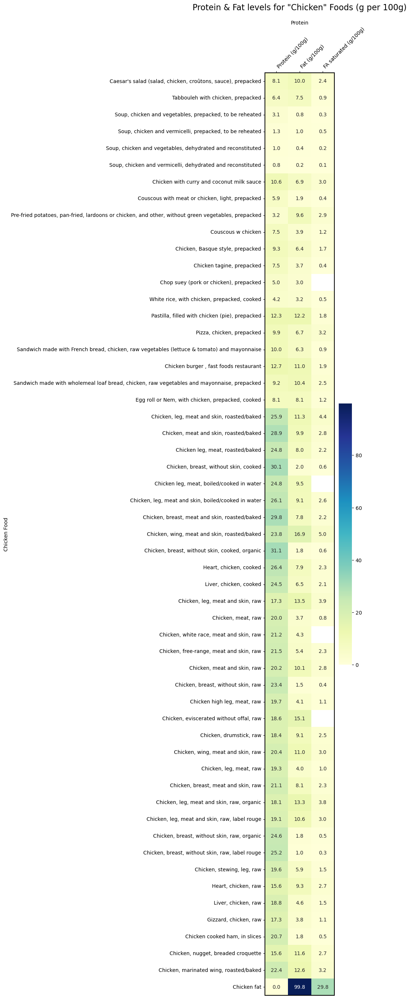

In [498]:
# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_chicken_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('chicken', case=False, na=False)].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_chicken_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_chicken_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels for "Chicken" Foods (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Protein')
ax.set_ylabel('Chicken Food')

plt.tight_layout()
plt.show()

### Fish foods

In [499]:
# Define list of indexes for fish foods
index_list_fish_foods = [
    1625, 1645, 1665, 1666, 1668, 1635, 1654, 1879, 1880, 1881, 1883,
    1626, 1639, 1640, 1641, 1877, 1885, 1655, 1659, 1660, 1872, 1873, 1875,
    1874, 1889, 1890, 1895, 1844, 1845, 1846, 1847, 1848, 1849, 1858
]

# food_lookup_fish = {
food_lookup_fish = {
    1625: "Salmon, cooked (average)",
    1645: "Salmon, smoked",
    1665: "Salmon, microwaved, farmed",
    1666: "Salmon, boiled/cooked in water, farmed",
    1668: "Salmon, grilled/pan-fried",
    1635: "Mackerel, roasted/baked",
    1654: "Mackerel, smoked",
    1879: "Mackerel, fillet, in tomato sauce, canned, drained",
    1880: "Mackerel, fillet, in mustard sauce, canned, drained",
    1881: "Mackerel, fillet, in white wine, canned, drained",
    1883: "Mackerel, canned in brine, drained",
    1626: "Cod, cooked (average)",
    1639: "Cod, roasted/baked",
    1640: "Cod, salted, boiled/cooked in water",
    1641: "Cod, steamed",
    1877: "Cod roe, smoked, semi-preserved",
    1885: "Cod liver, canned, drained",
    1655: "Haddock, smoked",
    1659: "Haddock, grilled/pan-fried",
    1660: "European pilchard or sardine, grilled",
    1872: "European pilchard or sardine, in oil, canned, drained",
    1873: "European pilchard or sardine, in tomato sauce, canned, drained",
    1875: "European pilchard or sardine, in olive oil, canned, drained",
    1874: "Tuna, plain, canned, drained",
    1889: "Tuna, whole slice, in sunflower oil, canned, drained",
    1890: "Yellowfin tuna, canned in brine, drained",
    1895: "Tuna, flaked, in tomato sauce, canned, drained",
    1844: "Rillette, fish, prepacked",
    1845: "Rillettes, salmon, prepacked",
    1846: "Rillettes, tuna, prepacked",
    1847: "Rillettes, mackerel, prepacked",
    1848: "Fish terrine, prepacked",
    1849: "Seafood terrine, with or without fish, prepacked",
    1858: "Caribbean-style fish fritters, fish acras"
}


### Heatmap of protein and fat levels across all "fish & seafoods" in ciqual database

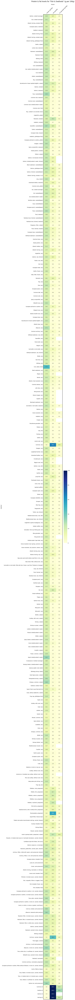

In [500]:
# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_fish_and_seaweeds_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.loc[df_ciqual_nutrients_list_intl_cleaned['alim_ssgrp_nom_eng'].str.contains('fish|seafood', case=False, na=False)].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_fish_and_seaweeds_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_fish_and_seaweeds_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels for "Fish & Seafoods" (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Protein')
ax.set_ylabel('Seafood')

plt.tight_layout()
plt.show()

### Veal, Duck, Lamb, Pork & Rabbit

In [501]:
# Define list of indexes for fish foods
index_list_veal = [
    71,    # Veal escalope, cooked
    77,    # Veal chop, grilled
    86,    # Veal roast, cooked
    1172,  # Veal, blanquette, cooked dish
    1173,  # Veal, sautéed, cooked dish
    1174,  # Veal, roast, cooked dish
    1175,  # Veal, escalope, cooked dish
    1176,  # Veal, chop, cooked dish
    1177,  # Veal, shank, cooked dishh
]


index_list_duck = [
    74,    # Duck breast, grilled
    98,    # Duck confit
    99,    # Duck aiguillette, cooked
    107,   # Duck leg, roasted
    1242,  # Duck, roast, cooked dish
    1243,  # Duck, confit, cooked dish
    1244,  # Duck, breast, cooked dish
]


index_list_lamb = [
    73,    # Lamb chop, grilled
    112,   # Leg of lamb, roasted
    1210,  # Lamb, roast, cooked dish
    1211,  # Lamb, sautéed, cooked dish
    1212,  # Lamb, chop, cooked dish
    1213,  # Lamb, leg, cooked dish
    1214,  # Lamb, shoulder, cooked dish
    1216,  # Lamb, breast, cooked dish
]

index_list_pork = [
    82,    # Pork chop, grilled
    84,    # Pork tenderloin, roasted
    102,   # Cooked ham
    105,   # Dry-cured ham
    106,   # Smoked bacon, cooked
    117,   # Toulouse sausage, grilled
    255,   # Dry sausage
    303,   # Pork roast, cooked
    335,   # Bacon, grilled
    1185,  # Pork, roast, cooked dish
    1187,  # Pork, sautéed, cooked dish
    1188,  # Pork, chop, cooked dish
    1189,  # Pork, tenderloin, cooked dish
    1190,  # Pork, shank, cooked dish
    1191,  # Pork, breast, cooked dish
    1192,  # Pork, ribs, cooked dish
    1193,  # Pork, shoulder blade, cooked dish
    1194,  # Pork, shoulder, cooked dish
]

index_list_rabbit = [
    75,    # Rabbit, roasted
    1237,  # Rabbit, roast, cooked dish
    1238,  # Rabbit, sautéed, cooked dish
]


### Heatmap of protein and fat levels in Veal, Duck, Lamb, Pork & Rabbit

In [502]:
df_lamb_and_company = df_ciqual_nutrients_list_intl_cleaned[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('', case=False, na=False)]


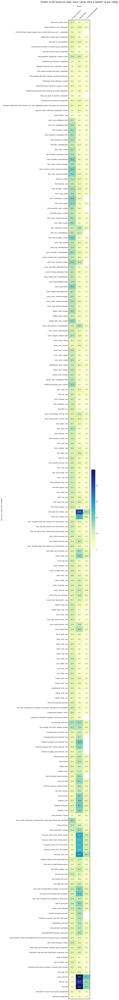

In [503]:
# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_veal_and_company_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.loc[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('duck|pork|lamb|rabbit|veal', case=False, na=False)].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_veal_and_company_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_veal_and_company_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels for Veal, Duck, Lamb, Pork & Rabbit" (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Protein')
ax.set_ylabel('Veal, Duck, Lamb, Pork & Rabbit')

plt.tight_layout()
plt.show()

# Visuals: Protein levels in animal-based Foods compared to different seaweed color types (brown, red or green)

In [504]:
df_seaweed_ordered[['seaweed_type', 'alim_nom_eng']]

,seaweed_type,alim_nom_eng
3101,algue brune,"Wakame (Undaria pinnatifida), dried or dehydrated"
3103,algue brune,"Sea belt (Saccharina latissima), dried or dehydrated"
3106,algue brune,"Kombu or Japanese kelp (Laminaria japonica), dried or dehydrated"
3107,algue brune,"Tangle (Laminaria digitata), dried or dehydrated"
3108,algue brune,"Sea thong (Himanthalia elongata), dried or dehydrated"
3110,algue brune,"Toothed wrack or bladder wrack (Fucus serratus et vesiculosus), dried or dehydrated"
3113,algue brune,"North Atlantic rockweed (Ascophyllum nodosum), dried or dehydrated"
3114,algue brune,"Atlantic wakame (Alaria esculenta), dried or dehydrated"
3104,algue rouge,"Laver (Porphyra sp.), dried or dehydrated"
3105,algue rouge,"Dulse (Palmaria palmata), dried or dehydrated"


# GRAPHS by seaweed type

# Brown seaweeds

## Beef & Chicken Protein-levels comparison with Brown Seaweeds

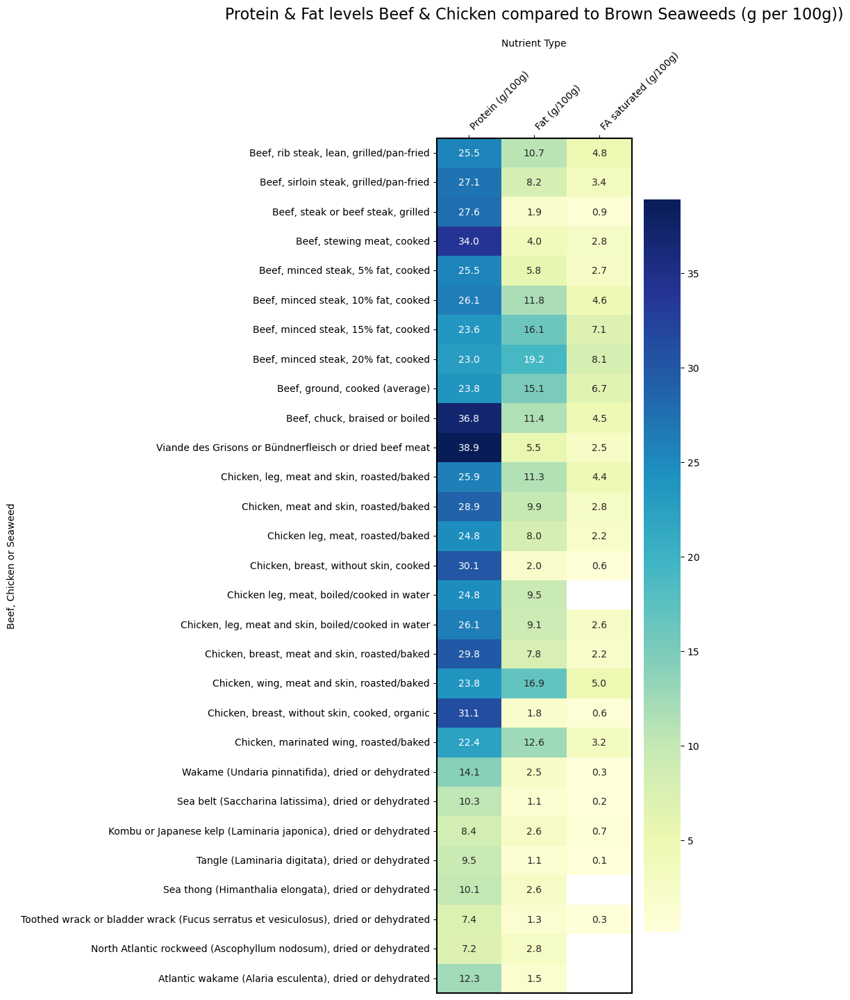

In [505]:
# Define list of indexes
index_list_beef = [1145, 1149, 1156, 1163, 1165, 1166, 1167, 1168, 1169, 1170, 1581]
index_list_chicken = [1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1622]
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_beef+index_list_chicken+index_list_brown_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Beef & Chicken compared to Brown Seaweeds (g per 100g))', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Beef, Chicken or Seaweed')

plt.tight_layout()
plt.show()

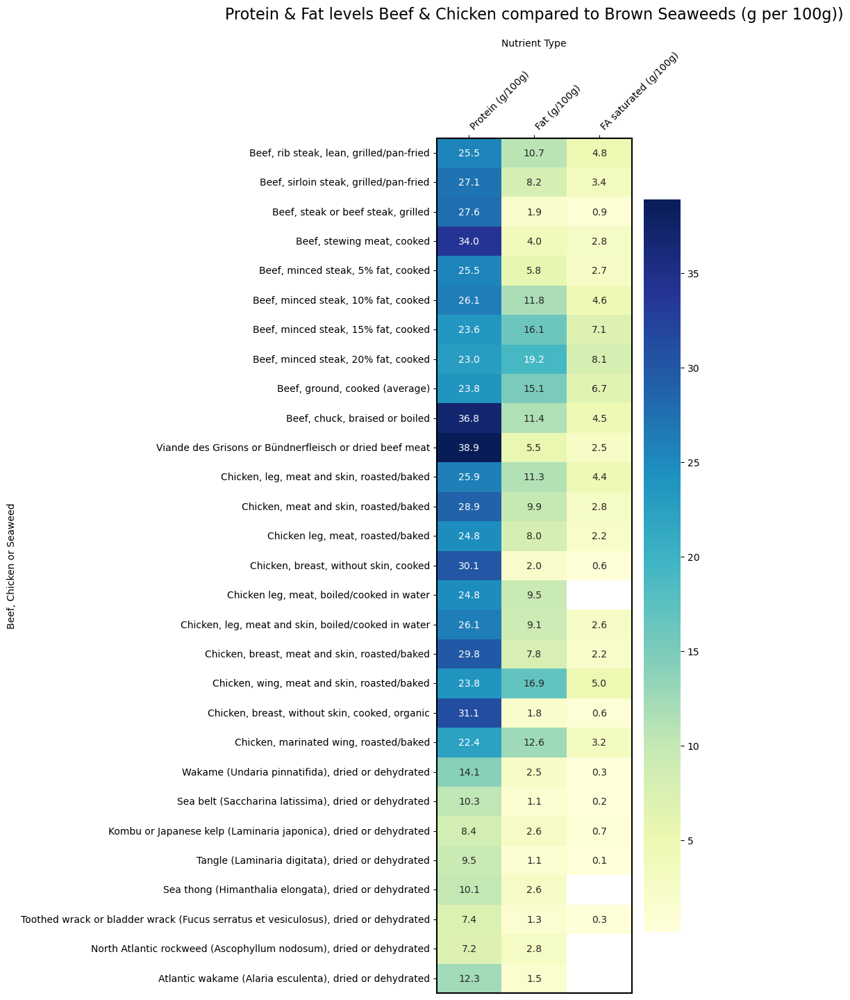

In [506]:
# Define list of indexes
index_list_beef = [1145, 1149, 1156, 1163, 1165, 1166, 1167, 1168, 1169, 1170, 1581]
index_list_chicken = [1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1622]
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_beef+index_list_chicken+index_list_brown_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_beef_and_chicken_brown_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Beef & Chicken compared to Brown Seaweeds (g per 100g))', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Beef, Chicken or Seaweed')

plt.tight_layout()
plt.show()

## Fish & Seafoods Protein-levels comparison with Brown Seaweeds

In [507]:
# Define list of indexes for fish foods
index_list_fish_foods = [
    1625, 1645, 1665, 1666, 1668, 1635, 1654, 1879, 1880, 1881, 1883,
    1626, 1639, 1640, 1641, 1877, 1885, 1655, 1659, 1660, 1872, 1873, 1875,
    1874, 1889, 1890, 1895, 1844, 1845, 1846, 1847, 1848, 1849, 1858
]

# Define list of indexes for seafood foods
index_list_seafood_foods = [
    1796, 1797, 1805, 1802, 1804, 1808, 1809, 1799, 1803, 1795, 1800,
    1813, 1806, 1815, 1822, 1851, 1852, 1853, 1854, 1855, 1857
]

index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]


In [508]:
#invalid_indices = [i for i in index_list_fish_foods + index_list_seafood_foods + index_list_brown_seaweed if i >= len(df_ciqual_nutrients_list_intl_cleaned)]
#print("Invalid indices:", invalid_indices)


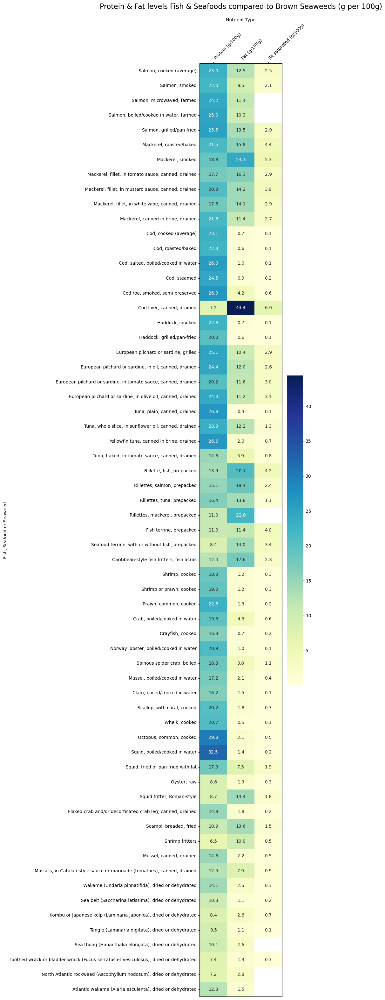

In [509]:
# Define list of indexes for fish foods
index_list_fish_foods = [
    1625, 1645, 1665, 1666, 1668, 1635, 1654, 1879, 1880, 1881, 1883,
    1626, 1639, 1640, 1641, 1877, 1885, 1655, 1659, 1660, 1872, 1873, 1875,
    1874, 1889, 1890, 1895, 1844, 1845, 1846, 1847, 1848, 1849, 1858
]

# Define list of indexes for seafood foods
index_list_seafood_foods = [
    1796, 1797, 1805, 1802, 1804, 1808, 1809, 1799, 1803, 1795, 1800,
    1813, 1806, 1815, 1822, 1851, 1852, 1853, 1854, 1855, 1857
]

index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_fish_and_seafoods_brown_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_fish_foods+index_list_seafood_foods+index_list_brown_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_fish_and_seafoods_brown_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_fish_and_seafoods_brown_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Fish & Seafoods compared to Brown Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Fish, Seafood or Seaweed')

plt.tight_layout()
plt.show()

## Veal, Duck, Lamb, Pork & Rabbit Protein-levels comparison with Brown Seaweeds

In [510]:
df_lamb_and_company = df_ciqual_nutrients_list_intl_cleaned[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('duck|pork|lamb|rabbit|veal', case=False, na=False)]
df_lamb_and_company['alim_nom_eng'].head(15)

71                                                      Veal stew in white sauce
73                                              Sauté of lamb w curry, prepacked
74     Duck with sauce (green pepper sauce, hunter-style sauce,etc.) , prepacked
75                                          Rabbit with mustard sauce, prepacked
77                                                  Veal olive or veal paupiette
82                            Devilled pork shoulder in mustard sauce, prepacked
84                                            Pork with caramel sauce, prepacked
86                                     Veal paupiette, prepacked, cooked in oven
98                                           Shepherd's pie with duck, prepacked
99                                   Shepherd's pie with duck, prepacked, cooked
102                                Salt-cured pork belly with lentils, prepacked
105                         Pork sausage stew with cabbage, carrots and potatoes
106                         

In [511]:
df_ciqual_nutrients_list_intl_cleaned[df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('duck|pork|lamb|rabbit|veal', case=False, na=False)]

,alim_grp_code,alim_ssgrp_code,alim_ssssgrp_code,alim_grp_nom_eng,alim_ssgrp_nom_eng,alim_ssssgrp_nom_eng,alim_code,alim_nom_eng,alim_nom_sci,"Energy, Regulation EU No 1169/2011 (kJ/100g)","Energy, Regulation EU No 1169/2011 (kcal/100g)","Energy, N x Jones' factor, with fibres (kJ/100g)","Energy, N x Jones' factor, with fibres (kcal/100g)",Water (g/100g),Protein (g/100g),"Protein, crude, N x 6.25 (g/100g)",Carbohydrate (g/100g),Fat (g/100g),Sugars (g/100g),fructose (g/100g),galactose (g/100g),glucose (g/100g),lactose (g/100g),maltose (g/100g),sucrose (g/100g),Starch (g/100g),Fibres (g/100g),Polyols (g/100g),Ash (g/100g),Alcohol (g/100g),Organic acids (g/100g),FA saturated (g/100g),FA mono (g/100g),FA poly (g/100g),FA 4:0 (g/100g),FA 6:0 (g/100g),FA 8:0 (g/100g),FA 10:0 (g/100g),FA 12:0 (g/100g),FA 14:0 (g/100g),FA 16:0 (g/100g),FA 18:0 (g/100g),FA 18:1 n-9 cis (g/100g),"FA 18:2 9c,12c (n-6) (g/100g)","FA 18:3 c9,c12,c15 (n-3) (g/100g)","FA 20:4 5c,8c,11c,14c (n-6) (g/100g)","FA 20:5 5c,8c,11c,14c,17c (n-3) EPA (g/100g)","FA 22:6 4c,7c,10c,13c,16c,19c (n-3) DHA (g/100g)",Cholesterol (mg/100g),Salt (g/100g),Calcium (mg/100g),Chloride (mg/100g),Copper (mg/100g),Iron (mg/100g),Iodine (µg/100g),Magnesium (mg/100g),Manganese (mg/100g),Phosphorus (mg/100g),Potassium (mg/100g),Selenium (µg/100g),Sodium (mg/100g),Zinc (mg/100g),Retinol (µg/100g),Beta-carotene (µg/100g),Vitamin D (µg/100g),Vitamin E (mg/100g),Vitamin K1 (µg/100g),Vitamin K2 (µg/100g),Vitamin C (mg/100g),Vitamin B1 or Thiamin (mg/100g),Vitamin B2 or Riboflavin (mg/100g),Vitamin B3 or Niacin (mg/100g),Vitamin B5 or Pantothenic acid (mg/100g),Vitamin B6 (mg/100g),Vitamin B9 or Folate (µg/100g),Vitamin B12 (µg/100g),alim_nom_fr,ALIM_NOM_INDEX_FR,approx_count,Omega-3 (EPA + DHA) (g/100g),seaweed_type
71,1,103,10301,starters and dishes,dishes,"meat dishes, no garnish",25001,Veal stew in white sauce,NaN,474,113.0,474,113,"75,1",15.40,"15,4",3.100000,4.000,0.300000,"< 0,2",-,"< 0,2","< 0,2","< 0,2","0,3","1,9",0.800000,0,"1,25",0,"0,32",2.0300,"1,36","0,26","0,06","0,04","0,02","0,04","0,06","0,25",1,"0,5","1,18","0,21","0,02","0,03",0.007500,0.007500,56.6,0.74000,15.00,432,"0,07",0.92,15.00,12.00,"0,04",110.0,190,< 20,295,3.20,< 21,736.00,0.187500,0.37,2.55,NaN,0.3750,"0,062","0,047","1,77","0,33","0,074",23.300,1.59,Blanquette de veau,Blanquette de veau,5,0.015000,unknown
73,1,103,10301,starters and dishes,dishes,"meat dishes, no garnish",25035,"Sauté of lamb w curry, prepacked",NaN,-,NaN,-,-,"73,5",10.50,"10,5",NaN,13.900,NaN,-,-,-,-,-,-,-,1.000000,0,"1,7",0,traces,6.7000,-,-,-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,NaN,1.29000,17.50,-,"0,07",2.15,NaN,13.30,"0,04",181.0,200,-,514,2.77,-,NaN,NaN,NaN,NaN,NaN,NaN,-,-,-,-,-,NaN,NaN,"Sauté d'agneau au curry, préemballé",Curry d'agneau,0,NaN,unknown
74,1,103,10301,starters and dishes,dishes,"meat dishes, no garnish",25058,"Duck with sauce (green pepper sauce, hunter-style sauce,etc.) , prepacked",NaN,605,145.0,605,145,-,9.55,"9,55",10.200000,7.300,NaN,-,-,-,-,-,-,-,0.000001,0,-,0,traces,NaN,-,-,-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,NaN,NaN,NaN,-,-,NaN,NaN,NaN,-,NaN,-,-,-,NaN,-,NaN,NaN,NaN,NaN,NaN,NaN,-,-,-,-,-,NaN,NaN,"Canard en sauce (poivre vert, chasseur, etc.), préemballé","Canard en sauce (poivre vert, chasseur, etc.)",0,NaN,unknown
75,1,103,10301,starters and dishes,dishes,"meat dishes, no garnish",25063,"Rabbit with mustard sauce, prepacked",NaN,453,108.0,453,108,-,14.90,"14,9",0.500000,5.000,0.500000,-,-,-,-,-,-,-,0.800000,0,"1,2",0,traces,2.1000,-,-,-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,NaN,1.20000,NaN,-,-,NaN,NaN,NaN,-,NaN,-,-,480,NaN,-,NaN,NaN,NaN,NaN,NaN,NaN,-,-,-,-,-,NaN,NaN,"Lapin à la moutarde, préemballé",Lapin à la moutarde,0,NaN,unknown
77,1,103,10301,starters and dishes,dishes,"meat dishes, no garnish",25125,Veal olive or veal paupiette,NaN,801,193.0,801,193,"64,1",14.50,"14,5",2.600000,13.800,0.410000,-,-,-,-,-,-,"2,19",0.200000,0,"1,74",0,traces,5.4500,"3,05","1,28",-,-,-,-,-,-,-,-,-,-,-,-,NaN,NaN,63.3,1.26000,27.60,-,"0,088",1.00

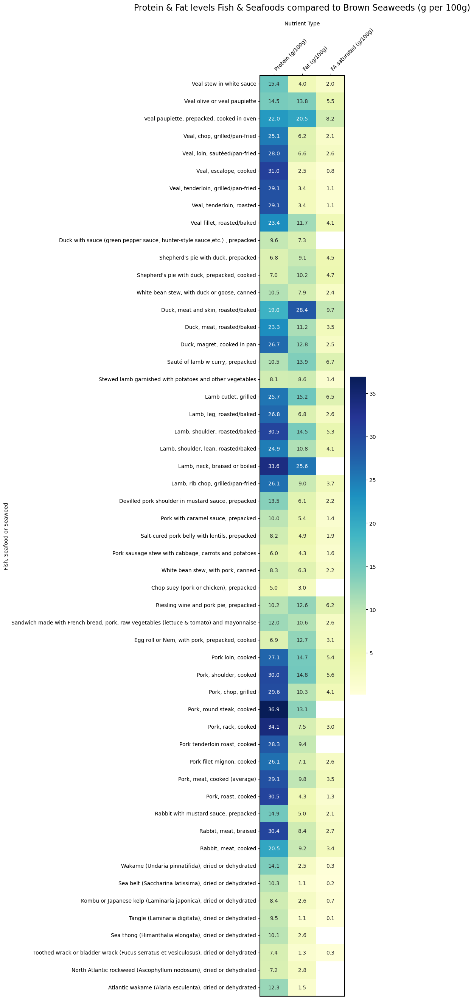

In [512]:
# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_veal_and_company_brown_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_veal+index_list_duck+index_list_lamb+index_list_pork+index_list_rabbit+index_list_brown_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_veal_and_company_brown_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_veal_and_company_brown_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Fish & Seafoods compared to Brown Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Fish, Seafood or Seaweed')

plt.tight_layout()
plt.show()

# Red Seaweeds

## Beef & Chicken Protein-levels comparison with Red Seaweeds

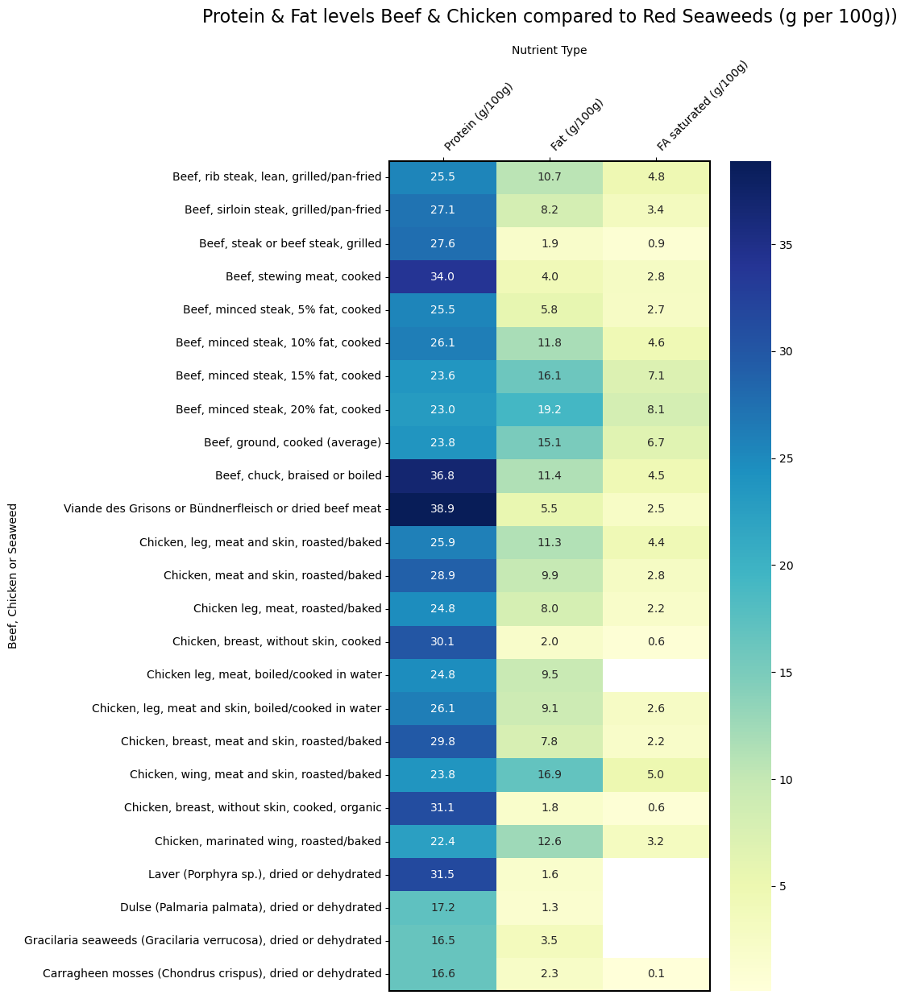

In [513]:

# Define list of indexes
index_list_beef = [1145, 1149, 1156, 1163, 1165, 1166, 1167, 1168, 1169, 1170, 1581]
index_list_chicken = [1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1622]
index_list_red_seaweed = [3104, 3105, 3109, 3112]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_beef_and_chicken_red_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_beef+index_list_chicken+index_list_red_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_beef_and_chicken_red_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_beef_and_chicken_red_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Beef & Chicken compared to Red Seaweeds (g per 100g))', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Beef, Chicken or Seaweed')

plt.tight_layout()
plt.show()

## Fish & Seafoods Protein-levels comparison with Red Seaweeds

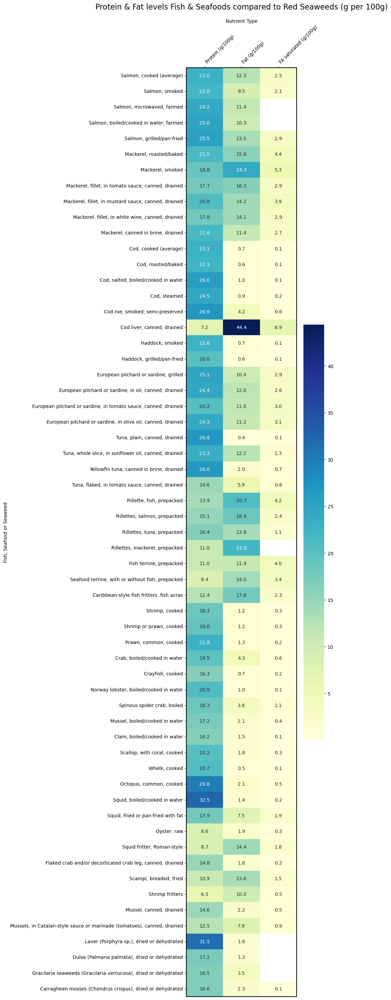

In [514]:

# Define list of indexes for fish foods
index_list_fish_foods = [
    1625, 1645, 1665, 1666, 1668, 1635, 1654, 1879, 1880, 1881, 1883,
    1626, 1639, 1640, 1641, 1877, 1885, 1655, 1659, 1660, 1872, 1873, 1875,
    1874, 1889, 1890, 1895, 1844, 1845, 1846, 1847, 1848, 1849, 1858
]

# Define list of indexes for seafood foods
index_list_seafood_foods = [
    1796, 1797, 1805, 1802, 1804, 1808, 1809, 1799, 1803, 1795, 1800,
    1813, 1806, 1815, 1822, 1851, 1852, 1853, 1854, 1855, 1857
]

index_list_red_seaweed = [3104, 3105, 3109, 3112]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_fish_and_seafoods_red_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_fish_foods+index_list_seafood_foods+index_list_red_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_fish_and_seafoods_red_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_fish_and_seafoods_red_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Fish & Seafoods compared to Red Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Fish, Seafood or Seaweed')

plt.tight_layout()
plt.show()

## Veal, Duck, Lamb, Pork & Rabbit Protein-levels comparison with Red Seaweeds

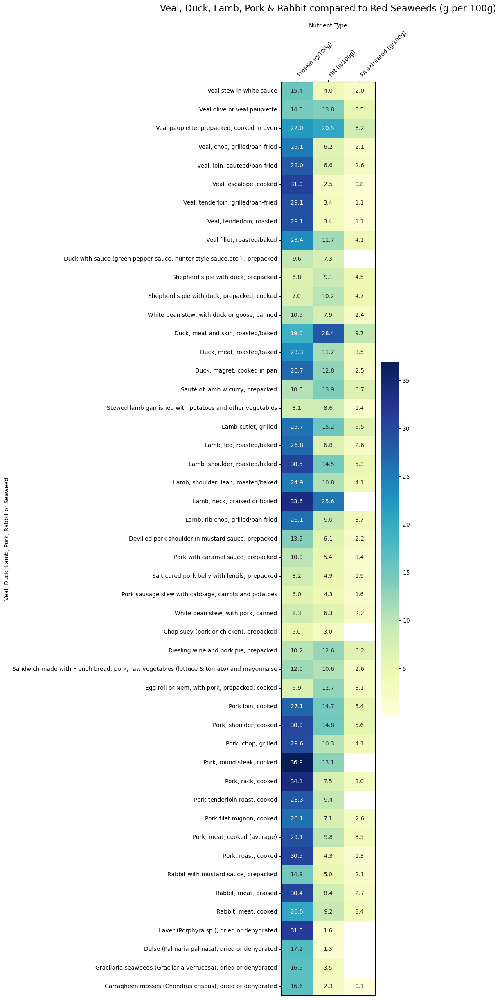

In [515]:
index_list_veal = [71, 77, 86, 1172, 1173, 1174, 1175, 1176, 1177]
index_list_duck = [74, 98, 99, 107, 1242, 1243, 1244]
index_list_lamb = [73, 112, 1210, 1211, 1212, 1213, 1214, 1216]
index_list_pork = [82, 84, 102, 105, 106, 117, 255, 303, 335, 1185, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194]
index_list_rabbit = [75, 1237, 1238]
index_list_red_seaweed = [3104, 3105, 3109, 3112]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_veal_and_company_red_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_veal+index_list_duck+index_list_lamb+index_list_pork+index_list_rabbit+index_list_red_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_veal_and_company_red_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_veal_and_company_red_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Veal, Duck, Lamb, Pork & Rabbit compared to Red Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Veal, Duck, Lamb, Pork, Rabbit or Seaweed')

plt.tight_layout()
plt.show()

# Green Seaweeds


## Beef & Chicken Protein-levels comparison with Green Seaweeds

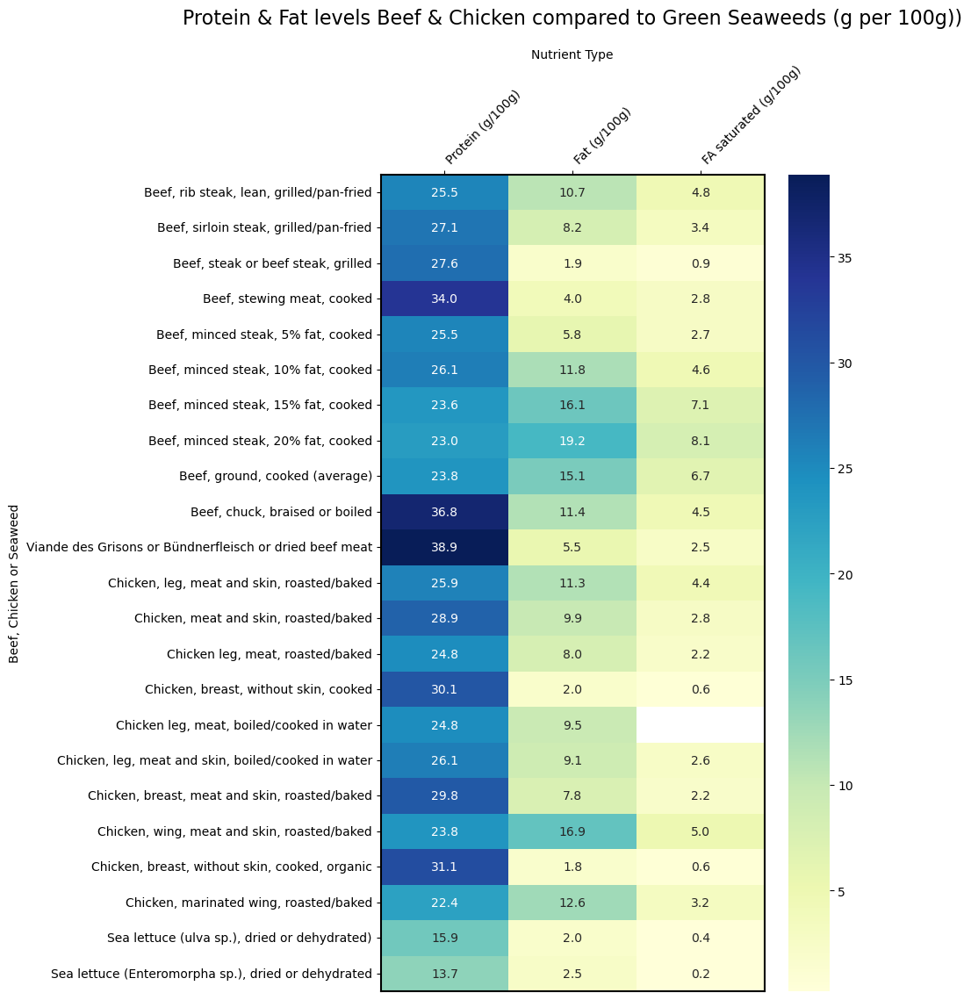

In [516]:
# Define list of indexes
index_list_beef = [1145, 1149, 1156, 1163, 1165, 1166, 1167, 1168, 1169, 1170, 1581]
index_list_chicken = [1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1622]
index_list_green_seaweed = [3102, 3111]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_beef_and_chicken_green_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_beef+index_list_chicken+index_list_green_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_beef_and_chicken_green_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_beef_and_chicken_green_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Beef & Chicken compared to Green Seaweeds (g per 100g))', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Beef, Chicken or Seaweed')

plt.tight_layout()
plt.show()

## Fish & Seafoods Protein-levels comparison with Green Seaweeds


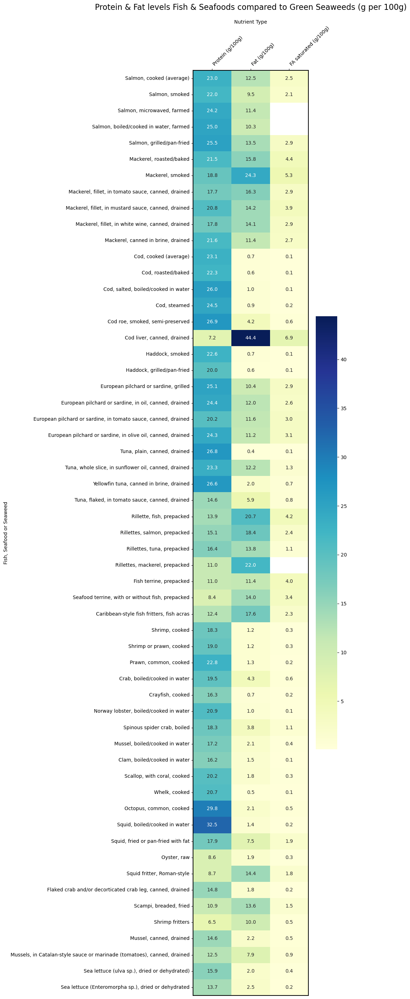

In [517]:

# Define list of indexes for fish foods
index_list_fish_foods = [
    1625, 1645, 1665, 1666, 1668, 1635, 1654, 1879, 1880, 1881, 1883,
    1626, 1639, 1640, 1641, 1877, 1885, 1655, 1659, 1660, 1872, 1873, 1875,
    1874, 1889, 1890, 1895, 1844, 1845, 1846, 1847, 1848, 1849, 1858
]

# Define list of indexes for seafood foods
index_list_seafood_foods = [
    1796, 1797, 1805, 1802, 1804, 1808, 1809, 1799, 1803, 1795, 1800,
    1813, 1806, 1815, 1822, 1851, 1852, 1853, 1854, 1855, 1857
]

index_list_green_seaweed = [3102, 3111]

# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_fish_and_seafoods_green_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_fish_foods+index_list_seafood_foods+index_list_green_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_fish_and_seafoods_green_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_fish_and_seafoods_green_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Protein & Fat levels Fish & Seafoods compared to Green Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Fish, Seafood or Seaweed')

plt.tight_layout()
plt.show()

## Veal, Duck, Lamb, Pork & Rabbit Protein-levels comparison with Green Seaweeds

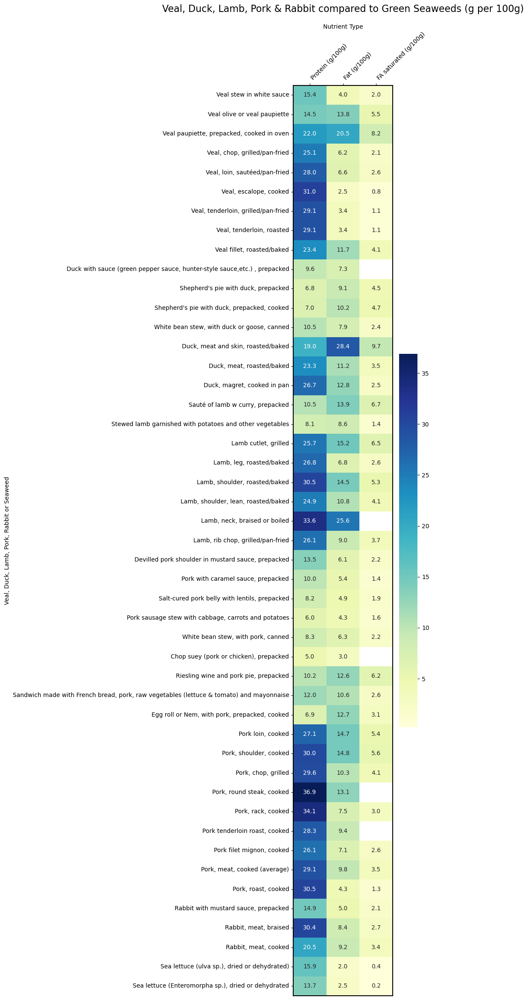

In [518]:
index_list_veal = [71, 77, 86, 1172, 1173, 1174, 1175, 1176, 1177]
index_list_duck = [74, 98, 99, 107, 1242, 1243, 1244]
index_list_lamb = [73, 112, 1210, 1211, 1212, 1213, 1214, 1216]
index_list_pork = [82, 84, 102, 105, 106, 117, 255, 303, 335, 1185, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194]
index_list_rabbit = [75, 1237, 1238]
index_list_green_seaweed = [3102, 3111]


# Select protein and fat columns
protein_fat_cols = ['Protein (g/100g)',
    'Fat (g/100g)', 
    'FA saturated (g/100g)', ]

    
# Set index to seaweed name
heatmap_veal_and_company_green_seaweed_data_proteins_fat = df_ciqual_nutrients_list_intl_cleaned.iloc[index_list_veal+index_list_duck+index_list_lamb+index_list_pork+index_list_rabbit+index_list_green_seaweed].set_index('alim_nom_eng')[protein_fat_cols]

# Plot heatmap
plt.figure(figsize=(10, len(heatmap_veal_and_company_green_seaweed_data_proteins_fat) * 0.5))
ax = sns.heatmap(heatmap_veal_and_company_green_seaweed_data_proteins_fat, annot=True, cmap='YlGnBu', fmt='.1f')

# Move x-axis labels to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Rotate x-axis labels for clarity
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around the heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Titles and labels
plt.title('Veal, Duck, Lamb, Pork & Rabbit compared to Green Seaweeds (g per 100g)', fontsize=16, pad=20)
ax.set_xlabel('Nutrient Type')
ax.set_ylabel('Veal, Duck, Lamb, Pork, Rabbit or Seaweed')

plt.tight_layout()
plt.show()

# New Animal-based protein-rich foods to compare to seaweed

## Visual: Red seaweed, plant-based high protein foods

In [519]:
# Combined representative foods for French nutrient comparison
food_selection = {
    # Beef
    1149: "Beef, sirloin steak, grilled/pan-fried (lean)",
    1156: "Beef steak, grilled (average)",
    1168: "Minced steak, 20% fat, cooked (fatty)",
    1581: "Viande des Grisons (processed/cured)",

    # Chicken
    1201: "Chicken breast, without skin, cooked (lean)",
    1198: "Chicken leg, meat and skin, roasted/baked (fatty cut)",
    1205: "Chicken wing, meat and skin, roasted/baked",
    1206: "Chicken breast, without skin, cooked, organic",

    # Fish & seafood
    1625: "Salmon, cooked (fatty fish, omega-3 rich)",
    1626: "Cod, cooked (lean fish)",
    1654: "Mackerel, smoked (very fatty & high sodium)",
    1872: "Sardine, in oil, canned, drained (calcium rich)",
    1890: "Yellowfin tuna, canned in brine, drained (lean protein)",
    1849: "Seafood terrine, with/without fish, prepacked (mixed seafood)",

    # Other meats (veal, pork, lamb, duck, rabbit)
    71:  "Veal escalope, cooked (lean white meat)",
    73:  "Lamb chop, grilled (higher fat red meat)",
    82:  "Pork chop, grilled (mid-fat red meat)",
    74:  "Duck breast, grilled (high fat poultry)",
    75:  "Rabbit, roasted (very lean)",

    # Eggs
    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
    
}


In [520]:
df_ciqual_nutrients_list_intl_cleaned['seaweed name Eng'] = (
    df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng']
    .str.replace(", dried or dehydrated", "", regex=False)
)

df_ciqual_nutrients_list_intl_cleaned['seaweed name French'] = (
    df_ciqual_nutrients_list_intl_cleaned['alim_nom_fr']
    .str.replace(", séchée ou déshydratée", "", regex=False)
    .str.replace(", séché ou déshydraté", "", regex=False)
)



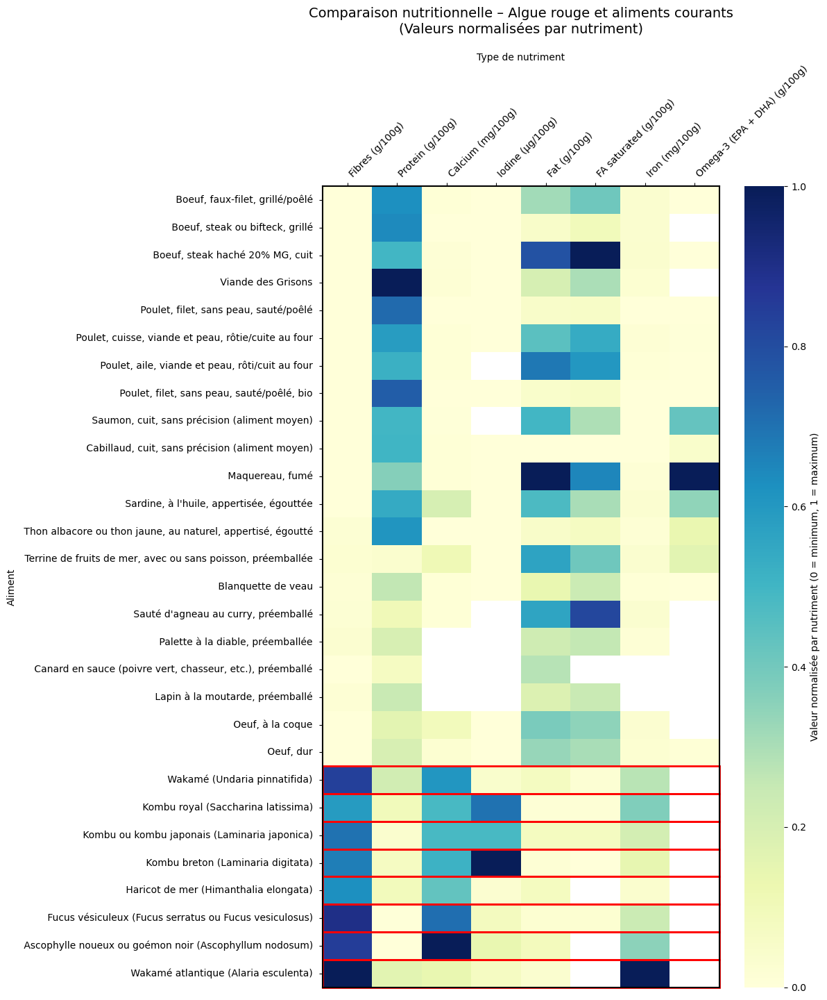

In [521]:
# Representative foods for the report
food_selection = {
    1149: "Boeuf, steak de rumsteck (maigre)",
    1156: "Boeuf, steak (moyen)",
    1168: "Boeuf, steak haché 20% MG (gras)",
    1581: "Viande des Grisons",

    1201: "Poulet, blanc sans peau (maigre)",
    1198: "Poulet, cuisse avec peau (gras)",
    1205: "Poulet, aile avec peau",
    1206: "Poulet, blanc sans peau bio",

    1625: "Saumon, cuit (poisson gras)",
    1626: "Cabillaud, cuit (poisson maigre)",
    1654: "Maquereau, fumé (très gras)",
    1872: "Sardine, à l'huile, boîte",
    1890: "Thon, boîte au naturel",
    1849: "Terrine de la mer",

    71:  "Veau, escalope (maigre)",
    73:  "Agneau, côtelette (gras)",
    82:  "Porc, côte (moyen)",
    74:  "Canard, magret (gras)",
    75:  "Lapin, rôti (très maigre)",

    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
}

# Nutrients for public-friendly comparison
nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Brown seaweeds
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]

# --- Step 1: Prepare data ---

# Combine selected food IDs and brown seaweeds
selected_ids = list(food_selection.keys()) + index_list_brown_seaweed

# Select rows by integer indices
df_plot = df_ciqual_nutrients_list_intl_cleaned.iloc[selected_ids]

# Keep original alim_nom_eng as index
df_plot = df_plot.set_index('seaweed name French')

# Keep only the nutrients we want
df_plot = df_plot[nutrients_list_step1]

# Normalize per nutrient
df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())

# --- Plot ---
plt.figure(figsize=(12, len(df_norm) * 0.5))
ax = sns.heatmap(df_norm, annot=False, cmap='YlGnBu', cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'})

# X-axis labels on top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Highlight seaweeds without renaming
for y, idx in enumerate(selected_ids):
    if idx in index_list_brown_seaweed:
        ax.add_patch(plt.Rectangle((0, y), len(df_norm.columns), 1, fill=False, edgecolor='red', lw=2, clip_on=False))

# Titles
plt.title('Comparaison nutritionnelle – Algue rouge et aliments courants\n(Valeurs normalisées par nutriment)', fontsize=14, pad=20)
ax.set_xlabel('Type de nutriment')
ax.set_ylabel('Aliment')

plt.tight_layout()
plt.show()


### old stuff

In [522]:
df_ciqual_nutrients_list_intl_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3186 entries, 0 to 3185
Data columns (total 83 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       3186 non-null   int64  
 1   alim_ssgrp_code                                     3186 non-null   int64  
 2   alim_ssssgrp_code                                   3186 non-null   int64  
 3   alim_grp_nom_eng                                    3141 non-null   object 
 4   alim_ssgrp_nom_eng                                  3141 non-null   object 
 5   alim_ssssgrp_nom_eng                                3141 non-null   object 
 6   alim_code                                           3186 non-null   Int64  
 7   alim_nom_eng                                        3186 non-null   object 
 8   alim_nom_sci                                        270 non-null    object 
 9

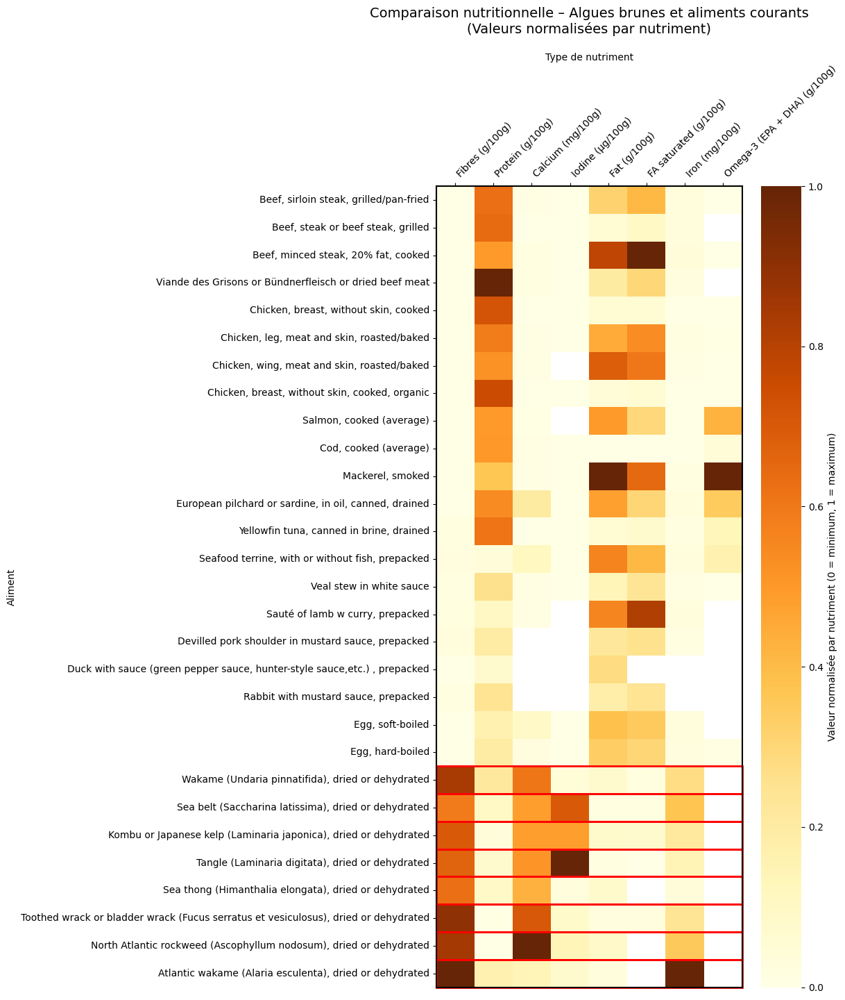

In [523]:

# --- Step 0: Configuration ---

# Representative foods for the report
food_selection = {
    1149: "Boeuf, steak de rumsteck (maigre)",
    1156: "Boeuf, steak (moyen)",
    1168: "Boeuf, steak haché 20% MG (gras)",
    1581: "Viande des Grisons",
    1201: "Poulet, blanc sans peau (maigre)",
    1198: "Poulet, cuisse avec peau (gras)",
    1205: "Poulet, aile avec peau",
    1206: "Poulet, blanc sans peau bio",
    1625: "Saumon, cuit (poisson gras)",
    1626: "Cabillaud, cuit (poisson maigre)",
    1654: "Maquereau, fumé (très gras)",
    1872: "Sardine, à l'huile, boîte",
    1890: "Thon, boîte au naturel",
    1849: "Terrine de la mer",
    71:  "Veau, escalope (maigre)",
    73:  "Agneau, côtelette (gras)",
    82:  "Porc, côte (moyen)",
    74:  "Canard, magret (gras)",
    75:  "Lapin, rôti (très maigre)",
    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
}

# Nutrients for comparison
nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Brown seaweeds (row IDs in your dataset)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]

# --- Step 1: Prepare data ---
selected_ids = list(food_selection.keys()) + index_list_brown_seaweed

# Use loc to select rows by actual ID (index) and nutrients + original name column
df_plot = df_ciqual_nutrients_list_intl_cleaned.loc[selected_ids, nutrients_list_step1 + ['alim_nom_eng']]

# Set original food names as index
df_plot = df_plot.set_index('alim_nom_eng')

# Normalize nutrient values per column
df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())

# --- Step 2: Plot ---
plt.figure(figsize=(12, len(df_norm) * 0.5))
ax = sns.heatmap(
    df_norm,
    annot=False,
    cmap='YlOrBr',  # Brown-toned colormap
    cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
)

# Move x-axis labels to top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Bold outline for seaweed rows
for y, idx in enumerate(selected_ids):
    if idx in index_list_brown_seaweed:
        ax.add_patch(plt.Rectangle((0, y), len(df_norm.columns), 1, fill=False, edgecolor='red', lw=2, clip_on=False))

# Titles
plt.title('Comparaison nutritionnelle – Algues brunes et aliments courants\n(Valeurs normalisées par nutriment)', fontsize=14, pad=20)
ax.set_xlabel('Type de nutriment')
ax.set_ylabel('Aliment')

plt.tight_layout()
plt.show()


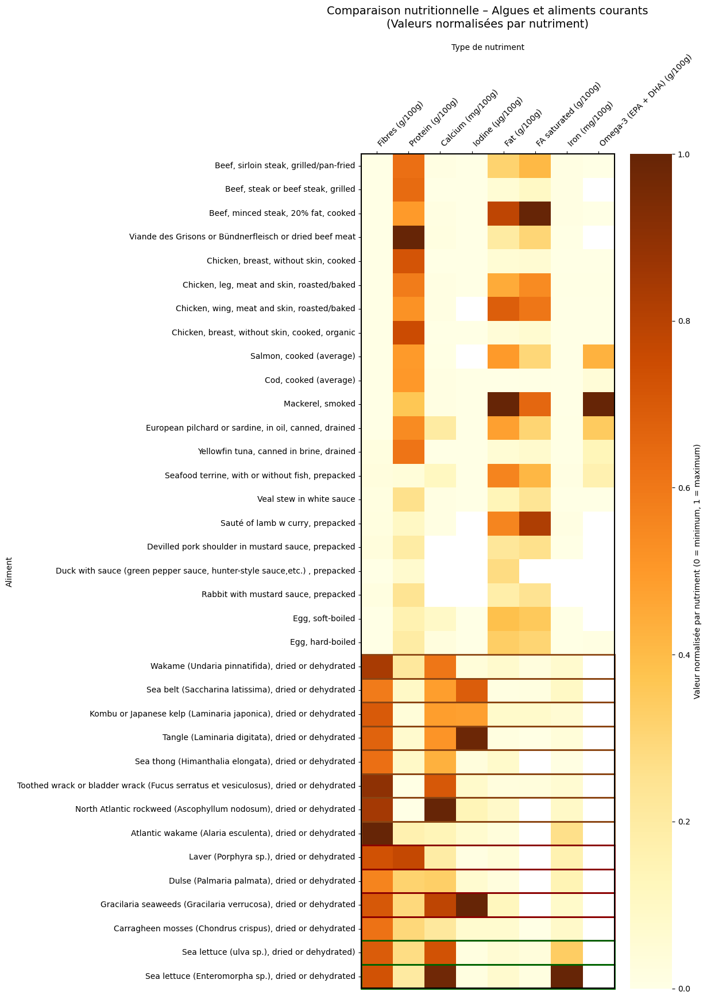

In [524]:

# --- Step 0: Configuration ---

# Representative foods
food_selection = {
    1149: "Boeuf, steak de rumsteck (maigre)",
    1156: "Boeuf, steak (moyen)",
    1168: "Boeuf, steak haché 20% MG (gras)",
    1581: "Viande des Grisons",
    1201: "Poulet, blanc sans peau (maigre)",
    1198: "Poulet, cuisse avec peau (gras)",
    1205: "Poulet, aile avec peau",
    1206: "Poulet, blanc sans peau bio",
    1625: "Saumon, cuit (poisson gras)",
    1626: "Cabillaud, cuit (poisson maigre)",
    1654: "Maquereau, fumé (très gras)",
    1872: "Sardine, à l'huile, boîte",
    1890: "Thon, boîte au naturel",
    1849: "Terrine de la mer",
    71:  "Veau, escalope (maigre)",
    73:  "Agneau, côtelette (gras)",
    82:  "Porc, côte (moyen)",
    74:  "Canard, magret (gras)",
    75:  "Lapin, rôti (très maigre)",
    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
}

# Nutrients for comparison
nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Step 1: Prepare data ---
selected_ids = list(food_selection.keys()) + index_list_brown_seaweed + index_list_red_seaweed + index_list_green_seaweed

# Use loc to select rows by actual ID
df_plot = df_ciqual_nutrients_list_intl_cleaned.loc[selected_ids, nutrients_list_step1 + ['alim_nom_eng']]

# Set original food names as index
df_plot = df_plot.set_index('alim_nom_eng')

# Normalize nutrient values per column
df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())

# --- Step 2: Plot ---
plt.figure(figsize=(12, len(df_norm) * 0.5))
ax = sns.heatmap(
    df_norm,
    annot=False,
    cmap='YlOrBr',  # brown-toned colormap
    cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
)

# Move x-axis labels to top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)

# Add border around heatmap
for _, spine in ax.spines.items():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_color('black')

# Bold outlines for seaweed rows by type
for y, idx in enumerate(selected_ids):
    if idx in index_list_brown_seaweed:
        ax.add_patch(plt.Rectangle((0, y), len(df_norm.columns), 1, fill=False, edgecolor='saddlebrown', lw=2, clip_on=False))
    elif idx in index_list_red_seaweed:
        ax.add_patch(plt.Rectangle((0, y), len(df_norm.columns), 1, fill=False, edgecolor='darkred', lw=2, clip_on=False))
    elif idx in index_list_green_seaweed:
        ax.add_patch(plt.Rectangle((0, y), len(df_norm.columns), 1, fill=False, edgecolor='darkgreen', lw=2, clip_on=False))

# Titles
plt.title('Comparaison nutritionnelle – Algues et aliments courants\n(Valeurs normalisées par nutriment)', fontsize=14, pad=20)
ax.set_xlabel('Type de nutriment')
ax.set_ylabel('Aliment')

plt.tight_layout()
plt.show()


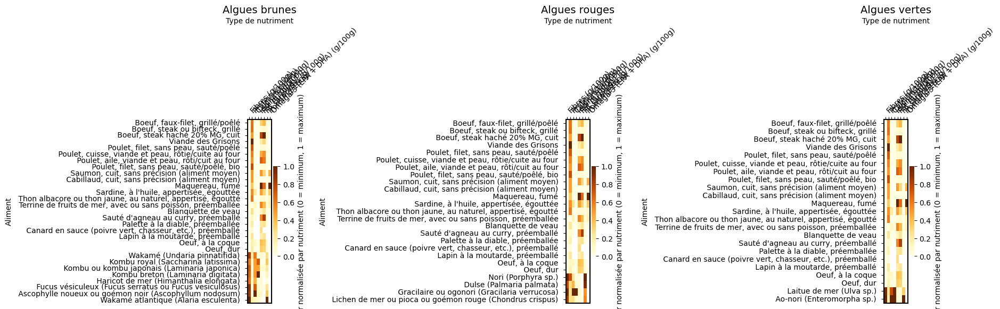

In [525]:


# --- Step 0: Configuration ---
food_selection = {
    1149: "Boeuf, steak de rumsteck (maigre)",
    1156: "Boeuf, steak (moyen)",
    1168: "Boeuf, steak haché 20% MG (gras)",
    1581: "Viande des Grisons",
    1201: "Poulet, blanc sans peau (maigre)",
    1198: "Poulet, cuisse avec peau (gras)",
    1205: "Poulet, aile avec peau",
    1206: "Poulet, blanc sans peau bio",
    1625: "Saumon, cuit (poisson gras)",
    1626: "Cabillaud, cuit (poisson maigre)",
    1654: "Maquereau, fumé (très gras)",
    1872: "Sardine, à l'huile, boîte",
    1890: "Thon, boîte au naturel",
    1849: "Terrine de la mer",
    71:  "Veau, escalope (maigre)",
    73:  "Agneau, côtelette (gras)",
    82:  "Porc, côte (moyen)",
    74:  "Canard, magret (gras)",
    75:  "Lapin, rôti (très maigre)",
    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
}

nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Helper function to prepare and normalize data ---
def prepare_seaweed_plot(seaweed_ids, df, foods_dict):
    selected_ids = list(foods_dict.keys()) + seaweed_ids
    df_plot = df.loc[selected_ids, nutrients_list_step1 + ['seaweed name French']].copy()
    df_plot = df_plot.set_index('seaweed name French')
    df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
    return df_norm

# --- Step 1: Prepare normalized dataframes for each seaweed type ---
df_brown = prepare_seaweed_plot(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection)
df_red = prepare_seaweed_plot(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection)
df_green = prepare_seaweed_plot(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection)

# --- Step 2: Plot side-by-side heatmaps with independent y-axes ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))  # remove sharey

seaweed_data = [
    (df_brown, "Algues brunes", "saddlebrown"),
    (df_red, "Algues rouges", "darkred"),
    (df_green, "Algues vertes", "darkgreen")
]

for ax, (df_norm, title, border_color) in zip(axes, seaweed_data):
    sns.heatmap(
        df_norm,
        annot=False,
        cmap='YlOrBr',
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'},
        ax=ax
    )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Type de nutriment')
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    
    # Optional: rotate y-axis labels if needed
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

plt.tight_layout()
plt.show()


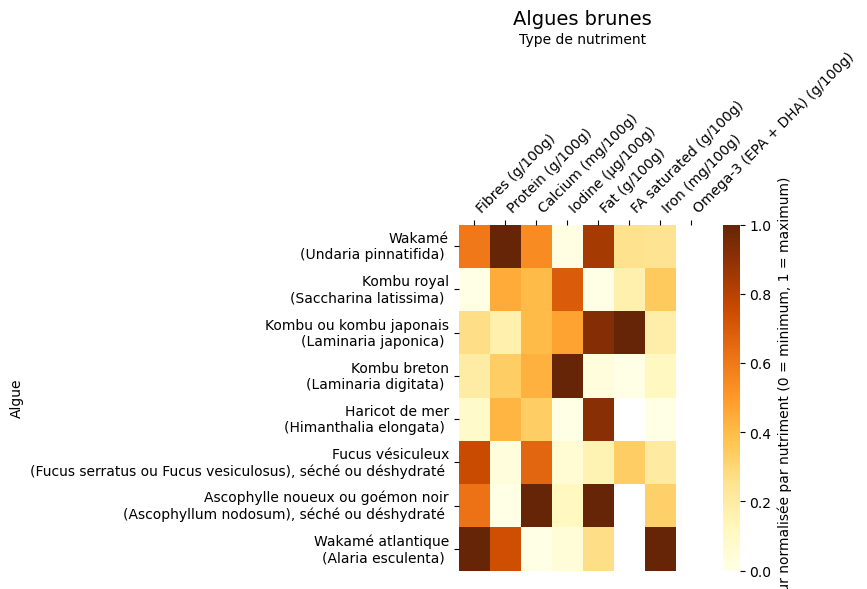

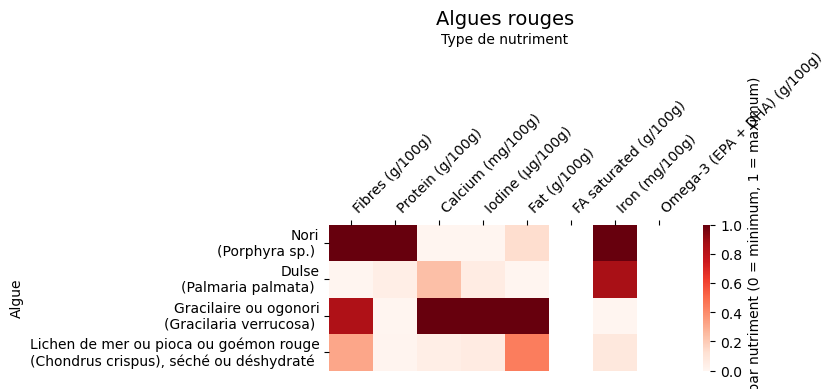

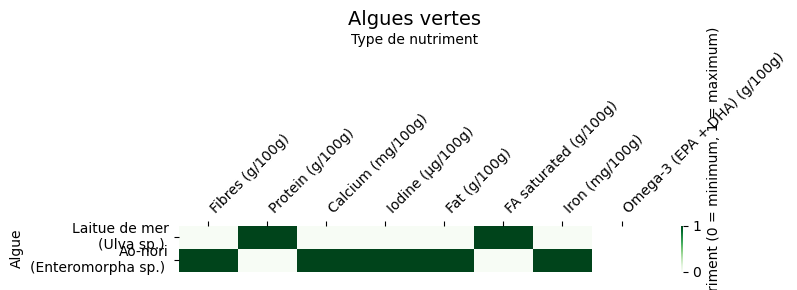

In [526]:
# --- Helper to clean and wrap seaweed names ---
def clean_seaweed_names(df):
    def clean_name(name):
        # Remove ", séchée ou déshydratée"
        name = name.replace(", séchée ou déshydratée", "")
        # Wrap scientific name in parentheses onto new line
        if "(" in name and ")" in name:
            parts = name.split("(")
            name = parts[0].strip() + "\n(" + "(".join(parts[1:])
        return name
    df = df.copy()
    df['alim_nom_fr'] = df['alim_nom_fr'].apply(clean_name)
    df = df.set_index('alim_nom_fr')
    return df

import matplotlib.pyplot as plt
import seaborn as sns

# --- Function to prepare and plot a single seaweed type ---
def plot_seaweed_heatmap(seaweed_ids, df, nutrients_list, title, cmap_color):
    # Select seaweeds
    df_plot = df.loc[seaweed_ids, nutrients_list + ['alim_nom_fr']].copy()
    df_plot = clean_seaweed_names(df_plot)
    df_norm = (df_plot[nutrients_list] - df_plot[nutrients_list].min()) / \
              (df_plot[nutrients_list].max() - df_plot[nutrients_list].min())
    
    # Plot
    plt.figure(figsize=(8, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Type de nutriment')
    ax.set_ylabel('Algue')
    
    # Move x-axis labels to the top
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)
    
    plt.tight_layout()
    plt.show()


# --- Plot each seaweed type ---
plot_seaweed_heatmap(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, nutrients_list_step1, "Algues brunes", "YlOrBr")
plot_seaweed_heatmap(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, nutrients_list_step1, "Algues rouges", "Reds")
plot_seaweed_heatmap(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, nutrients_list_step1, "Algues vertes", "Greens")

In [527]:
# --- Step 0: Configuration ---
food_selection_animal_protein = {
    1149: "Boeuf, steak de rumsteck (maigre)",
    1156: "Boeuf, steak (moyen)",
    1169: "Boeuf, steak haché, cuit (aliment moyen)",
    1581: "Viande des Grisons",
    1201: "Poulet, blanc sans peau (maigre)",
    1198: "Poulet, cuisse avec peau (gras)",
    1205: "Poulet, aile avec peau",
    1206: "Poulet, blanc sans peau bio",
    1625: "Saumon, cuit (poisson gras)",
    1626: "Cabillaud, cuit (poisson maigre)",
    1654: "Maquereau, fumé (très gras)",
    1872: "Sardine, à l'huile, boîte",
    1890: "Thon, boîte au naturel",
    1849: "Terrine de la mer",
    71:  "Veau, escalope (maigre)",
    73:  "Agneau, côtelette (gras)",
    82:  "Porc, côte (moyen)",
    74:  "Canard, magret (gras)",
    75:  "Lapin, rôti (très maigre)",
    1903: "Egg, soft-boiled",
    1901: "Egg, hard-boiled"
}

nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Helper function to prepare and normalize data ---
def prepare_seaweed_plot(seaweed_ids, df, foods_dict):
    selected_ids = list(foods_dict.keys()) + seaweed_ids
    df_plot = df.loc[selected_ids, nutrients_list_step1 + ['seaweed name French']].copy()
    df_plot = df_plot.set_index('seaweed name French')
    df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
    return df_norm

# --- Step 1: Prepare normalized dataframes for each seaweed type ---
df_brown = prepare_seaweed_plot(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_animal_protein)
df_red = prepare_seaweed_plot(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_animal_protein)
df_green = prepare_seaweed_plot(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_animal_protein)


## Visuals: Animal-based High protein Foods

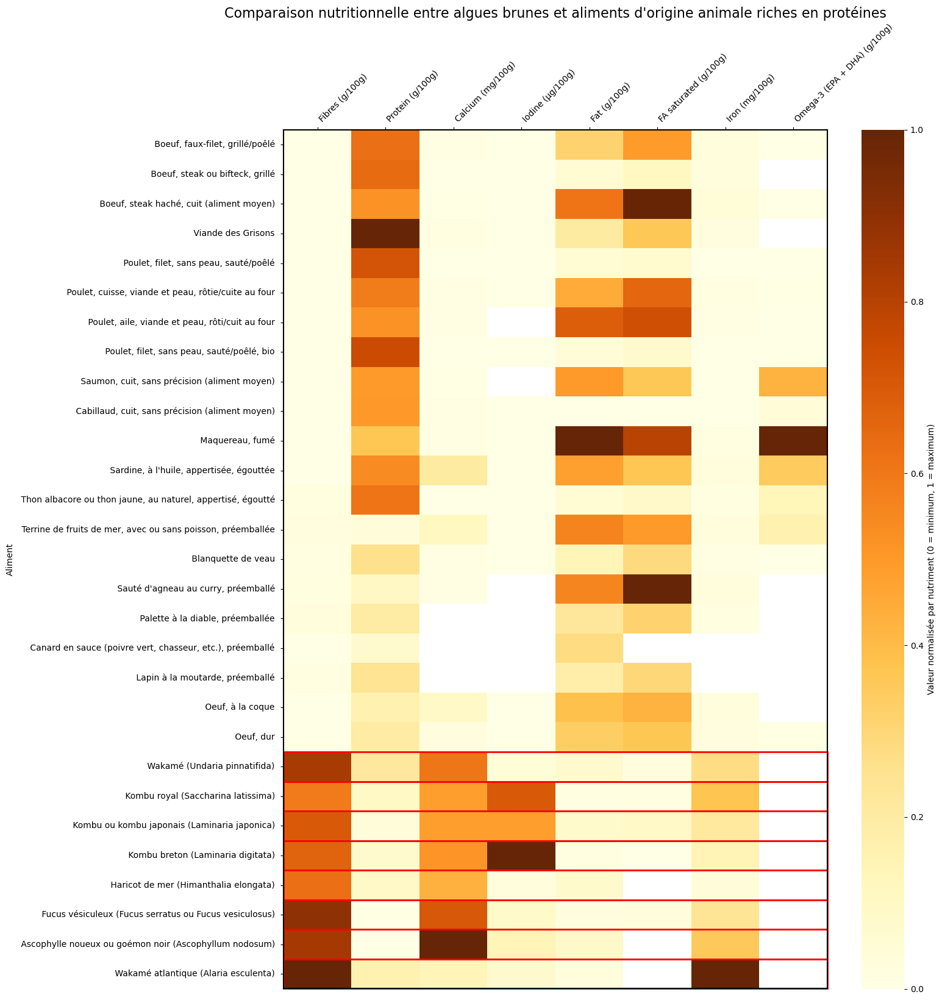

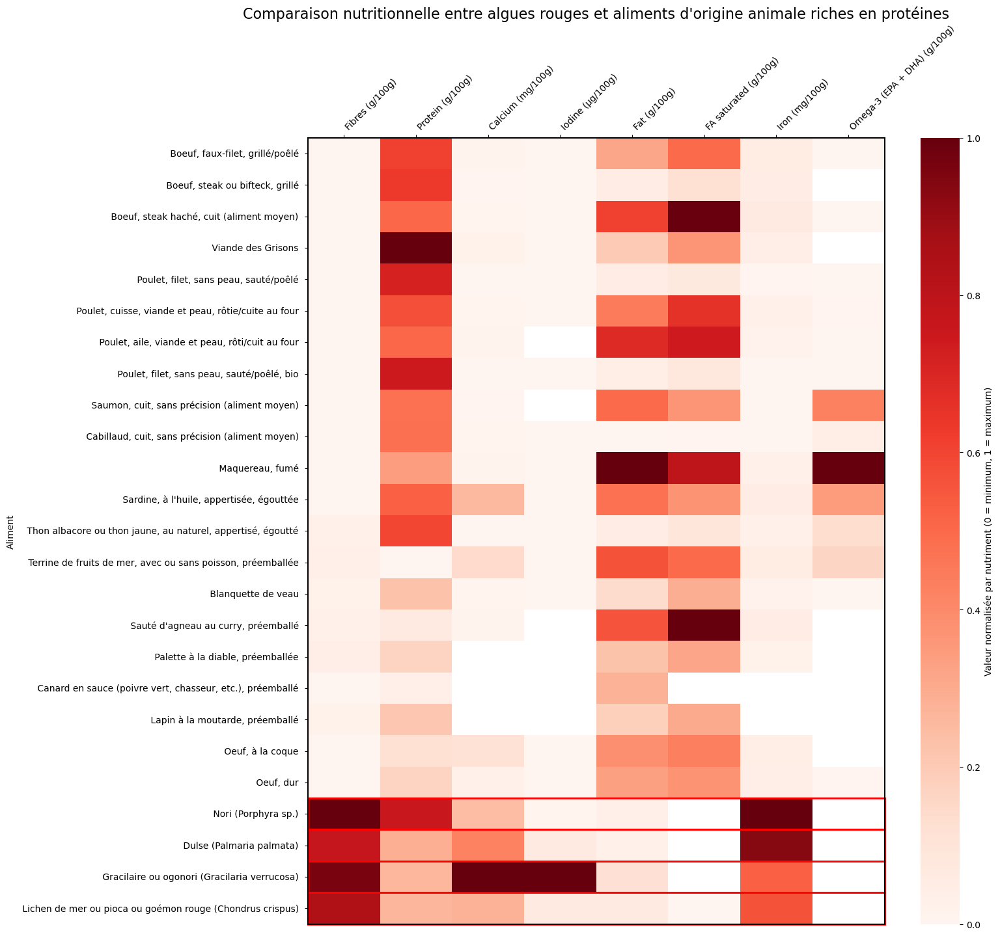

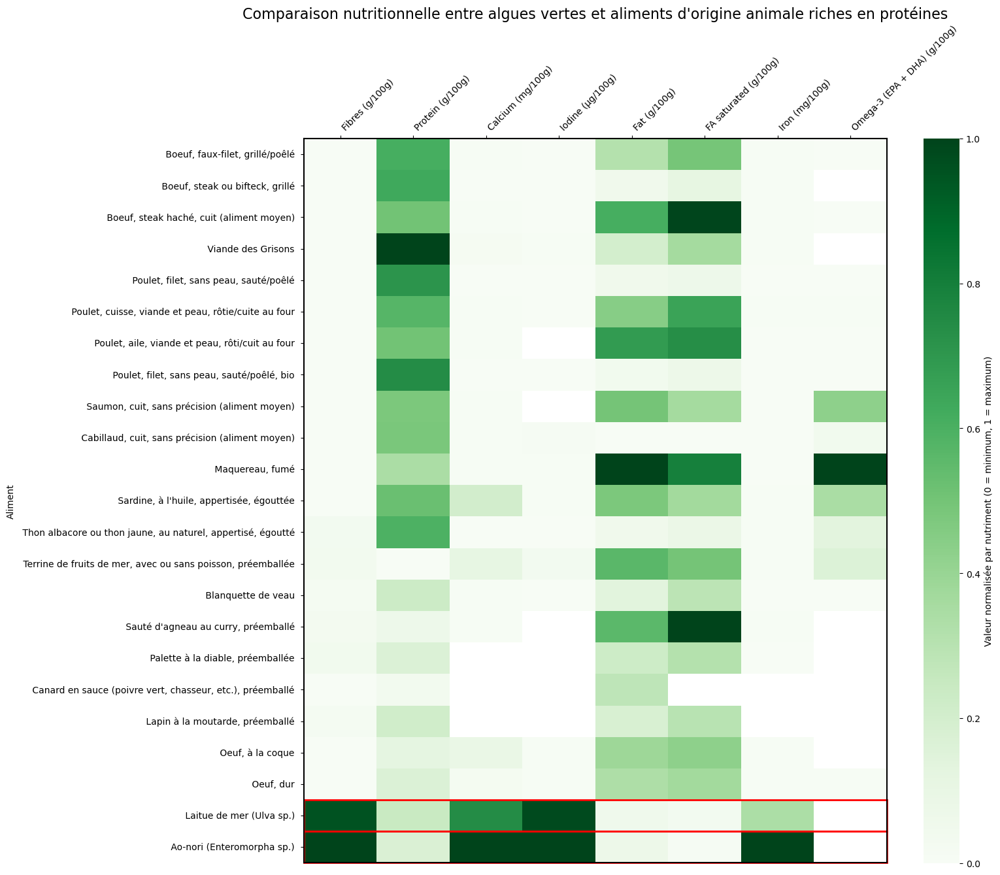

In [528]:
def plot_single_heatmap(df_norm, title, seaweed_names, cmap_color='YlOrBr'):
    plt.figure(figsize=(16, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)


    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Highlight only seaweed rows
    for y, label in enumerate(df_norm.index):
        if label in seaweed_names:
            ax.add_patch(plt.Rectangle(
                (0, y), len(df_norm.columns), 1,
                fill=False, edgecolor='red', lw=2, clip_on=False
            ))

    plt.tight_layout()
    plt.show()

# Extract seaweed names from df_norm using known seaweed IDs
seaweed_names_brown = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_brown_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown, "Comparaison nutritionnelle entre algues brunes et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_brown, cmap_color="YlOrBr")

seaweed_names_red = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_red_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_red, "Comparaison nutritionnelle entre algues rouges et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_red, cmap_color="Reds")

seaweed_names_green = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_green_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_green, "Comparaison nutritionnelle entre algues vertes et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_green, cmap_color="Greens")


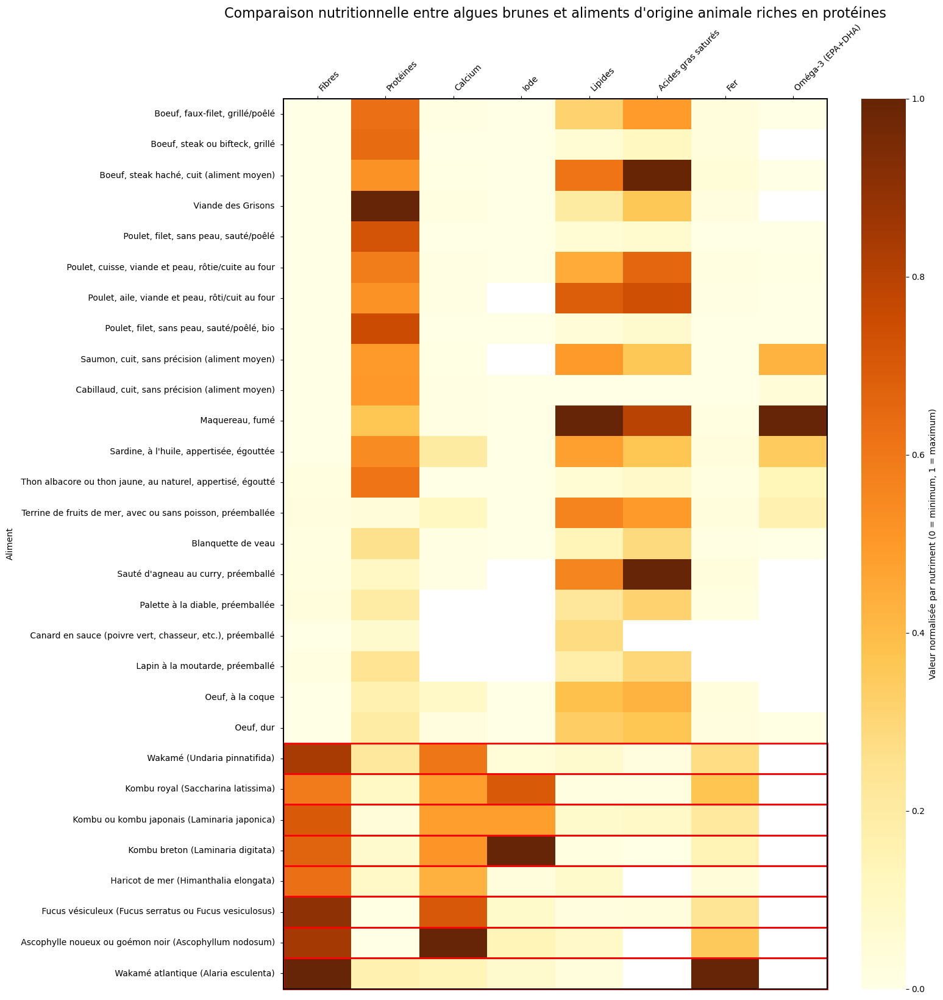

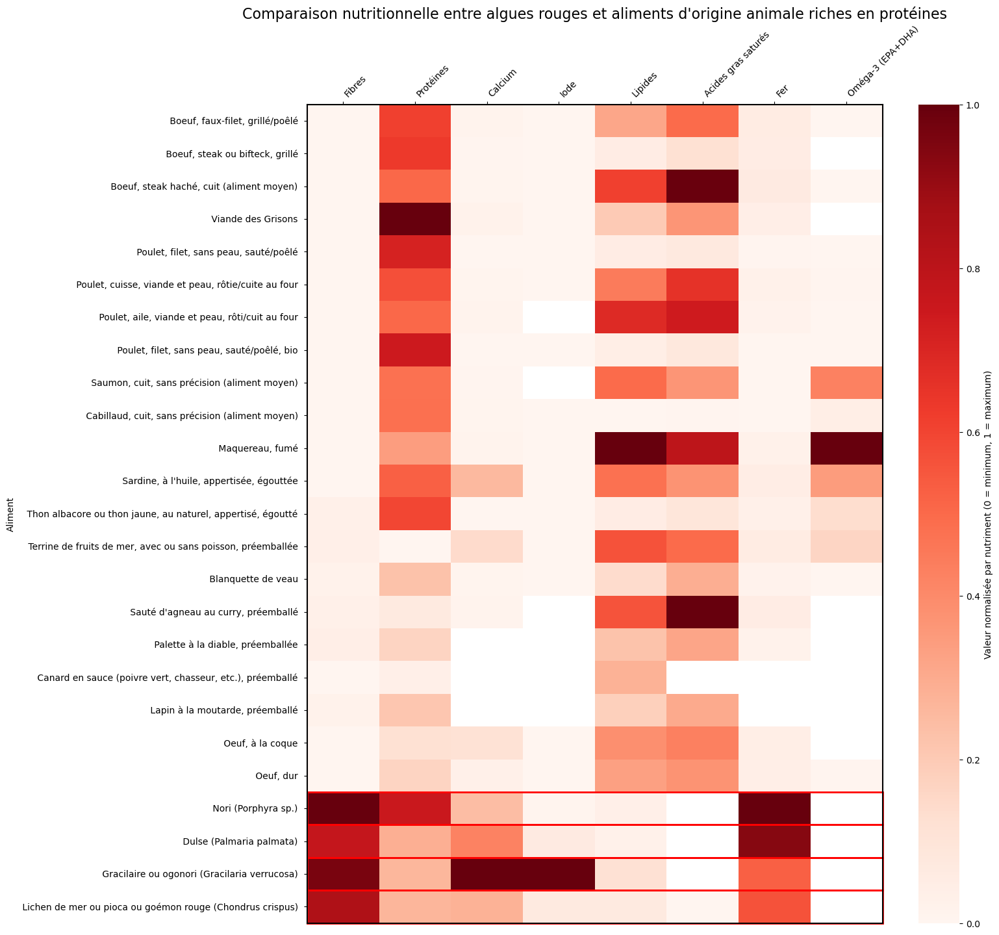

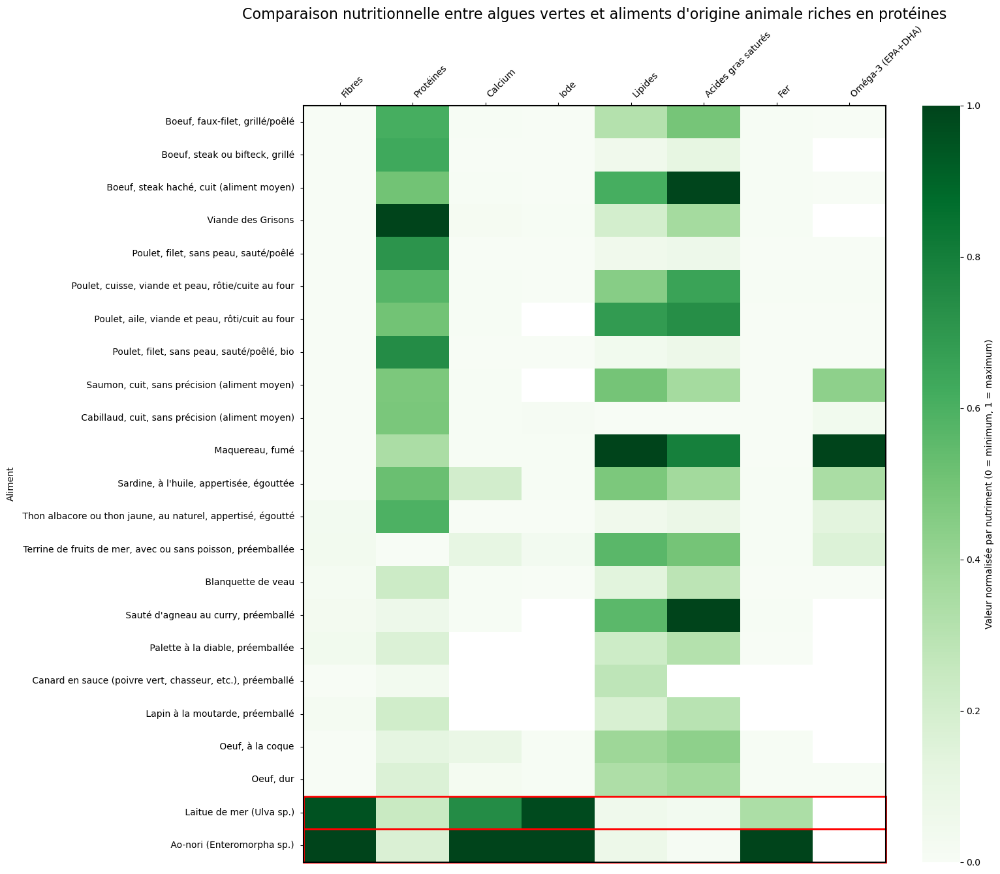

In [529]:
# Define your nutrient label mapping
nutrient_label_map = {
    "Fibres (g/100g)": "Fibres",
    "Protein (g/100g)": "Protéines",
    "Calcium (mg/100g)": "Calcium",
    "Iodine (µg/100g)": "Iode",
    "Fat (g/100g)": "Lipides",
    "FA saturated (g/100g)": "Acides gras saturés",
    "Iron (mg/100g)": "Fer",
    "Omega-3 (EPA + DHA) (g/100g)": "Oméga-3 (EPA+DHA)"
}

def plot_single_heatmap(df_norm, title, seaweed_names, cmap_color='YlOrBr'):
    # Rename columns using the dictionary
    df_norm = df_norm.rename(columns=nutrient_label_map)

    plt.figure(figsize=(16, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Highlight only seaweed rows
    for y, label in enumerate(df_norm.index):
        if label in seaweed_names:
            ax.add_patch(plt.Rectangle(
                (0, y), len(df_norm.columns), 1,
                fill=False, edgecolor='red', lw=2, clip_on=False
            ))

    plt.tight_layout()
    plt.show()

# Extract seaweed names from df_norm using known seaweed IDs
seaweed_names_brown = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_brown_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown, "Comparaison nutritionnelle entre algues brunes et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_brown, cmap_color="YlOrBr")

seaweed_names_red = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_red_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_red, "Comparaison nutritionnelle entre algues rouges et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_red, cmap_color="Reds")

seaweed_names_green = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_green_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_green, "Comparaison nutritionnelle entre algues vertes et aliments d'origine animale riches en protéines", seaweed_names=seaweed_names_green, cmap_color="Greens")


# Plant-based Protein Sources

## Identify plant-based foods high in protein

In [530]:
df_plant_proteins_almond = df_ciqual_nutrients_list_intl_cleaned.loc[
    df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('almond|edamame|quinoa|tempeh|seitan|hemp|soy', case=False, na=False) &
    (df_ciqual_nutrients_list_intl_cleaned['Protein (g/100g)'] > 5 ) 
]

df_plant_proteins_almond[['alim_ssssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr', 'Protein (g/100g)', 'seaweed name French']]

,alim_ssssgrp_nom_eng,alim_nom_eng,alim_nom_fr,Protein (g/100g),seaweed name French
207,vegetarian dishes,Soy burger or vegetable escalope,Escalope végétale ou steak à base de soja,15.50,Escalope végétale ou steak à base de soja
208,vegetarian dishes,Tempeh,Tempeh,16.10,Tempeh
209,vegetarian dishes,Wheat-based nuggets (wo soybean),"Nuggets de blé (sans soja), préemballé",12.60,"Nuggets de blé (sans soja), préemballé"
210,vegetarian dishes,Soybean and wheat-based nuggets (not vegan),"Nuggets soja et blé (ne convient pas aux véganes ou végétaliens), préemballé",14.10,"Nuggets soja et blé (ne convient pas aux véganes ou végétaliens), préemballé"
211,vegetarian dishes,Soybean and wheat-based nuggets (vegan),"Nuggets soja et blé (convient aux véganes ou végétaliens), préemballé",15.50,"Nuggets soja et blé (convient aux véganes ou végétaliens), préemballé"
212,vegetarian dishes,"Schnitzel, soybean and wheat-based (not vegan)",Pané soja et blé (ne convient pas aux véganes ou végétaliens),14.40,Pané soja et blé (ne convient pas aux véganes ou végétaliens)
213,vegetarian dishes,"Schnitzel, soybean and wheat-based (vegan)","Bâtonnet pané soja et blé (convient aux véganes ou végétaliens), préemballée",16.90,"Bâtonnet pané soja et blé (convient aux véganes ou végétaliens), préemballée"
214,vegetarian dishes,"Schnitzel, soybean, wheat and cheese-based, cordon bleu-style","Escalope panée, soja, blé et fromage, type cordon bleu, préemballée",15.20,"Escalope panée, soja, blé et fromage, type cordon bleu, préemballée"
216,vegetarian dishes,Cereal burger with cheese (without soybean),"Galette de céréales au fromage (sans soja), préemballé",7.00,"Galette de céréales au fromage (sans soja), préemballé"
217,vegetarian dishes,Cereal burger with végétables (without soybean),"Galette de céréales aux légumes (sans soja), préemballé",5.31,"Galette de céréales aux légumes (sans soja), préemballé"


In [531]:
df_plant_proteins = df_ciqual_nutrients_list_intl_cleaned.loc[
    df_ciqual_nutrients_list_intl_cleaned['alim_grp_nom_eng'].str.contains(r'\b(breads|cereal|legumes|nuts)\b', case=False, na=False) &
    (df_ciqual_nutrients_list_intl_cleaned['Protein (g/100g)'] > 10 ) 
]

df_plant_proteins.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98 entries, 599 to 1095
Data columns (total 83 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   alim_grp_code                                       98 non-null     int64  
 1   alim_ssgrp_code                                     98 non-null     int64  
 2   alim_ssssgrp_code                                   98 non-null     int64  
 3   alim_grp_nom_eng                                    98 non-null     object 
 4   alim_ssgrp_nom_eng                                  98 non-null     object 
 5   alim_ssssgrp_nom_eng                                98 non-null     object 
 6   alim_code                                           98 non-null     Int64  
 7   alim_nom_eng                                        98 non-null     object 
 8   alim_nom_sci                                        0 non-null      object 
 9   En

/var/folders/kl/2y01c7y51cj42bdww37cvc5c0000gn/T/ipykernel_76244/4083198263.py:2: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



In [532]:
df_plant_proteins[['alim_ssssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr', 'Protein (g/100g)', 'seaweed name French']]

,alim_ssssgrp_nom_eng,alim_nom_eng,alim_nom_fr,Protein (g/100g),seaweed name French
599,"vegetables, dried or dehydrated","Tomato, dried","Tomate, séchée",14.2,"Tomate, séchée"
636,vegetables from Martinique and their products,"Pigeon pea, whole, steamed","Pois d'angole, entier, cuit à la vapeur, prélevé à la Martinique",16.3,"Pois d'angole, entier, cuit à la vapeur, prélevé à la Martinique"
651,-,"Potato flakes, dehydrated, with milk or cream","Pomme de terre, flocons déshydratés, au lait ou à la crème",10.6,"Pomme de terre, flocons déshydratés, au lait ou à la crème"
709,"legumes, cooked","Lentil, green, boiled/cooked in water","Lentille verte, bouillie/cuite à l'eau",10.1,"Lentille verte, bouillie/cuite à l'eau"
711,"legumes, cooked","Lentil, pink or red, boiled/cooked in water","Lentille corail, bouillie/cuite à l'eau",10.6,"Lentille corail, bouillie/cuite à l'eau"
715,"legumes, raw","lupin grain, raw","Lupin, graine crue",36.2,"Lupin, graine crue"
718,"legumes, raw","Broad bean, peeled, frozen, raw","Fève, pelée, surgelée, crue",14.9,"Fève, pelée, surgelée, crue"
719,"legumes, dried","Haricot bean, dry","Haricot blanc, sec",19.1,"Haricot blanc, sec"
720,"legumes, dried","Lentil, dried","Lentille, sèche",25.4,"Lentille, sèche"
721,"legumes, dried","Split pea, dried","Pois cassé, sec",22.8,"Pois cassé, sec"


In [533]:
df_plant_proteins_5_10 = df_ciqual_nutrients_list_intl_cleaned.loc[
    df_ciqual_nutrients_list_intl_cleaned['alim_grp_nom_eng'].str.contains(r'\b(breads|cereal|legumes|nuts)\b', case=False, na=False) &
    (df_ciqual_nutrients_list_intl_cleaned['Protein (g/100g)'] > 5 ) & (df_ciqual_nutrients_list_intl_cleaned['Protein (g/100g)'] < 10 ) 
]

df_plant_proteins_5_10[['alim_ssssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr', 'Protein (g/100g)', 'seaweed name French']]

/var/folders/kl/2y01c7y51cj42bdww37cvc5c0000gn/T/ipykernel_76244/2161948136.py:2: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



,alim_ssssgrp_nom_eng,alim_nom_eng,alim_nom_fr,Protein (g/100g),seaweed name French
372,"vegetables, raw","Garden peas, raw","Petits pois, crus",5.84,"Petits pois, crus"
376,"vegetables, raw","Garden peas, frozen, raw","Petits pois, surgelés, crus",5.86,"Petits pois, surgelés, crus"
387,"vegetables, raw","Black truffle, raw","Champignon, truffe noire, crue",5.77,"Champignon, truffe noire, crue"
394,"vegetables, raw","Lima bean, raw","Haricot de Lima, cru",6.84,"Haricot de Lima, cru"
482,"vegetables, cooked","Garden peas, canned, drained","Petits pois, appertisés, égouttés",5.12,"Petits pois, appertisés, égouttés"
483,"vegetables, cooked","Garden peas, cooked","Petits pois, cuits",5.80,"Petits pois, cuits"
513,"vegetables, cooked","Garden peas, frozen, cooked","Petits pois, surgelés, cuits",5.15,"Petits pois, surgelés, cuits"
582,"vegetables, cooked","Garden peas, boiled/cooked in water","Petits pois, bouillis/cuits à l'eau",6.38,"Petits pois, bouillis/cuits à l'eau"
597,"vegetables, dried or dehydrated","Carrot, dehydrated","Carotte, déshydratée",8.10,"Carotte, déshydratée"
598,"vegetables, dried or dehydrated","Onion, dried","Oignon, séché",8.95,"Oignon, séché"


## Visual: Plant-based protein-rich foods compared to seaweeds

In [534]:
food_selection_plant_long = {
    636: "Pigeon pea, whole, steamed",
    709: "Lentil, green, boiled/cooked in water",
    710:  "Lentil, blond, boiled/cooked in water",
    711:  "Lentil, pink or red, boiled/cooked in water",
    944: "Peanut, grilled, non-salted",
    927: "Hazelnut, grilled",
    905: "Walnut, dried, husked",
    908: "Brazil nut",
    936: "Pistachio nut, grilled",
    945: "Cashew nut, grilled, unsalted",
    915:  "Mix of salted grains/nuts and raisins",
    934:  "Almond, grilled, salted", # there is no unsalted version available
    939:  "Seeds, chia, dried",
    943:  "Flaxseed, brown",
    948:  "Peanut butter or peanut paste",
    949:  "Tahini (sesame paste)",
    951:  "Soybean, whole grain",
    975:  "Lens based pasta, gluten-free, boiled",
    1060: "Rusk, multigrain",
    1061: "Rusk, wholemeal or rich in fibre",
    694:  "Haricot bean, boiled/cooked in water",
    695:  "Red kidney bean, boiled/cooked in water",
    702:  "Flageolet bean, boiled/cooked in water",
    697:  "Split pea, boiled/cooked in water",
    698:  "Chick pea, boiled/cooked in water",
    702:  "Flageolet bean, boiled/cooked in water",
    208:  "Tempeh",
    220:  "Plant-based burger or steak from wheat (seitan) and vegetables",
    1608:  "Plant-based sausage with wheat or seitan",
    2725:  "Breakfast cereals, wheat flakes with walnuts, hazelnuts or almonds, fortified with vitamins and chemical elements",
    2733:  "Muesli, crunchy, with quinoa",
    207:   "Soy burger or vegetable escalope",
    209:  "Wheat-based nuggets (wo soybean)",
    211:  "Soybean and wheat-based nuggets (vegan)",
    219:  "Plant-based burger or steak from lentil, soybean and vegetables",
    221:  "Plant-based burger or steak from wheat and soybean (vegan)",
    226:  "Soy-based minced",

}

In [535]:
food_selection_plant_protein = {
    # Legumes
    636: "Pigeon pea, whole, steamed",
    709: "Lentil, green, boiled/cooked in water",
    710:  "Lentil, blond, boiled/cooked in water",
    711:  "Lentil, pink or red, boiled/cooked in water",
    694:  "Haricot bean, boiled/cooked in water",
    695:  "Red kidney bean, boiled/cooked in water",
    702:  "Flageolet bean, boiled/cooked in water",
    697:  "Split pea, boiled/cooked in water",
    698:  "Chick pea, boiled/cooked in water",
    951:  "Soybean, whole grain",

    # Nuts & seeds
    944: "Peanut, grilled, unsalted",
    904: "Hazelnut",
    905: "Walnut, dried, husked",
    908: "Brazil nut",
    939: "Pistachio nut, grilled",
    945: "Cashew nut, grilled, unsalted",
    934: "Almond, grilled, salted",
    943: "Flaxseed, brown",
    939: "Seeds, chia, dried",

    # Nut/seed paste
    948: "Peanut butter or peanut paste",  # or swap for 949 tahini
    949:  "Tahini (sesame paste)",

    # Plant-based meat substitutes
    208: "Tempeh",
    220: "Plant-based burger or steak from wheat (seitan) and vegetables",
    219: "Plant-based burger or steak from lentil, soybean and vegetables",

}



In [536]:
nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Helper function to prepare and normalize data ---
def prepare_seaweed_plot(seaweed_ids, df, foods_dict):
    selected_ids = list(foods_dict.keys()) + seaweed_ids
    df_plot = df.loc[selected_ids, nutrients_list_step1 + ['seaweed name French']].copy()
    df_plot = df_plot.set_index('seaweed name French')
    df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
    return df_norm

# --- Step 1: Prepare normalized dataframes for each seaweed type ---
df_brown_plant = prepare_seaweed_plot(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_protein)
df_red_plant = prepare_seaweed_plot(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_protein)
df_green_plant = prepare_seaweed_plot(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_protein)


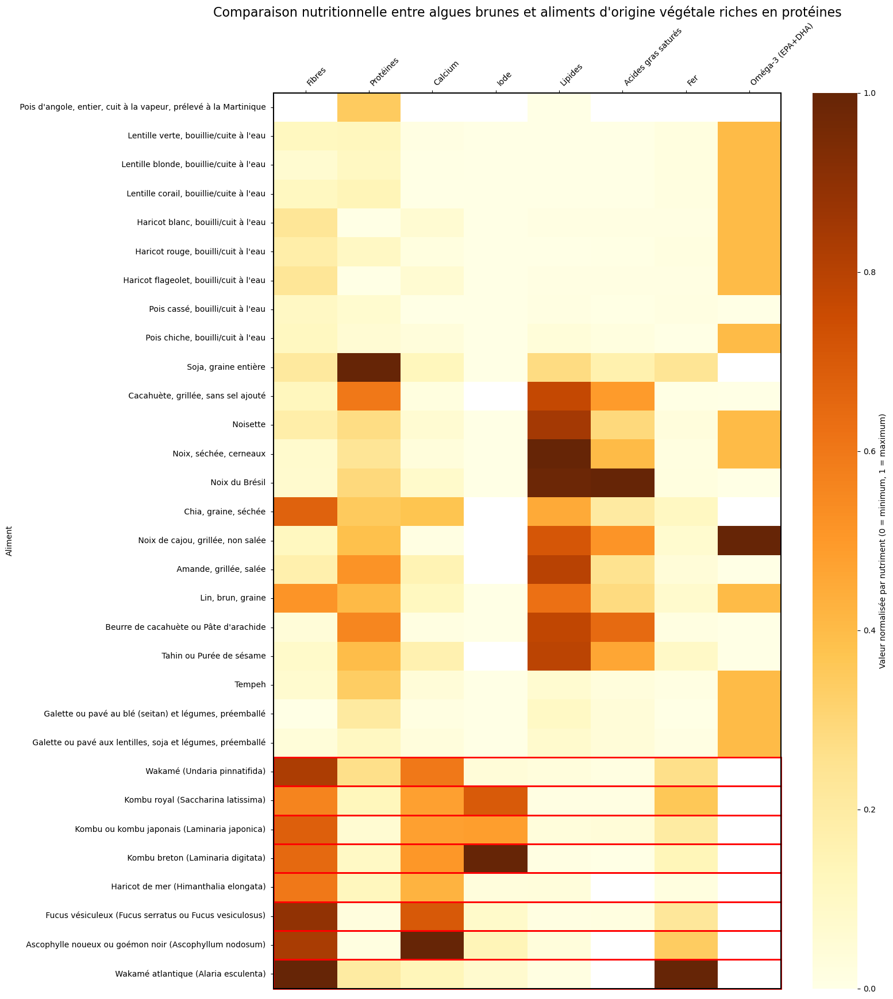

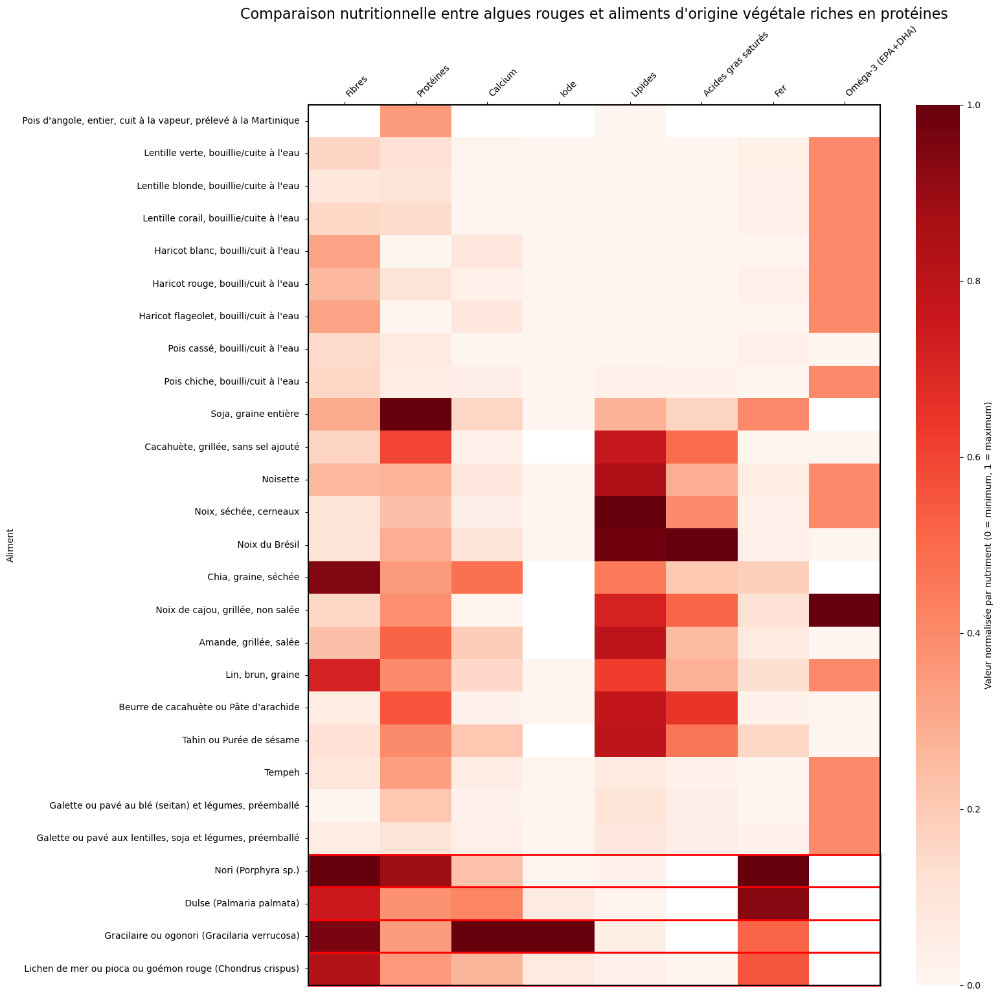

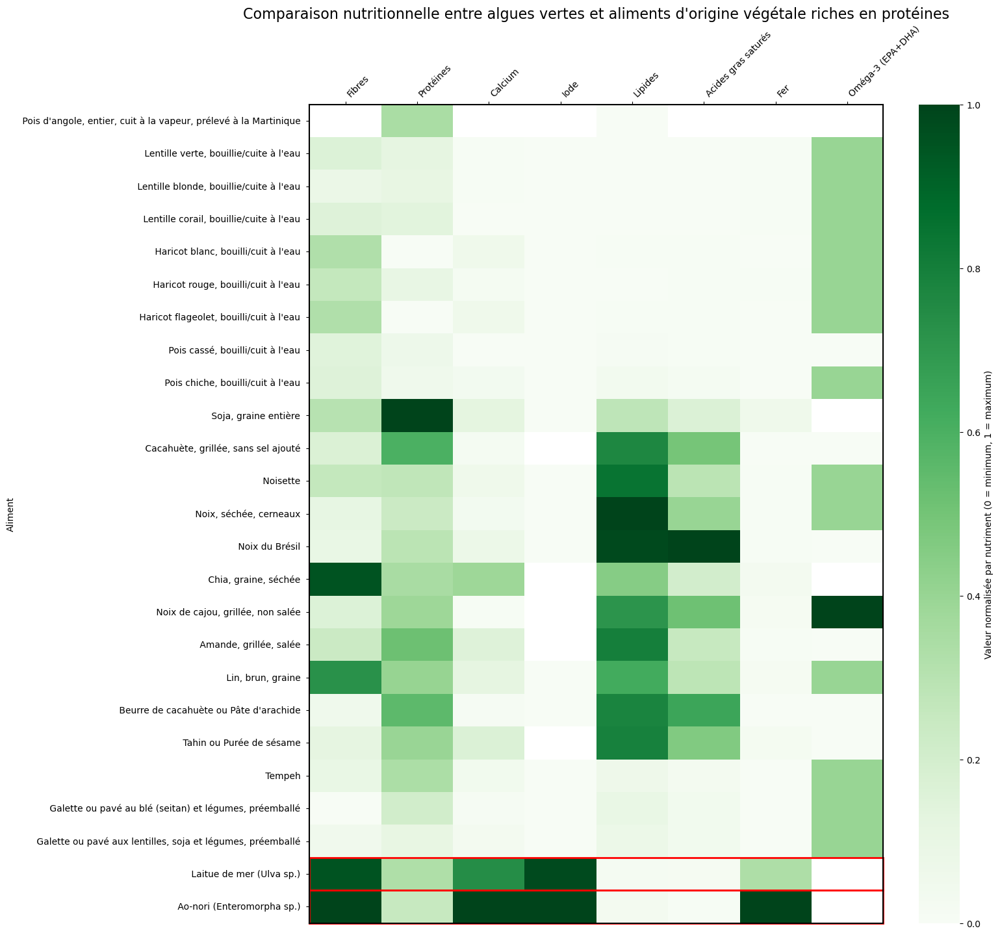

In [537]:
# Define nutrient label mapping
nutrient_label_map = {
    "Fibres (g/100g)": "Fibres",
    "Protein (g/100g)": "Protéines",
    "Calcium (mg/100g)": "Calcium",
    "Iodine (µg/100g)": "Iode",
    "Fat (g/100g)": "Lipides",
    "FA saturated (g/100g)": "Acides gras saturés",
    "Iron (mg/100g)": "Fer",
    "Omega-3 (EPA + DHA) (g/100g)": "Oméga-3 (EPA+DHA)"
}

def plot_single_heatmap(df_norm, title, seaweed_names, cmap_color='YlOrBr'):
    # Rename columns using the dictionary
    df_norm = df_norm.rename(columns=nutrient_label_map)

    plt.figure(figsize=(16, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Highlight only seaweed rows
    for y, label in enumerate(df_norm.index):
        if label in seaweed_names:
            ax.add_patch(plt.Rectangle(
                (0, y), len(df_norm.columns), 1,
                fill=False, edgecolor='red', lw=2, clip_on=False
            ))

    plt.tight_layout()
    plt.show()

# Extract seaweed names from df_norm using known seaweed IDs
seaweed_names_brown = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_brown_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown_plant, "Comparaison nutritionnelle entre algues brunes et aliments d'origine végétale riches en protéines", seaweed_names=seaweed_names_brown, cmap_color="YlOrBr")

seaweed_names_red = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_red_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_red_plant, "Comparaison nutritionnelle entre algues rouges et aliments d'origine végétale riches en protéines", seaweed_names=seaweed_names_red, cmap_color="Reds")

seaweed_names_green = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_green_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_green_plant, "Comparaison nutritionnelle entre algues vertes et aliments d'origine végétale riches en protéines", seaweed_names=seaweed_names_green, cmap_color="Greens")


# Plant-based high fibre foods

## Identify plant-based high fibre foods

In [538]:
df_plant_fibre = df_ciqual_nutrients_list_intl_cleaned.loc[
    df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains('oat|bulgur|whole|broccoli|brussel|artichoke|carrots|fig|apricot|pear|rasberr', case=False, na=False)]

df_plant_fibre[['alim_ssssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr', 'Protein (g/100g)', 'Fibres (g/100g)', 'seaweed name French']]

,alim_ssssgrp_nom_eng,alim_nom_eng,alim_nom_fr,Protein (g/100g),Fibres (g/100g),seaweed name French
13,-,"Salad, veggie, bulgur and/or quinoa-based, with vegetables, prepacked","Salade végétale à base de boulgour et/ou quinoa et légumes, préemballée",3.790,3.300,"Salade végétale à base de boulgour et/ou quinoa et légumes, préemballée"
14,-,"Grated carrots, w sauce, prepacked","Carottes râpées, avec sauce, préemballées",0.980,3.640,"Carottes râpées, avec sauce, préemballées"
32,-,"Soup, carrots, prepacked, to be reheated","Soupe à la carotte, préemballée à réchauffer",0.610,1.220,"Soupe à la carotte, préemballée à réchauffer"
104,"meat dishes, with vegetables/legume",Beef stew with carrots,Boeuf aux carottes,13.200,1.100,Boeuf aux carottes
105,"meat dishes, with vegetables/legume","Pork sausage stew with cabbage, carrots and potatoes",Potée auvergnate (chou et porc),6.000,2.300,Potée auvergnate (chou et porc)
168,pasta or cereal dishes,"Durum wheat pre-cooked, whole grain, cooked, to pan-fry","Blé dur précuit, grains entiers, cuisiné, à poêler",11.100,6.280,"Blé dur précuit, grains entiers, cuisiné, à poêler"
198,pasta or cereal dishes,"Lasagna or cannelloni with vegetables and goat cheese, prepacked, cooked","Lasagnes ou cannellonis aux légumes et au fromage de chèvre, préemballés, cuits",7.000,1.400,"Lasagnes ou cannellonis aux légumes et au fromage de chèvre, préemballés, cuits"
199,pasta or cereal dishes,"Lasagna or cannelloni with goat cheese and spinach, prepacked","Lasagnes ou cannellonis au fromage et aux épinards, préemballés",6.100,1.870,"Lasagnes ou cannellonis au fromage et aux épinards, préemballés"
201,cheese dishes,"Goat cheese, breaded, to grill, prepacked","Fromage de chèvre pané à dorer, préemballé",12.900,NaN,"Fromage de chèvre pané à dorer, préemballé"
242,-,"Pizza, goat cheese and lardoons, prepacked","Pizza au chèvre et lardons, préemballée",10.700,2.360,"Pizza au chèvre et lardons, préemballée"


## Visuals: Plant-based high fibre foods

In [539]:
food_selection_plant_fibre = {
    # Vegetables
    461: "Artichoke, globe, cooked",
    494: "Artichoke, canned, drained",
    466: "Broccoli, cooked",
    470: "Brussels sprout, cooked",
    340: "Carrot, raw",

    # Fruits
    845: "Apricot, pitted, dried",
    847: "Fig, dried",

    # Grains & Bread
    1031: "Bread, wholemeal or integral bread (made with flour type 150)",
    1032: "Sandwich loaf, wholemeal",
    1071: "Wheat swedish toast, wholemeal"
}


In [540]:
nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Helper function to prepare and normalize data ---
def prepare_seaweed_plot(seaweed_ids, df, foods_dict):
    selected_ids = list(foods_dict.keys()) + seaweed_ids
    df_plot = df.loc[selected_ids, nutrients_list_step1 + ['seaweed name French']].copy()
    df_plot = df_plot.set_index('seaweed name French')
    df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
    return df_norm

# --- Step 1: Prepare normalized dataframes for each seaweed type ---
df_brown_plant_fibre = prepare_seaweed_plot(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_fibre)
df_red_plant_fibre = prepare_seaweed_plot(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_fibre)
df_green_plant_fibre = prepare_seaweed_plot(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_fibre)


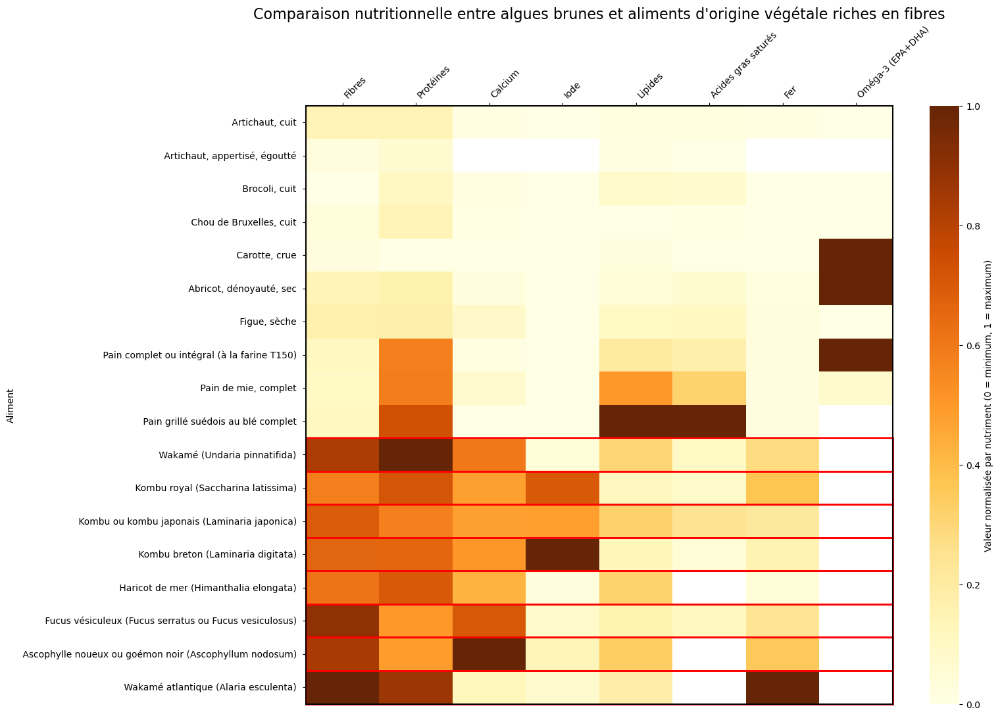

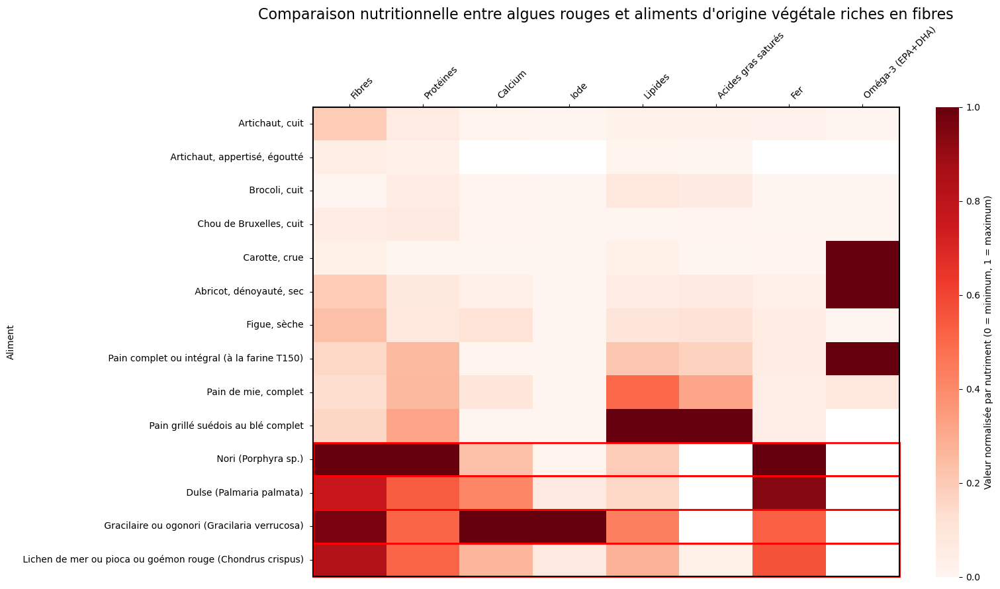

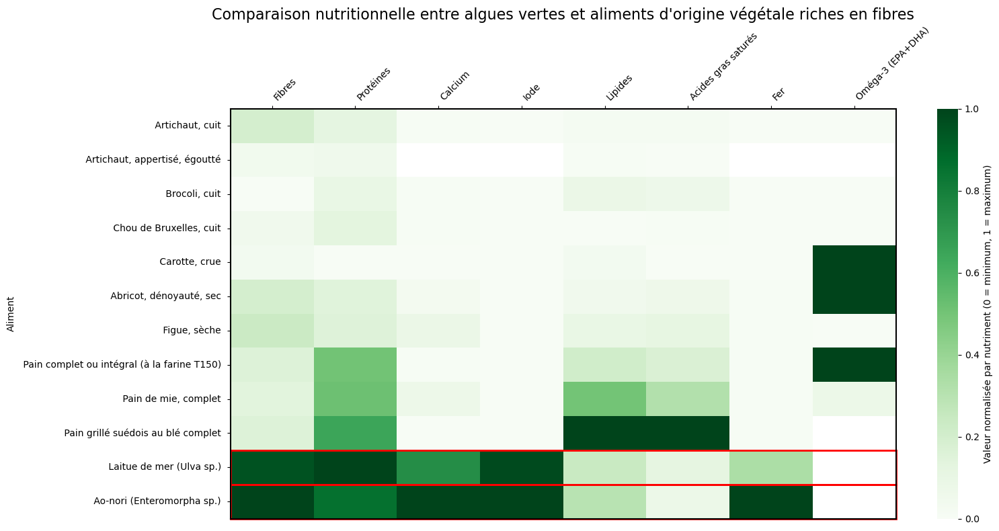

In [541]:
# Define nutrient label mapping
nutrient_label_map = {
    "Fibres (g/100g)": "Fibres",
    "Protein (g/100g)": "Protéines",
    "Calcium (mg/100g)": "Calcium",
    "Iodine (µg/100g)": "Iode",
    "Fat (g/100g)": "Lipides",
    "FA saturated (g/100g)": "Acides gras saturés",
    "Iron (mg/100g)": "Fer",
    "Omega-3 (EPA + DHA) (g/100g)": "Oméga-3 (EPA+DHA)"
}

def plot_single_heatmap(df_norm, title, seaweed_names, cmap_color='YlOrBr'):
    # Rename columns using the dictionary
    df_norm = df_norm.rename(columns=nutrient_label_map)

    plt.figure(figsize=(16, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Highlight only seaweed rows
    for y, label in enumerate(df_norm.index):
        if label in seaweed_names:
            ax.add_patch(plt.Rectangle(
                (0, y), len(df_norm.columns), 1,
                fill=False, edgecolor='red', lw=2, clip_on=False
            ))

    plt.tight_layout()
    plt.show()

# Extract seaweed names from df_norm using known seaweed IDs
seaweed_names_brown = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_brown_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown_plant_fibre, "Comparaison nutritionnelle entre algues brunes et aliments d'origine végétale riches en fibres", seaweed_names=seaweed_names_brown, cmap_color="YlOrBr")

seaweed_names_red = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_red_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_red_plant_fibre, "Comparaison nutritionnelle entre algues rouges et aliments d'origine végétale riches en fibres", seaweed_names=seaweed_names_red, cmap_color="Reds")

seaweed_names_green = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_green_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_green_plant_fibre, "Comparaison nutritionnelle entre algues vertes et aliments d'origine végétale riches en fibres", seaweed_names=seaweed_names_green, cmap_color="Greens")


# Plant-based vitamin & mineral rich foods

## Identify plant-based vitamin & mineral rich foods

In [542]:
df_plant_mineral_vitamin = df_ciqual_nutrients_list_intl_cleaned.loc[
    df_ciqual_nutrients_list_intl_cleaned['alim_nom_eng'].str.contains(
        '|parsley|coriander|cilantro|basil|thyme|oregano|rosemary|mint|sage|dill'
        '|chili|paprika|turmeric|ginger',
        case=False, na=False) & df_ciqual_nutrients_list_intl_cleaned['alim_ssssgrp_nom_eng'].str.contains('herbs',
        case=False, na=False)
] 
df_plant_mineral_vitamin[['alim_ssssgrp_nom_eng', 'alim_ssgrp_nom_eng', 'alim_nom_eng', 'alim_nom_fr', 'Iodine (µg/100g)', "Calcium (mg/100g)", "Magnesium (mg/100g)", "Zinc (mg/100g)", 'seaweed name French']]

,alim_ssssgrp_nom_eng,alim_ssgrp_nom_eng,alim_nom_eng,alim_nom_fr,Iodine (µg/100g),Calcium (mg/100g),Magnesium (mg/100g),Zinc (mg/100g),seaweed name French
3070,fresh herbs,herbs,"Garlic, fresh","Ail, cru",15.00,11.0,20.0,0.75,"Ail, cru"
3071,fresh herbs,herbs,"Chervil, fresh","Cerfeuil, frais",2.80,273.0,34.0,1.10,"Cerfeuil, frais"
3072,fresh herbs,herbs,"Chive or spring onion, fresh","Ciboule ou Ciboulette, fraîche",2.20,92.8,23.8,0.45,"Ciboule ou Ciboulette, fraîche"
3073,fresh herbs,herbs,"Parsley, fresh","Persil, frais",3.75,218.0,39.5,0.77,"Persil, frais"
3074,fresh herbs,herbs,"Horseradish, fresh","Raifort, cru",0.90,93.7,25.0,1.40,"Raifort, cru"
3075,fresh herbs,herbs,"Mint, fresh","Menthe, fraîche",NaN,221.0,71.5,1.10,"Menthe, fraîche"
3076,fresh herbs,herbs,"Basil, fresh","Basilic, frais",NaN,273.0,64.0,0.81,"Basilic, frais"
3077,fresh herbs,herbs,"Rosemary, fresh","Romarin, frais",NaN,317.0,91.0,0.93,"Romarin, frais"
3078,fresh herbs,herbs,"Sage, fresh","Sauge, fraîche",15.00,230.0,54.0,0.28,"Sauge, fraîche"
3079,fresh herbs,herbs,"Thyme, fresh","Thym, frais",NaN,405.0,160.0,1.81,"Thym, frais"


# Visuals: plant-based vitamin & mineral rich foods

In [543]:
food_selection_plant_minerals_vitamins = {
    3073: "Parsley, fresh",
    3087: "Parsley, dried",
    3083: "Coriander, fresh",
    3076: "Basil, fresh",
    3089: "Basil, dried",
    3068: "Turmeric, powder",
    3054: "Paprika",
    3094: "Thyme, fresh",
    3091: "Oregano, dried",
    3077: "Rosemary, fresh",
    3075: "Mint, fresh",
    3088: "Mint, dried",
    3078: "Sage, fresh",
    3093: "Sage, dried",
    3082: "Dill, fresh",
    3063: "Ginger, raw",
    3046: "Ginger, powder",
}


In [544]:
food_selection_plant_fibre = {
    # Vegetables
    461: "Artichoke, globe, cooked",
    494: "Artichoke, canned, drained",
    466: "Broccoli, cooked",
    470: "Brussels sprout, cooked",
    340: "Carrot, raw",

    # Fruits
    845: "Apricot, pitted, dried",
    847: "Fig, dried",

    # Grains & Bread
    1031: "Bread, wholemeal or integral bread (made with flour type 150)",
    1032: "Sandwich loaf, wholemeal",
    1071: "Wheat swedish toast, wholemeal"
}



nutrients_list_step1 = [
    "Fibres (g/100g)",
    "Protein (g/100g)",
    "Calcium (mg/100g)",
    "Iodine (µg/100g)",
    "Fat (g/100g)",
    "FA saturated (g/100g)",
    "Iron (mg/100g)",
    "Omega-3 (EPA + DHA) (g/100g)"
]

# Seaweed groups (row IDs)
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]

# --- Helper function to prepare and normalize data ---
def prepare_seaweed_plot(seaweed_ids, df, foods_dict):
    selected_ids = list(foods_dict.keys()) + seaweed_ids
    df_plot = df.loc[selected_ids, nutrients_list_step1 + ['seaweed name French']].copy()
    df_plot = df_plot.set_index('seaweed name French')
    df_norm = (df_plot - df_plot.min()) / (df_plot.max() - df_plot.min())
    return df_norm

# --- Step 1: Prepare normalized dataframes for each seaweed type ---
df_brown_plant_minerals_vitamins = prepare_seaweed_plot(index_list_brown_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_minerals_vitamins)
df_red_plant_minerals_vitamins = prepare_seaweed_plot(index_list_red_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_minerals_vitamins)
df_green_plant_minerals_vitamin = prepare_seaweed_plot(index_list_green_seaweed, df_ciqual_nutrients_list_intl_cleaned, food_selection_plant_minerals_vitamins)


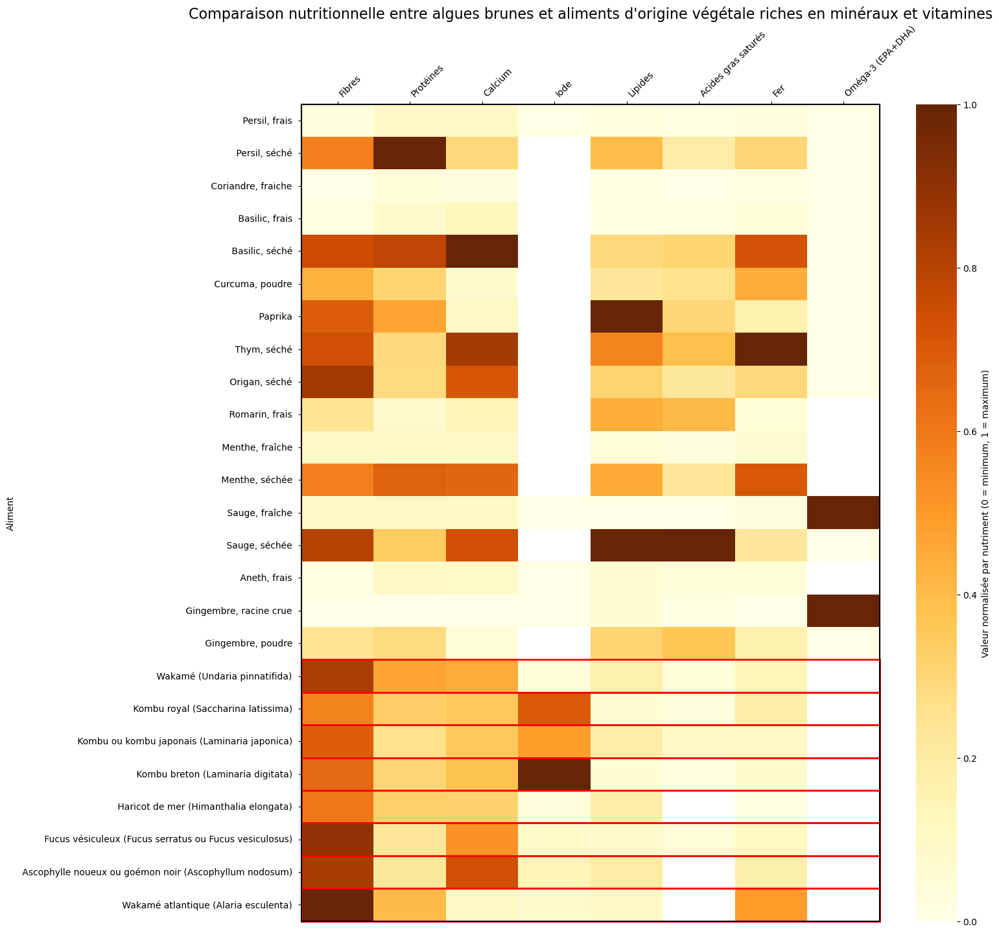

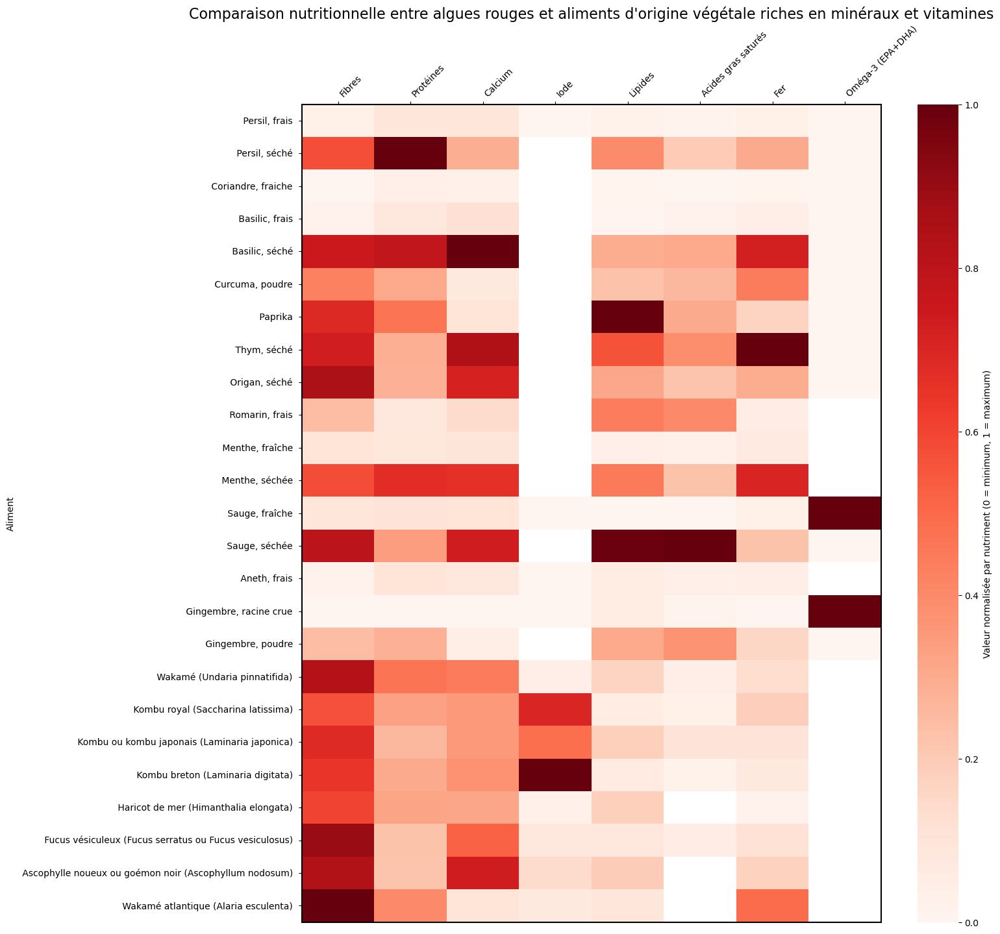

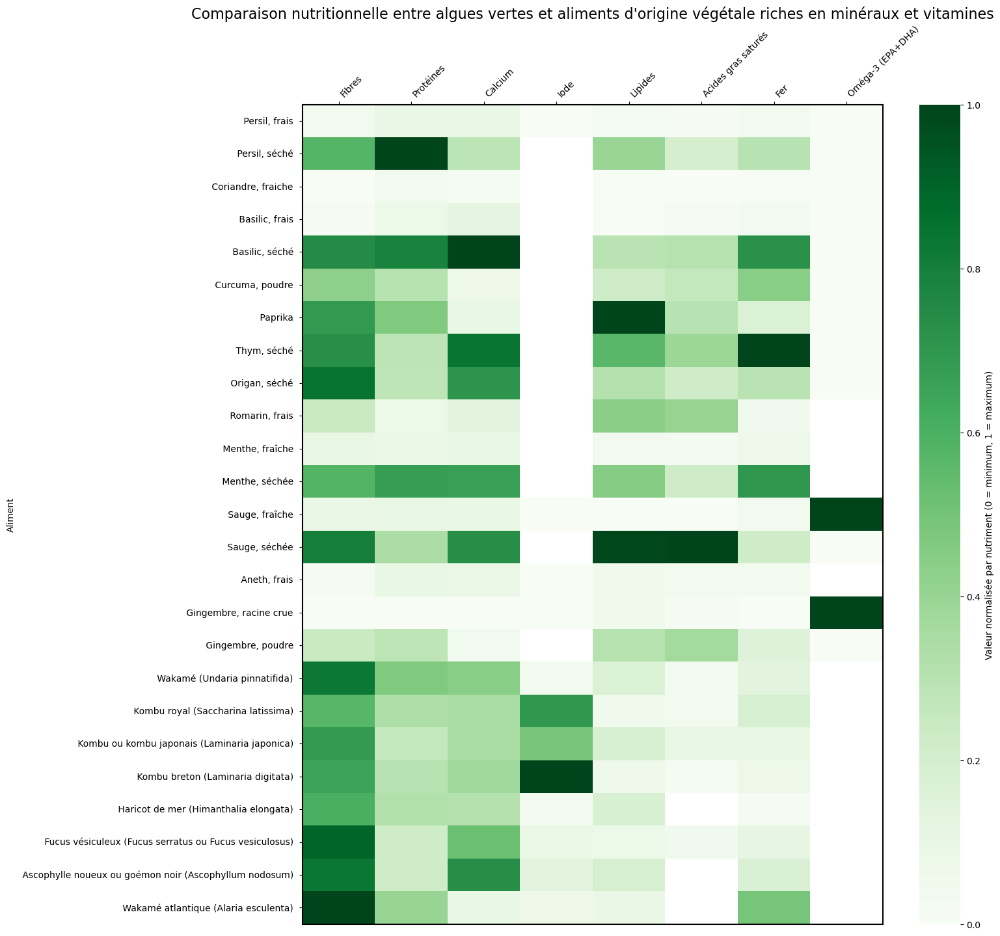

In [545]:
# Define nutrient label mapping
nutrient_label_map = {
    "Fibres (g/100g)": "Fibres",
    "Protein (g/100g)": "Protéines",
    "Calcium (mg/100g)": "Calcium",
    "Iodine (µg/100g)": "Iode",
    "Fat (g/100g)": "Lipides",
    "FA saturated (g/100g)": "Acides gras saturés",
    "Iron (mg/100g)": "Fer",
    "Omega-3 (EPA + DHA) (g/100g)": "Oméga-3 (EPA+DHA)"
}

def plot_single_heatmap(df_norm, title, seaweed_names, cmap_color='YlOrBr'):
    # Rename columns using the dictionary
    df_norm = df_norm.rename(columns=nutrient_label_map)

    plt.figure(figsize=(16, len(df_norm)*0.5 + 2))
    ax = sns.heatmap(
        df_norm,
        annot=False,
        cmap=cmap_color,
        cbar_kws={'label': 'Valeur normalisée par nutriment (0 = minimum, 1 = maximum)'}
    )
    ax.set_title(title, fontsize=16)
    ax.set_ylabel('Aliment')
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='left', fontsize=10)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=10)

    # Add border around the heatmap
    for _, spine in ax.spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Highlight only seaweed rows
    for y, label in enumerate(df_norm.index):
        if label in seaweed_names:
            ax.add_patch(plt.Rectangle(
                (0, y), len(df_norm.columns), 1,
                fill=False, edgecolor='red', lw=2, clip_on=False
            ))

    plt.tight_layout()
    plt.show()

# Extract seaweed names from df_norm using known seaweed IDs
seaweed_names_brown = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_brown_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown_plant_minerals_vitamins, "Comparaison nutritionnelle entre algues brunes et aliments d'origine végétale riches en minéraux et vitamines", seaweed_names=seaweed_names_brown, cmap_color="YlOrBr")

seaweed_names_red = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_red_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown_plant_minerals_vitamins, "Comparaison nutritionnelle entre algues rouges et aliments d'origine végétale riches en minéraux et vitamines", seaweed_names=seaweed_names_red, cmap_color="Reds")

seaweed_names_green = df_ciqual_nutrients_list_intl_cleaned.loc[index_list_green_seaweed, 'seaweed name French'].tolist()
plot_single_heatmap(df_brown_plant_minerals_vitamins, "Comparaison nutritionnelle entre algues vertes et aliments d'origine végétale riches en minéraux et vitamines", seaweed_names=seaweed_names_green, cmap_color="Greens")


# PCA with reduced nutrients and foods lists

### Prepare the data & keep the missing-value mask

In [546]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Step 1: Keep original with NaNs
df_pca_original = df_ciqual_nutrients_list_intl_cleaned[
    ['alim_nom_eng', 'alim_ssgrp_nom_eng', 'seaweed name French', 'alim_nom_fr'] + nutrients_list_step1
]

# Step 2: Create mask of missing nutrient values
nan_mask = df_pca_original[nutrients_list_step1].isna().any(axis=1)

# Step 3: Fill NaNs (for PCA only)
df_pca_filled = df_pca_original.copy()
df_pca_filled[nutrients_list_step1] = df_pca_filled[nutrients_list_step1].fillna(0)


### Run PCA

In [547]:
# Standardize numeric values
X_scaled = StandardScaler().fit_transform(df_pca_filled[nutrients_list_step1])

# Run PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(X_scaled)

# Create results DataFrame
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])
pca_df['alim_nom_eng'] = df_pca_filled['alim_nom_eng']
pca_df['alim_nom_fr'] = df_pca_filled['alim_nom_fr']
pca_df['seaweed_group'] = df_pca_filled['alim_ssgrp_nom_eng'].str.lower() == 'seaweed'
pca_df['has_missing'] = nan_mask  # True if any nutrient was missing


### Plot PCA with missing-value transparency

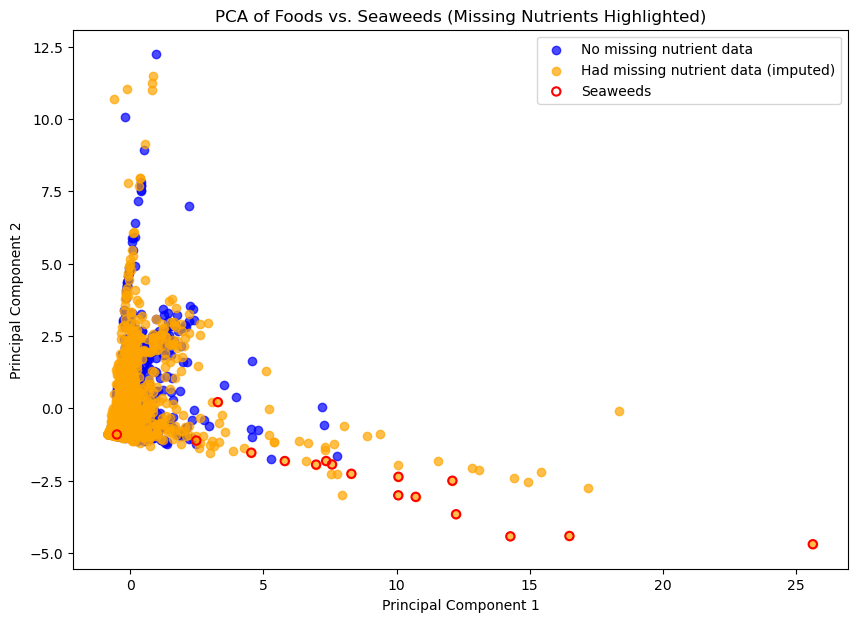

In [548]:

plt.figure(figsize=(10, 7))

# Foods with no missing data
plt.scatter(
    pca_df.loc[~pca_df['has_missing'], 'PC1'],
    pca_df.loc[~pca_df['has_missing'], 'PC2'],
    c='blue', label='No missing nutrient data', alpha=0.7
)

# Foods with missing data (imputed)
plt.scatter(
    pca_df.loc[pca_df['has_missing'], 'PC1'],
    pca_df.loc[pca_df['has_missing'], 'PC2'],
    c='orange', label='Had missing nutrient data (imputed)', alpha=0.7
)

# Highlight seaweeds
plt.scatter(
    pca_df.loc[pca_df['seaweed_group'], 'PC1'],
    pca_df.loc[pca_df['seaweed_group'], 'PC2'],
    edgecolor='red', facecolor='none', linewidth=1.5,
    label='Seaweeds'
)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.title("PCA of Foods vs. Seaweeds (Missing Nutrients Highlighted)")
plt.show()


## Visual: PCA plot to show how different seaweed groups compare to ALL other foods

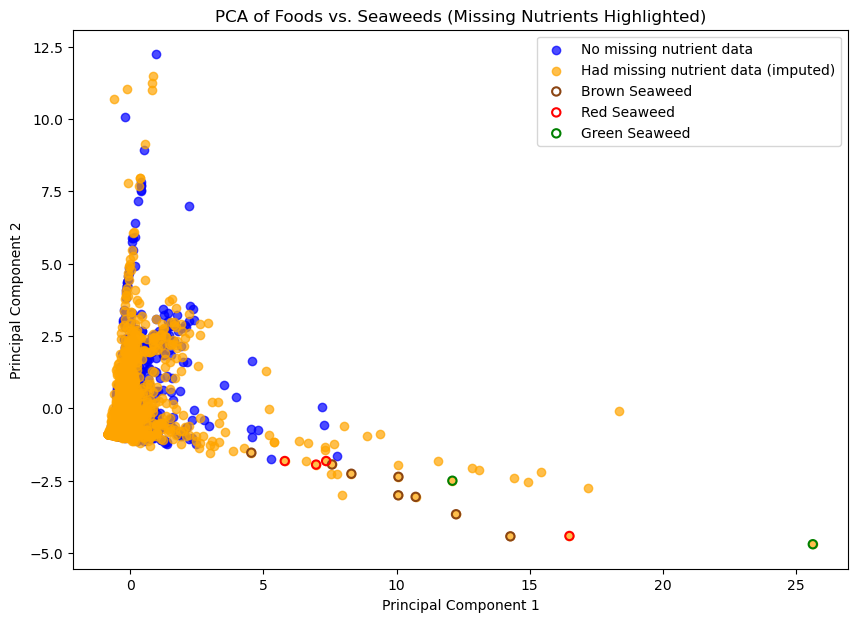

In [549]:
# Create boolean masks for each seaweed type
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

plt.figure(figsize=(10, 7))

# Foods with no missing data
plt.scatter(
    pca_df.loc[~pca_df['has_missing'], 'PC1'],
    pca_df.loc[~pca_df['has_missing'], 'PC2'],
    c='blue', label='No missing nutrient data', alpha=0.7
)

# Foods with missing data (imputed)
plt.scatter(
    pca_df.loc[pca_df['has_missing'], 'PC1'],
    pca_df.loc[pca_df['has_missing'], 'PC2'],
    c='orange', label='Had missing nutrient data (imputed)', alpha=0.7
)

# Highlight seaweeds by type
plt.scatter(
    pca_df.loc[pca_df['brown_seaweed'], 'PC1'],
    pca_df.loc[pca_df['brown_seaweed'], 'PC2'],
    edgecolor='saddlebrown', facecolor='none', linewidth=1.5, label='Brown Seaweed'
)

plt.scatter(
    pca_df.loc[pca_df['red_seaweed'], 'PC1'],
    pca_df.loc[pca_df['red_seaweed'], 'PC2'],
    edgecolor='red', facecolor='none', linewidth=1.5, label='Red Seaweed'
)

plt.scatter(
    pca_df.loc[pca_df['green_seaweed'], 'PC1'],
    pca_df.loc[pca_df['green_seaweed'], 'PC2'],
    edgecolor='green', facecolor='none', linewidth=1.5, label='Green Seaweed'
)

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.title("PCA of Foods vs. Seaweeds (Missing Nutrients Highlighted)")
plt.show()


## Visual: PCA plot to show how different seaweed types compare to animal and plant-based foods rich in protein (imputed values marked)

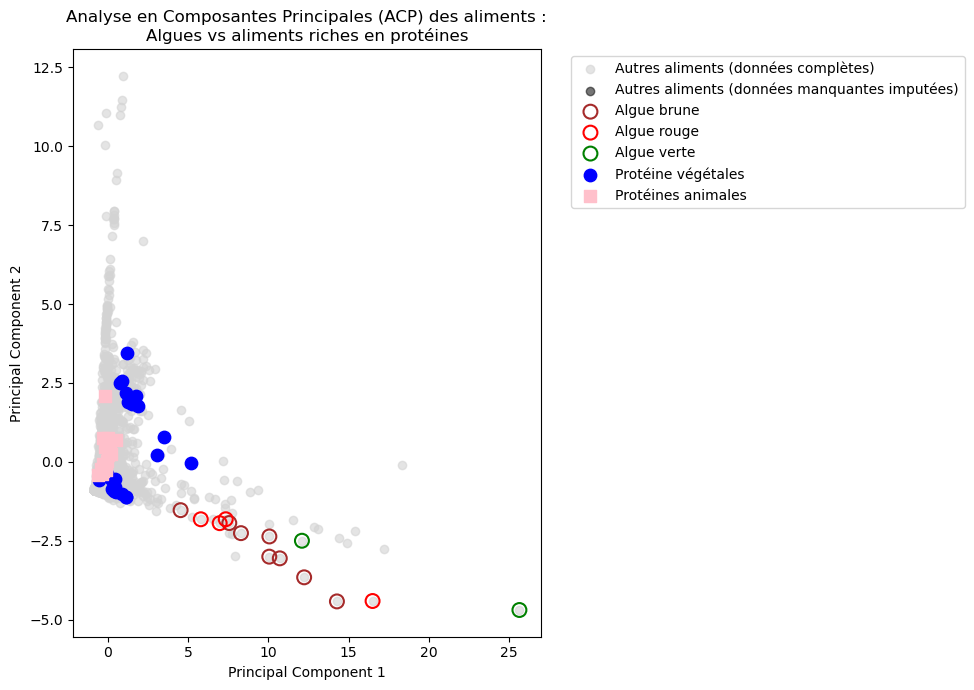

In [550]:
# ----------------------------
# Step 0: Prepare data
# ----------------------------
# df_pca_filled is your dataframe with all foods and nutrients, NaNs filled with 0
# nutrients_list_step1 contains the nutrients used for PCA

X_scaled = StandardScaler().fit_transform(df_pca_filled[nutrients_list_step1])

pca = PCA(n_components=2)
pca_results = pca.fit_transform(X_scaled)

# PCA results DataFrame
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])
pca_df['alim_nom_eng'] = df_pca_filled['alim_nom_eng']
pca_df['alim_nom_fr'] = df_pca_filled['alim_nom_fr']

# Flags for missing data
nan_mask = df_pca_filled[nutrients_list_step1].isna().any(axis=1)
pca_df['has_missing'] = nan_mask

# ----------------------------
# Step 1: Highlight food groups
# ----------------------------
# Seaweed groups
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed   = [3104, 3105, 3109, 3112]
index_list_green_seaweed = [3102, 3111]
# dictionaries food_selection_animal_protein and food_selection_plant_protein are defined in previous blocks

# ----------------------------
# Step 2: Create boolean masks
# ----------------------------
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

# Create boolean masks using the dictionary keys (indices)
pca_df['animal_protein'] = pca_df.index.isin(food_selection_animal_protein.keys())
pca_df['plant_protein'] = pca_df.index.isin(food_selection_plant_protein.keys())


# ----------------------------
# Step 3: Plot PCA
# ----------------------------
plt.figure(figsize=(10, 7))

# Foods with no missing data
plt.scatter(
    pca_df.loc[~pca_df['has_missing'], 'PC1'],
    pca_df.loc[~pca_df['has_missing'], 'PC2'],
    c='lightgrey', alpha=0.6, label='Autres aliments (données complètes)'
)

# Foods with missing data imputed
plt.scatter(
    pca_df.loc[pca_df['has_missing'], 'PC1'],
    pca_df.loc[pca_df['has_missing'], 'PC2'],
    c='#1a1a1a', alpha=0.6, label='Autres aliments (données manquantes imputées)'
)

# Seaweeds
plt.scatter(pca_df.loc[pca_df['brown_seaweed'], 'PC1'],
            pca_df.loc[pca_df['brown_seaweed'], 'PC2'],
            edgecolor='brown', facecolor='none', s=100, linewidth=1.5, label='Algue brune')

plt.scatter(pca_df.loc[pca_df['red_seaweed'], 'PC1'],
            pca_df.loc[pca_df['red_seaweed'], 'PC2'],
            edgecolor='red', facecolor='none', s=100, linewidth=1.5, label='Algue rouge')

plt.scatter(pca_df.loc[pca_df['green_seaweed'], 'PC1'],
            pca_df.loc[pca_df['green_seaweed'], 'PC2'],
            edgecolor='green', facecolor='none', s=100, linewidth=1.5, label='Algue verte')

# Highlight plant and animal proteins
plt.scatter(pca_df.loc[pca_df['plant_protein'], 'PC1'],
            pca_df.loc[pca_df['plant_protein'], 'PC2'],
            c='blue', marker='o', s=80, label='Protéine végétales')

plt.scatter(pca_df.loc[pca_df['animal_protein'], 'PC1'],
            pca_df.loc[pca_df['animal_protein'], 'PC2'],
            c='pink', marker='s', s=80, label='Protéines animales')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Analyse en Composantes Principales (ACP) des aliments :\nAlgues vs aliments riches en protéines")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [555]:
import plotly.express as px
import pandas as pd

# Ensure boolean masks exist
pca_df['animal_protein'] = pca_df.index.isin(food_selection_animal_protein.keys())
pca_df['plant_protein'] = pca_df.index.isin(food_selection_plant_protein.keys())
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

# Combine all group labels into a single column for color
def assign_group(row):
    if row['brown_seaweed']:
        return 'Algue brune'
    elif row['red_seaweed']:
        return 'Algue rouge'
    elif row['green_seaweed']:
        return 'Algue verte'
    elif row['plant_protein']:
        return 'Protéines végétales'
    elif row['animal_protein']:
        return 'Protéines animales'
    else:
        return 'Autres aliments'

pca_df['groupe'] = pca_df.apply(assign_group, axis=1)

# Color map
color_map = {
    'Algue brune': 'brown',
    'Algue rouge': 'red',
    'Algue verte': 'green',
    'Protéines végétales': 'blue',
    'Protéines animales': 'pink',
    'Autres aliments': 'lightgrey'
}

# Create interactive PCA plot
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='groupe',
    color_discrete_map=color_map,
    hover_name='alim_nom_fr',  # column name from df to use for food name on hover
    labels={'alim_nom_fr': 'Aliment'},  # change name of column as it appears when hovering
    title="Analyse en Composantes Principales (ACP) des aliments : Algues vs aliments riches en protéines"
)

fig.update_layout(width=1200, height=900) # make plot bigger

# Make markers bigger for seaweeds and proteins
marker_sizes = []
for g in pca_df['groupe']:
    if g in ['Algue brune', 'Algue rouge', 'Algue verte']:
        marker_sizes.append(15)
    elif g in ['Protéines végétales', 'Protéines animales']:
        marker_sizes.append(12)
    else:
        marker_sizes.append(8)

fig.update_traces(marker=dict(size=marker_sizes, line=dict(width=1, color='DarkSlateGrey')))

# Show interactive plot
fig.show()

# Save interactive HTML (can be opened outside VS Code)
fig.write_html("ACP_algues/pca_seaweed_proteins.html")


/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## Visual: PCA plot to show how different seaweed types compare to animal and plant-based foods rich in protein (imputed values not indicated)

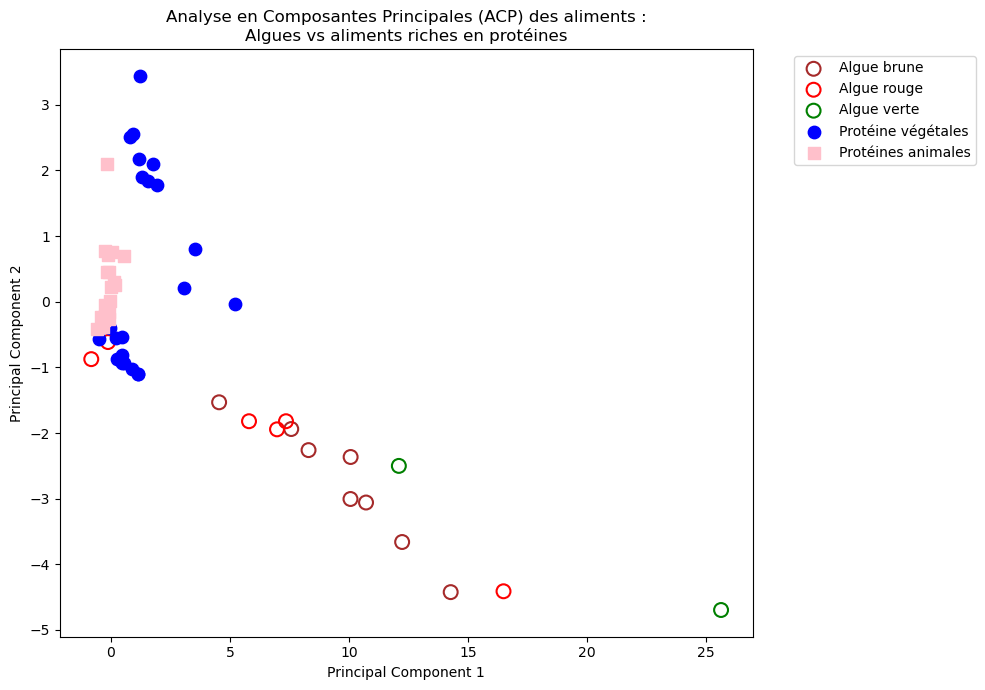

In [552]:
# ----------------------------
# Step 0: Prepare data
# ----------------------------
# df_pca_filled is your dataframe with all foods and nutrients, NaNs filled with 0
# nutrients_list_step1 contains the nutrients used for PCA

X_scaled = StandardScaler().fit_transform(df_pca_filled[nutrients_list_step1])

pca = PCA(n_components=2)
pca_results = pca.fit_transform(X_scaled)

# PCA results DataFrame
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])
pca_df['alim_nom_eng'] = df_pca_filled['alim_nom_eng']
pca_df['alim_nom_fr'] = df_pca_filled['alim_nom_fr']

# Flags for missing data
nan_mask = df_pca_filled[nutrients_list_step1].isna().any(axis=1)
pca_df['has_missing'] = nan_mask

# ----------------------------
# Step 1: Highlight food groups
# ----------------------------
# Seaweed groups
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed   = [3104, 3105, 3109, 3112, 3115, 3116]  # make sure all IDs included
index_list_green_seaweed = [3102, 3111]
# dictionaries food_selection_animal_protein and food_selection_plant_protein are defined in previous blocks

# ----------------------------
# Step 2: Create boolean masks
# ----------------------------
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

# Create boolean masks using the dictionary keys (indices)
pca_df['animal_protein'] = pca_df.index.isin(food_selection_animal_protein.keys())
pca_df['plant_protein'] = pca_df.index.isin(food_selection_plant_protein.keys())


# ----------------------------
# Step 3: Plot PCA
# ----------------------------
plt.figure(figsize=(10, 7))

# # Foods with no missing data
# plt.scatter(
#     pca_df.loc[~pca_df['has_missing'], 'PC1'],
#     pca_df.loc[~pca_df['has_missing'], 'PC2'],
#     c='lightgrey', alpha=0.6, label='Other foods (no missing data)'
# )

# # Foods with missing data imputed
# plt.scatter(
#     pca_df.loc[pca_df['has_missing'], 'PC1'],
#     pca_df.loc[pca_df['has_missing'], 'PC2'],
#     c='darkgrey', alpha=0.6, label='Other foods (imputed missing data)'
# )

# Seaweeds
plt.scatter(pca_df.loc[pca_df['brown_seaweed'], 'PC1'],
            pca_df.loc[pca_df['brown_seaweed'], 'PC2'],
            edgecolor='brown', facecolor='none', s=100, linewidth=1.5, label='Algue brune')

plt.scatter(pca_df.loc[pca_df['red_seaweed'], 'PC1'],
            pca_df.loc[pca_df['red_seaweed'], 'PC2'],
            edgecolor='red', facecolor='none', s=100, linewidth=1.5, label='Algue rouge')

plt.scatter(pca_df.loc[pca_df['green_seaweed'], 'PC1'],
            pca_df.loc[pca_df['green_seaweed'], 'PC2'],
            edgecolor='green', facecolor='none', s=100, linewidth=1.5, label='Algue verte')

# Highlight plant and animal proteins
plt.scatter(pca_df.loc[pca_df['plant_protein'], 'PC1'],
            pca_df.loc[pca_df['plant_protein'], 'PC2'],
            c='blue', marker='o', s=80, label='Protéine végétales')

plt.scatter(pca_df.loc[pca_df['animal_protein'], 'PC1'],
            pca_df.loc[pca_df['animal_protein'], 'PC2'],
            c='pink', marker='s', s=80, label='Protéines animales')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Analyse en Composantes Principales (ACP) des aliments :\nAlgues vs aliments riches en protéines")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



In [553]:
import plotly.express as px
import pandas as pd

# Ensure boolean masks exist
pca_df['animal_protein'] = pca_df.index.isin(food_selection_animal_protein.keys())
pca_df['plant_protein'] = pca_df.index.isin(food_selection_plant_protein.keys())
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

# Combine all group labels into a single column for color
def assign_group(row):
    if row['brown_seaweed']:
        return 'Algue brune'
    elif row['red_seaweed']:
        return 'Algue rouge'
    elif row['green_seaweed']:
        return 'Algue verte'
    elif row['plant_protein']:
        return 'Protéines végétales'
    elif row['animal_protein']:
        return 'Protéines animales'
    else:
        return

pca_df['groupe'] = pca_df.apply(assign_group, axis=1)

# Color map
color_map = {
    'Algue brune': 'brown',
    'Algue rouge': 'red',
    'Algue verte': 'green',
    'Protéines végétales': 'blue',
    'Protéines animales': 'pink',
    'Autres aliments': 'lightgrey'
}

# Create interactive PCA plot
fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    color='groupe',
    color_discrete_map=color_map,
    hover_name='alim_nom_fr',  # column name from df to use for food name on hover
    labels={'alim_nom_fr': 'Aliment'},  # change name of column as it appears when hovering
    title="Analyse en Composantes Principales (ACP) des aliments : Algues vs aliments riches en protéines"
)

fig.update_layout(width=1200, height=900) # make plot bigger

# Make markers bigger for seaweeds and proteins
marker_sizes = []
for g in pca_df['groupe']:
    if g in ['Algue brune', 'Algue rouge', 'Algue verte']:
        marker_sizes.append(15)
    elif g in ['Protéines végétales', 'Protéines animales']:
        marker_sizes.append(12)
    else:
        marker_sizes.append(8)

fig.update_traces(marker=dict(size=marker_sizes, line=dict(width=1, color='DarkSlateGrey')))

# Show interactive plot
fig.show()

# Save interactive HTML (can be opened outside VS Code)
fig.write_html("pca_seaweed_proteins.html")


/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## Visual: PCA plot to show how different seaweed types compare to animal and plant-based foods rich in fibre (imputed values not indicated)

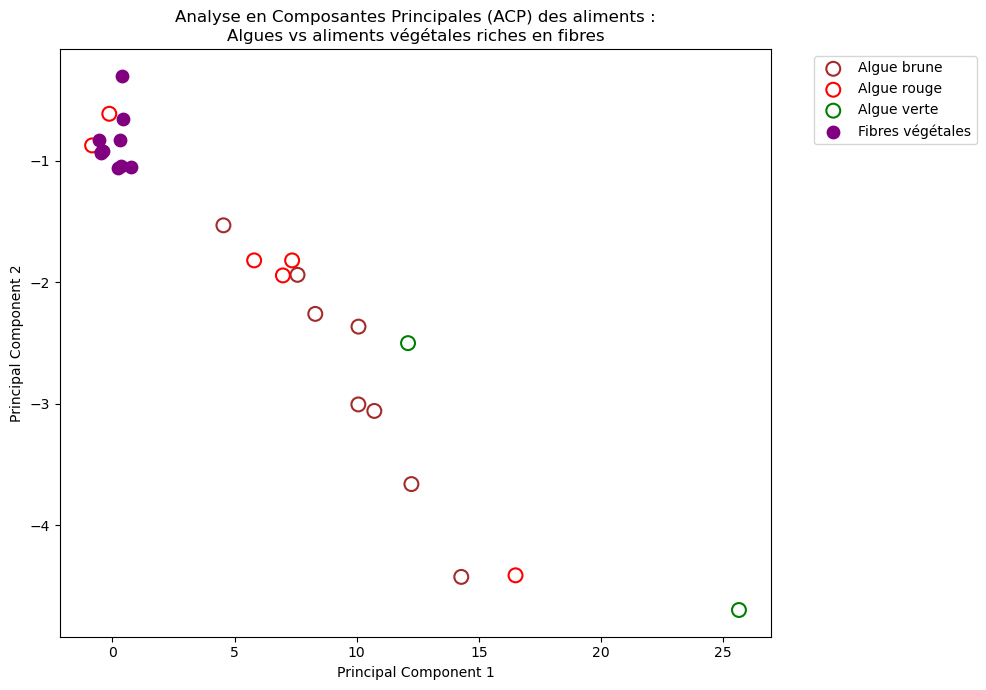

In [554]:
# ----------------------------
# Step 0: Prepare data
# ----------------------------
# df_pca_filled is your dataframe with all foods and nutrients, NaNs filled with 0
# nutrients_list_step1 contains the nutrients used for PCA

X_scaled = StandardScaler().fit_transform(df_pca_filled[nutrients_list_step1])

pca = PCA(n_components=2)
pca_results = pca.fit_transform(X_scaled)

# PCA results DataFrame
pca_df = pd.DataFrame(pca_results, columns=['PC1', 'PC2'])
pca_df['alim_nom_eng'] = df_pca_filled['alim_nom_eng']
pca_df['alim_nom_fr'] = df_pca_filled['alim_nom_fr']


# Flags for missing data
nan_mask = df_pca_filled[nutrients_list_step1].isna().any(axis=1)
pca_df['has_missing'] = nan_mask

# ----------------------------
# Step 1: Highlight food groups
# ----------------------------
# Seaweed groups
index_list_brown_seaweed = [3101, 3103, 3106, 3107, 3108, 3110, 3113, 3114]
index_list_red_seaweed   = [3104, 3105, 3109, 3112, 3115, 3116]  # make sure all IDs included
index_list_green_seaweed = [3102, 3111]
# dictionaries food_selection_animal_protein and food_selection_plant_protein are defined in previous blocks

# ----------------------------
# Step 2: Create boolean masks
# ----------------------------
pca_df['brown_seaweed'] = pca_df.index.isin(index_list_brown_seaweed)
pca_df['red_seaweed']   = pca_df.index.isin(index_list_red_seaweed)
pca_df['green_seaweed'] = pca_df.index.isin(index_list_green_seaweed)

# Create boolean masks using the dictionary keys (indices)
pca_df['plant_fibre'] = pca_df.index.isin(food_selection_plant_fibre.keys())


# ----------------------------
# Step 3: Plot PCA
# ----------------------------
plt.figure(figsize=(10, 7))

# # Foods with no missing data
# plt.scatter(
#     pca_df.loc[~pca_df['has_missing'], 'PC1'],
#     pca_df.loc[~pca_df['has_missing'], 'PC2'],
#     c='lightgrey', alpha=0.6, label='Other foods (no missing data)'
# )

# # Foods with missing data imputed
# plt.scatter(
#     pca_df.loc[pca_df['has_missing'], 'PC1'],
#     pca_df.loc[pca_df['has_missing'], 'PC2'],
#     c='darkgrey', alpha=0.6, label='Other foods (imputed missing data)'
# )

# Seaweeds
plt.scatter(pca_df.loc[pca_df['brown_seaweed'], 'PC1'],
            pca_df.loc[pca_df['brown_seaweed'], 'PC2'],
            edgecolor='brown', facecolor='none', s=100, linewidth=1.5, label='Algue brune')

plt.scatter(pca_df.loc[pca_df['red_seaweed'], 'PC1'],
            pca_df.loc[pca_df['red_seaweed'], 'PC2'],
            edgecolor='red', facecolor='none', s=100, linewidth=1.5, label='Algue rouge')

plt.scatter(pca_df.loc[pca_df['green_seaweed'], 'PC1'],
            pca_df.loc[pca_df['green_seaweed'], 'PC2'],
            edgecolor='green', facecolor='none', s=100, linewidth=1.5, label='Algue verte')

# Highlight plant fibres
plt.scatter(pca_df.loc[pca_df['plant_fibre'], 'PC1'],
            pca_df.loc[pca_df['plant_fibre'], 'PC2'],
            c='purple', marker='o', s=80, label='Fibres végétales')


plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("Analyse en Composantes Principales (ACP) des aliments :\nAlgues vs aliments végétales riches en fibres")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

